In [1]:
# Core Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from scipy import stats
from scipy.stats import randint, uniform

## IMPORT & EXPLORE

In [2]:
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F

In [143]:
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to('cpu')
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

config.json: 0.00B [00:00, ?B/s]

c:\Users\User\anaconda3\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\User\.cache\huggingface\hub\models--openai--clip-vit-base-patch32. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP downloa

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [3]:
from sentence_transformers import SentenceTransformer

In [4]:
from torchvision import transforms
from PIL import Image
import torch

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])

In [5]:
all_products_combined = pd.read_csv(r"C:\Users\User\OneDrive\Desktop\warehouse\flip_vlm\flip_data_vlm\all_products_combined.csv") 

In [6]:
all_products_combined['windows_image_path'] = (
    "C:\\Users\\User\\OneDrive\\Desktop\\warehouse\\flip_vlm\\flip_data_vlm\\" +
    all_products_combined['local_image_path']
        .fillna("")
        .astype(str)
        .apply(lambda x: x.split("flip/data/")[-1])
)

## CLEAN & PREPARE

In [47]:
device = 'cuda'

In [48]:
class FlipDualEncoderv2(nn.Module):
    def __init__(self, embedding_dim=256, device=device):
        super().__init__()
        self.device = device

        # ResNet50 as visual encoder
        resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        resnet50.fc = nn.Identity()
        self.visual_encoder = resnet50.to(device)
        self.image_projection = nn.Linear(2048, embedding_dim).to(device)

        # LaBSE as text encoder
        self.text_encoder = SentenceTransformer('sentence-transformers/LaBSE').to(device)
        self.text_projection = nn.Linear(768, embedding_dim).to(device)

    def forward(self, images=None, texts=None):
        image_embedding = None
        text_embedding = None

        if images is not None:
            print(f"📸 Got image tensor with shape: {images.shape}")
            try:
                image_encoded = self.visual_encoder(images)
                print("✅ ResNet output:", image_encoded.shape)
                image_embedding = F.normalize(self.image_projection(image_encoded), p=2, dim=-1)
                print("✅ Image embedding:", image_embedding.shape)
            except Exception as e:
                print(f"❌ Image encoding failed: {e}")

        if texts is not None:
            try:
                with torch.no_grad():
                    text_features = self.text_encoder.encode(
                        texts, convert_to_tensor=True, normalize_embeddings=False
                    )
                text_features = text_features.to(self.device)  # ✅ critical fix
                text_embedding = self.text_projection(text_features)
                text_embedding = F.normalize(text_embedding, p=2, dim=-1)
            except Exception as e:
                print(f"❌ Text encoding failed: {e}")

        print("🔁 Final image_embedding:", type(image_embedding), image_embedding.shape if image_embedding is not None else None)
        print("🔁 Final text_embedding:", type(text_embedding), text_embedding.shape if text_embedding is not None else None)
        
        return image_embedding, text_embedding


In [49]:
torch.cuda.get_device_properties()

_CudaDeviceProperties(name='NVIDIA GeForce RTX 3050 Laptop GPU', major=8, minor=6, total_memory=4095MB, multi_processor_count=16, uuid=15678e8c-abb7-821b-a8bf-1798d0455d2e, L2_cache_size=1MB)

In [30]:
flup_dual_encoderv2 = FlipDualEncoderv2().to(device)

In [50]:
flup_dual_encoderv2.load_state_dict( torch.load(r"C:\Users\User\OneDrive\Desktop\warehouse\flip_vlm\models\flip_dual_encoder18k.pt", map_location = 'cuda') )

<All keys matched successfully>

In [51]:
flup_dual_encoderv2.eval()

FlipDualEncoderv2(
  (visual_encoder): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Seque

In [33]:
def encode_single_image(image_path, model, transform, device="cpu"):
    try:
        img = Image.open(image_path).convert("RGB")
        img_tensor = transform(img).unsqueeze(0).to(device)

        print(f"🖼️ Image tensor shape: {img_tensor.shape}")

        model.eval()
        with torch.no_grad():
            image_embedding, _ = model(img_tensor, texts=None)

        if image_embedding is None:
            print("❌ image_embedding is None!")
            return None

        return image_embedding.squeeze(0).cpu().numpy().tolist()

    except Exception as e:
        print(f"❌ Exception during image processing: {e}")
        return None

In [52]:
embed = encode_single_image(
    r"C:\Users\User\OneDrive\Desktop\warehouse\flip_vlm\flip_data_vlm\category_2\images\Аромадиффузор_ароматический_Ананас_1173.jpg",
    model=flup_dual_encoderv2,
    transform=transform,
    device=device
)

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


## TEST

In [39]:
from tqdm import tqdm
from sklearn.metrics.pairwise import cosine_similarity

In [43]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class ImagePathDataset(Dataset):
    def __init__(self, image_paths, transform):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        path = self.image_paths[idx]
        try:
            image = Image.open(path).convert("RGB")
            image = self.transform(image)
        except Exception as e:
            print(f"❌ Failed to load {path}: {e}")
            image = torch.zeros((3, 224, 224))  # or your transform output shape
        return image, path

In [44]:
images_dataset = ImagePathDataset( all_products_combined['windows_image_path'].tolist(), transform=transform )

In [54]:
len(images_dataset)

18080

In [45]:
images_dataloader = DataLoader( images_dataset, batch_size = 32, shuffle=True )

In [58]:
image_embeddings = []

for path in tqdm(all_products_combined['windows_image_path']):
    embedding = encode_single_image(path, flup_dual_encoderv2.to('cpu'), transform)
    image_embeddings.append(embedding)

all_products_combined['image_embedding'] = image_embeddings

  0%|          | 1/18080 [00:00<4:05:24,  1.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|          | 5/18080 [00:01<49:38,  6.07it/s]  

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 9/18080 [00:01<29:58, 10.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  0%|          | 13/18080 [00:01<23:52, 12.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 15/18080 [00:01<22:05, 13.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  0%|          | 19/18080 [00:01<19:56, 15.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 23/18080 [00:02<18:34, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 27/18080 [00:02<18:40, 16.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 31/18080 [00:02<19:36, 15.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  0%|          | 33/18080 [00:02<19:14, 15.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  0%|          | 37/18080 [00:03<20:16, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 41/18080 [00:03<18:35, 16.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 45/18080 [00:03<18:04, 16.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 49/18080 [00:03<18:41, 16.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|          | 53/18080 [00:04<18:33, 16.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 55/18080 [00:04<18:53, 15.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  0%|          | 59/18080 [00:04<18:31, 16.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 63/18080 [00:04<18:48, 15.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 67/18080 [00:04<18:24, 16.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  0%|          | 71/18080 [00:05<18:08, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 73/18080 [00:05<19:00, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  0%|          | 75/18080 [00:05<21:44, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|          | 79/18080 [00:05<19:44, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 83/18080 [00:06<18:59, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  0%|          | 87/18080 [00:06<18:47, 15.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 91/18080 [00:06<18:36, 16.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 95/18080 [00:06<18:43, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 99/18080 [00:06<18:19, 16.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 101/18080 [00:07<19:07, 15.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 105/18080 [00:07<19:02, 15.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 109/18080 [00:07<18:59, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 111/18080 [00:07<18:47, 15.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|          | 115/18080 [00:08<19:33, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 119/18080 [00:08<18:45, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 123/18080 [00:08<19:09, 15.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 125/18080 [00:08<18:40, 16.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 129/18080 [00:08<19:26, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 131/18080 [00:09<18:37, 16.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 135/18080 [00:09<18:13, 16.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 139/18080 [00:09<18:46, 15.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 141/18080 [00:09<17:39, 16.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 145/18080 [00:09<18:10, 16.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 149/18080 [00:10<19:46, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 153/18080 [00:10<19:20, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 157/18080 [00:10<18:44, 15.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 161/18080 [00:10<18:04, 16.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 163/18080 [00:11<17:52, 16.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 166/18080 [00:11<17:33, 17.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|          | 170/18080 [00:11<18:14, 16.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 174/18080 [00:11<18:27, 16.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 178/18080 [00:11<17:57, 16.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 182/18080 [00:12<19:26, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 186/18080 [00:12<18:31, 16.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 190/18080 [00:12<19:08, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 194/18080 [00:12<18:04, 16.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 198/18080 [00:13<17:42, 16.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 200/18080 [00:13<18:18, 16.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 204/18080 [00:13<19:04, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 206/18080 [00:13<19:02, 15.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|          | 210/18080 [00:13<17:56, 16.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 214/18080 [00:14<20:20, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|          | 218/18080 [00:14<19:31, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|          | 220/18080 [00:14<19:00, 15.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|          | 224/18080 [00:14<19:06, 15.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|▏         | 228/18080 [00:15<18:00, 16.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 232/18080 [00:15<17:33, 16.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 236/18080 [00:15<18:35, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 240/18080 [00:15<17:15, 17.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 244/18080 [00:16<17:10, 17.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 246/18080 [00:16<20:24, 14.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▏         | 250/18080 [00:16<19:04, 15.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 252/18080 [00:16<19:15, 15.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  1%|▏         | 256/18080 [00:16<18:57, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 260/18080 [00:17<18:44, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 264/18080 [00:17<17:52, 16.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  1%|▏         | 268/18080 [00:17<17:35, 16.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 272/18080 [00:17<18:02, 16.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 276/18080 [00:18<18:19, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 280/18080 [00:18<19:24, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 284/18080 [00:18<18:21, 16.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 288/18080 [00:18<17:43, 16.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 293/18080 [00:19<17:35, 16.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 297/18080 [00:19<18:01, 16.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 301/18080 [00:19<17:06, 17.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 305/18080 [00:19<18:45, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 307/18080 [00:20<19:07, 15.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 311/18080 [00:20<19:54, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 315/18080 [00:20<18:43, 15.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 319/18080 [00:20<18:47, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 321/18080 [00:20<18:21, 16.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 325/18080 [00:21<18:10, 16.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 329/18080 [00:21<18:58, 15.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|▏         | 331/18080 [00:21<18:51, 15.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|▏         | 335/18080 [00:21<18:29, 15.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 339/18080 [00:22<18:02, 16.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 341/18080 [00:22<19:33, 15.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|▏         | 346/18080 [00:22<17:08, 17.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 348/18080 [00:22<17:25, 16.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 352/18080 [00:22<17:25, 16.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 356/18080 [00:23<17:11, 17.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 360/18080 [00:23<17:20, 17.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 364/18080 [00:23<16:42, 17.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 368/18080 [00:23<17:45, 16.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 372/18080 [00:24<17:51, 16.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 376/18080 [00:24<18:58, 15.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|▏         | 378/18080 [00:24<18:20, 16.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 382/18080 [00:24<17:45, 16.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 386/18080 [00:24<18:48, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 390/18080 [00:25<18:36, 15.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 394/18080 [00:25<19:06, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 396/18080 [00:25<18:30, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 400/18080 [00:25<18:58, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 402/18080 [00:25<21:03, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|▏         | 406/18080 [00:26<19:17, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 410/18080 [00:26<18:37, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 414/18080 [00:26<18:27, 15.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 418/18080 [00:26<19:49, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|▏         | 422/18080 [00:27<18:49, 15.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 424/18080 [00:27<18:55, 15.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|▏         | 428/18080 [00:27<18:54, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 430/18080 [00:27<21:20, 13.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|▏         | 434/18080 [00:28<20:20, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  2%|▏         | 438/18080 [00:28<19:49, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|▏         | 440/18080 [00:28<19:44, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|▏         | 444/18080 [00:28<19:46, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|▏         | 446/18080 [00:28<19:53, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  2%|▏         | 450/18080 [00:29<18:50, 15.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 454/18080 [00:29<21:15, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|▎         | 456/18080 [00:29<20:20, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 460/18080 [00:29<18:52, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 464/18080 [00:30<18:41, 15.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 468/18080 [00:30<18:16, 16.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 472/18080 [00:30<18:02, 16.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 476/18080 [00:30<18:09, 16.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 480/18080 [00:31<19:11, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 482/18080 [00:31<17:57, 16.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 486/18080 [00:31<17:56, 16.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 490/18080 [00:31<18:08, 16.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 494/18080 [00:31<17:28, 16.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 498/18080 [00:32<20:42, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|▎         | 500/18080 [00:32<20:21, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 504/18080 [00:32<19:17, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 508/18080 [00:32<18:41, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 512/18080 [00:33<18:39, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 514/18080 [00:33<18:34, 15.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 518/18080 [00:33<19:12, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 522/18080 [00:33<18:34, 15.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 524/18080 [00:33<19:58, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 528/18080 [00:34<19:38, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 532/18080 [00:34<19:31, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|▎         | 534/18080 [00:34<19:41, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 536/18080 [00:34<20:13, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 540/18080 [00:34<20:01, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 544/18080 [00:35<19:33, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 546/18080 [00:35<19:32, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 550/18080 [00:35<21:06, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 554/18080 [00:35<20:24, 14.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|▎         | 556/18080 [00:36<20:17, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 560/18080 [00:36<19:29, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 562/18080 [00:36<19:32, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 564/18080 [00:36<19:23, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 568/18080 [00:36<20:23, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 570/18080 [00:37<21:21, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 574/18080 [00:37<20:43, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 576/18080 [00:37<20:37, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 580/18080 [00:37<19:56, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 582/18080 [00:37<19:59, 14.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 586/18080 [00:38<21:11, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


  3%|▎         | 590/18080 [00:38<18:55, 15.40it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

  3%|▎         | 594/18080 [00:38<18:28, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 598/18080 [00:38<18:47, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 600/18080 [00:39<18:21, 15.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 604/18080 [00:39<18:41, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 608/18080 [00:39<18:58, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 612/18080 [00:39<18:32, 15.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 616/18080 [00:40<18:53, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  3%|▎         | 618/18080 [00:40<18:47, 15.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  3%|▎         | 622/18080 [00:40<19:41, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 624/18080 [00:40<19:48, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 628/18080 [00:40<21:24, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|▎         | 632/18080 [00:41<19:31, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 634/18080 [00:41<19:07, 15.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▎         | 638/18080 [00:41<18:26, 15.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 642/18080 [00:41<17:56, 16.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 646/18080 [00:42<17:45, 16.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 650/18080 [00:42<17:36, 16.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 654/18080 [00:42<19:34, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 658/18080 [00:42<19:10, 15.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 662/18080 [00:43<18:47, 15.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▎         | 666/18080 [00:43<18:49, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 668/18080 [00:43<18:59, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▎         | 672/18080 [00:43<18:27, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▎         | 674/18080 [00:43<18:46, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 678/18080 [00:44<19:59, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 682/18080 [00:44<19:05, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 684/18080 [00:44<18:52, 15.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 688/18080 [00:44<18:43, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 692/18080 [00:45<18:02, 16.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 696/18080 [00:45<17:19, 16.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 700/18080 [00:45<17:26, 16.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 704/18080 [00:45<19:44, 14.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 708/18080 [00:46<18:04, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 712/18080 [00:46<17:56, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 714/18080 [00:46<19:20, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 718/18080 [00:46<19:43, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 720/18080 [00:46<19:00, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|▍         | 724/18080 [00:47<19:11, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 726/18080 [00:47<18:57, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 730/18080 [00:47<20:03, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 734/18080 [00:47<18:39, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 738/18080 [00:48<18:46, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 740/18080 [00:48<18:23, 15.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 744/18080 [00:48<18:22, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 748/18080 [00:48<18:00, 16.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 750/18080 [00:48<19:48, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 754/18080 [00:49<19:43, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 758/18080 [00:49<18:35, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 760/18080 [00:49<18:20, 15.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 764/18080 [00:49<18:13, 15.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 768/18080 [00:50<17:55, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 772/18080 [00:50<20:17, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 776/18080 [00:50<19:04, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 778/18080 [00:50<18:41, 15.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 782/18080 [00:50<18:33, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 786/18080 [00:51<18:06, 15.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 790/18080 [00:51<17:19, 16.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 794/18080 [00:51<17:28, 16.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 798/18080 [00:51<19:54, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|▍         | 802/18080 [00:52<19:38, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 804/18080 [00:52<18:48, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  4%|▍         | 808/18080 [00:52<17:55, 16.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  4%|▍         | 812/18080 [00:52<17:24, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 816/18080 [00:53<17:31, 16.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 820/18080 [00:53<17:02, 16.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 824/18080 [00:53<16:56, 16.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 828/18080 [00:53<18:21, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|▍         | 832/18080 [00:54<17:40, 16.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 836/18080 [00:54<16:25, 17.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 840/18080 [00:54<16:31, 17.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 844/18080 [00:54<16:47, 17.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 847/18080 [00:54<16:19, 17.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▍         | 851/18080 [00:55<16:38, 17.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 853/18080 [00:55<16:53, 16.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▍         | 857/18080 [00:55<18:31, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|▍         | 861/18080 [00:55<17:36, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 865/18080 [00:55<17:04, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 869/18080 [00:56<17:04, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 873/18080 [00:56<16:53, 16.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 877/18080 [00:56<16:57, 16.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 879/18080 [00:56<16:57, 16.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▍         | 883/18080 [00:57<17:58, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 885/18080 [00:57<17:19, 16.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|▍         | 889/18080 [00:57<18:50, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 893/18080 [00:57<17:19, 16.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 898/18080 [00:57<16:48, 17.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▍         | 900/18080 [00:58<16:34, 17.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▌         | 904/18080 [00:58<16:38, 17.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 908/18080 [00:58<16:32, 17.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 912/18080 [00:58<16:29, 17.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 916/18080 [00:59<17:54, 15.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|▌         | 920/18080 [00:59<17:53, 15.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 922/18080 [00:59<18:07, 15.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▌         | 926/18080 [00:59<17:55, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 930/18080 [00:59<17:44, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 934/18080 [01:00<17:18, 16.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 938/18080 [01:00<18:14, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 942/18080 [01:00<16:52, 16.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▌         | 946/18080 [01:00<18:50, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 948/18080 [01:01<18:05, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▌         | 952/18080 [01:01<18:02, 15.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 956/18080 [01:01<17:15, 16.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▌         | 960/18080 [01:01<17:16, 16.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 962/18080 [01:01<17:02, 16.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  5%|▌         | 966/18080 [01:02<17:03, 16.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 970/18080 [01:02<18:46, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|▌         | 974/18080 [01:02<17:39, 16.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 976/18080 [01:02<18:54, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|▌         | 980/18080 [01:03<17:40, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 984/18080 [01:03<17:04, 16.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 988/18080 [01:03<16:07, 17.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  5%|▌         | 992/18080 [01:03<16:20, 17.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 996/18080 [01:03<16:03, 17.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1000/18080 [01:04<16:13, 17.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|▌         | 1004/18080 [01:04<17:30, 16.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1008/18080 [01:04<17:30, 16.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1010/18080 [01:04<16:36, 17.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1014/18080 [01:05<16:18, 17.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1018/18080 [01:05<16:37, 17.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1022/18080 [01:05<16:37, 17.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1026/18080 [01:05<17:48, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|▌         | 1030/18080 [01:06<17:50, 15.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1032/18080 [01:06<17:20, 16.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1036/18080 [01:06<17:37, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1040/18080 [01:06<16:34, 17.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1044/18080 [01:06<16:28, 17.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1048/18080 [01:07<17:13, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1050/18080 [01:07<17:06, 16.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1054/18080 [01:07<18:40, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|▌         | 1058/18080 [01:07<17:57, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1060/18080 [01:07<17:32, 16.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1064/18080 [01:08<17:01, 16.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1068/18080 [01:08<17:23, 16.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1072/18080 [01:08<17:03, 16.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1076/18080 [01:08<16:43, 16.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1080/18080 [01:09<16:57, 16.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1082/18080 [01:09<16:52, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|▌         | 1086/18080 [01:09<18:06, 15.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1090/18080 [01:09<17:14, 16.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1094/18080 [01:09<16:48, 16.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1098/18080 [01:10<17:55, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|▌         | 1100/18080 [01:10<17:15, 16.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1104/18080 [01:10<17:37, 16.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1108/18080 [01:10<17:45, 15.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1112/18080 [01:11<18:46, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1116/18080 [01:11<17:38, 16.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1120/18080 [01:11<17:35, 16.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▌         | 1124/18080 [01:11<16:32, 17.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▌         | 1128/18080 [01:11<16:25, 17.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1132/18080 [01:12<16:47, 16.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1134/18080 [01:12<16:31, 17.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▋         | 1138/18080 [01:12<17:20, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1142/18080 [01:12<16:51, 16.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1146/18080 [01:13<16:45, 16.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1150/18080 [01:13<17:07, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1154/18080 [01:13<16:35, 17.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1158/18080 [01:13<16:05, 17.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1162/18080 [01:13<15:45, 17.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1166/18080 [01:14<17:27, 16.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  6%|▋         | 1169/18080 [01:14<16:44, 16.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  6%|▋         | 1173/18080 [01:14<15:57, 17.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1177/18080 [01:14<16:44, 16.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1181/18080 [01:15<16:26, 17.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1186/18080 [01:15<15:33, 18.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1190/18080 [01:15<15:54, 17.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1192/18080 [01:15<16:02, 17.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1196/18080 [01:16<17:38, 15.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1200/18080 [01:16<17:12, 16.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1204/18080 [01:16<17:15, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1209/18080 [01:16<16:26, 17.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1213/18080 [01:17<15:57, 17.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1217/18080 [01:17<16:53, 16.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1219/18080 [01:17<18:09, 15.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1223/18080 [01:17<17:14, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1227/18080 [01:17<16:42, 16.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1231/18080 [01:18<17:20, 16.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1235/18080 [01:18<16:22, 17.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1239/18080 [01:18<16:07, 17.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1241/18080 [01:18<17:31, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|▋         | 1245/18080 [01:18<16:50, 16.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1249/18080 [01:19<16:59, 16.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1253/18080 [01:19<16:34, 16.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1257/18080 [01:19<16:13, 17.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1261/18080 [01:19<16:22, 17.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1265/18080 [01:20<19:03, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|▋         | 1269/18080 [01:20<17:30, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1271/18080 [01:20<17:10, 16.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1276/18080 [01:20<16:15, 17.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1280/18080 [01:21<17:03, 16.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1282/18080 [01:21<16:48, 16.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1286/18080 [01:21<17:15, 16.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|▋         | 1288/18080 [01:21<17:37, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|▋         | 1292/18080 [01:21<17:55, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1296/18080 [01:22<17:42, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1300/18080 [01:22<17:41, 15.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1304/18080 [01:22<16:55, 16.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1306/18080 [01:22<16:07, 17.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1310/18080 [01:22<18:05, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|▋         | 1312/18080 [01:23<17:27, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1317/18080 [01:23<15:55, 17.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1321/18080 [01:23<16:05, 17.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  7%|▋         | 1325/18080 [01:23<16:40, 16.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1329/18080 [01:24<16:37, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1333/18080 [01:24<16:50, 16.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1337/18080 [01:24<18:05, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|▋         | 1339/18080 [01:24<17:33, 15.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1344/18080 [01:24<16:36, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1348/18080 [01:25<16:22, 17.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  7%|▋         | 1352/18080 [01:25<16:32, 16.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1357/18080 [01:25<15:49, 17.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1359/18080 [01:25<15:21, 18.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|▊         | 1363/18080 [01:26<16:33, 16.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1367/18080 [01:26<16:20, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1371/18080 [01:26<16:13, 17.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1375/18080 [01:26<15:40, 17.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1380/18080 [01:27<15:39, 17.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1382/18080 [01:27<16:25, 16.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1386/18080 [01:27<16:40, 16.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1390/18080 [01:27<16:26, 16.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1394/18080 [01:27<16:54, 16.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1398/18080 [01:28<16:27, 16.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1402/18080 [01:28<16:19, 17.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1404/18080 [01:28<15:40, 17.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1408/18080 [01:28<17:00, 16.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1412/18080 [01:28<16:18, 17.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1416/18080 [01:29<16:36, 16.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1420/18080 [01:29<16:17, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1424/18080 [01:29<16:23, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1428/18080 [01:29<16:07, 17.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1430/18080 [01:30<16:51, 16.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1434/18080 [01:30<16:54, 16.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1438/18080 [01:30<16:51, 16.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1442/18080 [01:30<16:28, 16.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1446/18080 [01:31<16:32, 16.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1450/18080 [01:31<16:48, 16.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1454/18080 [01:31<15:59, 17.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1458/18080 [01:31<17:32, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1462/18080 [01:32<16:49, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1466/18080 [01:32<16:43, 16.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1468/18080 [01:32<16:10, 17.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1472/18080 [01:32<16:16, 17.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1476/18080 [01:32<16:05, 17.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1480/18080 [01:33<17:21, 15.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1484/18080 [01:33<16:50, 16.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1488/18080 [01:33<16:21, 16.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1492/18080 [01:33<16:42, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1496/18080 [01:34<16:44, 16.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1500/18080 [01:34<16:14, 17.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1502/18080 [01:34<18:09, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|▊         | 1506/18080 [01:34<17:07, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1510/18080 [01:34<18:10, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1512/18080 [01:35<17:21, 15.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1516/18080 [01:35<16:37, 16.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1520/18080 [01:35<17:02, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1524/18080 [01:35<16:29, 16.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  8%|▊         | 1528/18080 [01:35<15:44, 17.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1532/18080 [01:36<16:38, 16.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|▊         | 1534/18080 [01:36<16:19, 16.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▊         | 1538/18080 [01:36<15:47, 17.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1542/18080 [01:36<15:55, 17.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1546/18080 [01:37<17:06, 16.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1550/18080 [01:37<17:12, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1555/18080 [01:37<15:54, 17.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1559/18080 [01:37<16:49, 16.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1561/18080 [01:37<16:51, 16.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▊         | 1565/18080 [01:38<17:59, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▊         | 1569/18080 [01:38<16:53, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1571/18080 [01:38<16:35, 16.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▊         | 1575/18080 [01:38<16:17, 16.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▊         | 1579/18080 [01:39<17:17, 15.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1583/18080 [01:39<17:17, 15.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1585/18080 [01:39<18:47, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1589/18080 [01:39<17:58, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1593/18080 [01:40<17:52, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1595/18080 [01:40<18:51, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1599/18080 [01:40<18:43, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1603/18080 [01:40<17:06, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1605/18080 [01:40<19:31, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1610/18080 [01:41<17:37, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1612/18080 [01:41<17:49, 15.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1616/18080 [01:41<17:28, 15.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1620/18080 [01:41<17:41, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1624/18080 [01:42<17:29, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1628/18080 [01:42<18:24, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1632/18080 [01:42<17:07, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1636/18080 [01:42<17:25, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1638/18080 [01:42<17:29, 15.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1642/18080 [01:43<18:45, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1646/18080 [01:43<17:42, 15.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1648/18080 [01:43<17:47, 15.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|▉         | 1652/18080 [01:43<17:27, 15.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1656/18080 [01:44<17:12, 15.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1658/18080 [01:44<17:35, 15.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1662/18080 [01:44<17:50, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1666/18080 [01:44<17:56, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1670/18080 [01:45<18:04, 15.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|▉         | 1672/18080 [01:45<17:35, 15.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|▉         | 1674/18080 [01:45<17:03, 16.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1678/18080 [01:45<18:18, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1682/18080 [01:45<17:10, 15.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1686/18080 [01:46<17:34, 15.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1690/18080 [01:46<17:53, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1694/18080 [01:46<17:33, 15.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1696/18080 [01:46<18:26, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1700/18080 [01:47<17:37, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  9%|▉         | 1704/18080 [01:47<17:47, 15.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|▉         | 1706/18080 [01:47<18:03, 15.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|▉         | 1710/18080 [01:47<17:48, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

  9%|▉         | 1712/18080 [01:47<17:54, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|▉         | 1716/18080 [01:48<18:59, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1720/18080 [01:48<19:11, 14.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1722/18080 [01:48<18:13, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1724/18080 [01:48<18:11, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 10%|▉         | 1728/18080 [01:48<17:17, 15.76it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 10%|▉         | 1732/18080 [01:49<17:10, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1736/18080 [01:49<18:29, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1740/18080 [01:49<17:58, 15.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1742/18080 [01:49<17:22, 15.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|▉         | 1746/18080 [01:50<17:41, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1750/18080 [01:50<18:23, 14.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1752/18080 [01:50<18:18, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|▉         | 1756/18080 [01:50<18:57, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|▉         | 1760/18080 [01:51<17:17, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1764/18080 [01:51<16:56, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1766/18080 [01:51<16:37, 16.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|▉         | 1770/18080 [01:51<16:43, 16.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1774/18080 [01:51<17:14, 15.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|▉         | 1778/18080 [01:52<18:26, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1780/18080 [01:52<17:38, 15.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1784/18080 [01:52<17:59, 15.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1786/18080 [01:52<17:42, 15.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1790/18080 [01:52<17:28, 15.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|▉         | 1792/18080 [01:53<18:28, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|▉         | 1796/18080 [01:53<18:57, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|▉         | 1798/18080 [01:53<18:43, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|▉         | 1802/18080 [01:53<18:25, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|▉         | 1806/18080 [01:54<17:41, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1808/18080 [01:54<17:22, 15.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|█         | 1812/18080 [01:54<18:22, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|█         | 1816/18080 [01:54<17:46, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1818/18080 [01:54<17:10, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|█         | 1822/18080 [01:55<17:29, 15.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1826/18080 [01:55<17:06, 15.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|█         | 1828/18080 [01:55<18:03, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|█         | 1832/18080 [01:55<18:00, 15.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1836/18080 [01:56<17:31, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|█         | 1840/18080 [01:56<17:19, 15.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1842/18080 [01:56<16:48, 16.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|█         | 1844/18080 [01:56<18:52, 14.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|█         | 1848/18080 [01:56<18:30, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1852/18080 [01:57<17:06, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1856/18080 [01:57<17:42, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1860/18080 [01:57<17:04, 15.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|█         | 1864/18080 [01:57<17:52, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1866/18080 [01:58<17:54, 15.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|█         | 1870/18080 [01:58<17:29, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|█         | 1872/18080 [01:58<17:38, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|█         | 1876/18080 [01:58<17:48, 15.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 10%|█         | 1878/18080 [01:58<18:03, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|█         | 1882/18080 [01:59<18:09, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1886/18080 [01:59<17:29, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1890/18080 [01:59<16:57, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1894/18080 [01:59<16:45, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 10%|█         | 1898/18080 [02:00<18:01, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1900/18080 [02:00<18:02, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1904/18080 [02:00<17:18, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1908/18080 [02:00<17:07, 15.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 11%|█         | 1912/18080 [02:00<16:22, 16.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1914/18080 [02:01<16:51, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1916/18080 [02:01<18:32, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1920/18080 [02:01<17:33, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1924/18080 [02:01<17:05, 15.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 11%|█         | 1928/18080 [02:02<16:22, 16.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1932/18080 [02:02<17:38, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1934/18080 [02:02<17:50, 15.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1938/18080 [02:02<18:02, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1940/18080 [02:02<17:51, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1944/18080 [02:03<17:52, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1946/18080 [02:03<17:13, 15.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1948/18080 [02:03<17:21, 15.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1952/18080 [02:03<18:46, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1956/18080 [02:03<17:34, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1960/18080 [02:04<17:03, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1964/18080 [02:04<17:27, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1966/18080 [02:04<16:54, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1970/18080 [02:04<18:53, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1972/18080 [02:04<18:01, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 11%|█         | 1976/18080 [02:05<17:55, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1980/18080 [02:05<17:27, 15.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 1982/18080 [02:05<17:22, 15.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 1984/18080 [02:05<18:57, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1988/18080 [02:06<18:19, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1990/18080 [02:06<17:30, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1994/18080 [02:06<18:09, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 1998/18080 [02:06<18:29, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 2000/18080 [02:06<19:42, 13.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 2002/18080 [02:07<19:14, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 2006/18080 [02:07<19:04, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█         | 2010/18080 [02:07<17:58, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 2012/18080 [02:07<17:57, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 2016/18080 [02:07<18:02, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█         | 2018/18080 [02:08<18:06, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 11%|█         | 2022/18080 [02:08<17:39, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 2026/18080 [02:08<17:12, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█         | 2030/18080 [02:08<18:44, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█▏        | 2034/18080 [02:09<18:14, 14.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█▏        | 2036/18080 [02:09<18:07, 14.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█▏        | 2040/18080 [02:09<17:29, 15.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█▏        | 2042/18080 [02:09<18:15, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█▏        | 2044/18080 [02:09<19:26, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█▏        | 2048/18080 [02:10<18:36, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█▏        | 2052/18080 [02:10<17:31, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 11%|█▏        | 2056/18080 [02:10<16:56, 15.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█▏        | 2058/18080 [02:10<16:35, 16.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█▏        | 2060/18080 [02:10<18:56, 14.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█▏        | 2064/18080 [02:11<18:21, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█▏        | 2068/18080 [02:11<18:04, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 11%|█▏        | 2070/18080 [02:11<17:59, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|█▏        | 2072/18080 [02:11<17:55, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|█▏        | 2076/18080 [02:12<18:27, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2080/18080 [02:12<17:19, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2084/18080 [02:12<17:32, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2086/18080 [02:12<17:29, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2090/18080 [02:12<17:58, 14.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2092/18080 [02:13<17:19, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2096/18080 [02:13<17:28, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2098/18080 [02:13<16:53, 15.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2102/18080 [02:13<18:38, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2106/18080 [02:14<17:31, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2108/18080 [02:14<17:11, 15.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2112/18080 [02:14<17:01, 15.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2114/18080 [02:14<17:15, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2118/18080 [02:14<19:29, 13.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2120/18080 [02:14<18:23, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2124/18080 [02:15<17:21, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2126/18080 [02:15<17:28, 15.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2130/18080 [02:15<18:03, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2134/18080 [02:15<17:52, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2136/18080 [02:16<17:50, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 12%|█▏        | 2138/18080 [02:16<17:48, 14.92it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2142/18080 [02:16<18:13, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2146/18080 [02:16<17:16, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2150/18080 [02:16<16:50, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2152/18080 [02:17<16:35, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2156/18080 [02:17<17:16, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2160/18080 [02:17<16:56, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2164/18080 [02:17<16:31, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2168/18080 [02:18<16:38, 15.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2170/18080 [02:18<16:18, 16.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2174/18080 [02:18<17:43, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2178/18080 [02:18<17:10, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2182/18080 [02:19<17:27, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2184/18080 [02:19<18:17, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2188/18080 [02:19<18:35, 14.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2190/18080 [02:19<17:47, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2194/18080 [02:19<16:56, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2198/18080 [02:20<16:50, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2200/18080 [02:20<19:01, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2204/18080 [02:20<18:28, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2208/18080 [02:20<17:07, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2210/18080 [02:20<16:46, 15.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2214/18080 [02:21<17:42, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2218/18080 [02:21<16:19, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2222/18080 [02:21<16:58, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2224/18080 [02:21<16:20, 16.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2228/18080 [02:22<18:21, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█▏        | 2230/18080 [02:22<17:43, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2234/18080 [02:22<17:04, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2238/18080 [02:22<16:35, 15.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2240/18080 [02:22<16:53, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█▏        | 2244/18080 [02:23<17:36, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2248/18080 [02:23<17:13, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2252/18080 [02:23<16:54, 15.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 12%|█▏        | 2254/18080 [02:23<16:26, 16.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 12%|█▏        | 2258/18080 [02:24<16:44, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2262/18080 [02:24<17:18, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2266/18080 [02:24<16:12, 16.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2268/18080 [02:24<15:56, 16.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2272/18080 [02:24<16:58, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2276/18080 [02:25<16:57, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2280/18080 [02:25<16:42, 15.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2284/18080 [02:25<16:23, 16.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2286/18080 [02:25<16:44, 15.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2290/18080 [02:26<17:19, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2292/18080 [02:26<16:46, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2297/18080 [02:26<16:01, 16.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2301/18080 [02:26<15:43, 16.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2305/18080 [02:26<15:30, 16.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2309/18080 [02:27<15:24, 17.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2311/18080 [02:27<17:21, 15.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2313/18080 [02:27<18:03, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2317/18080 [02:27<17:11, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2321/18080 [02:28<16:36, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2325/18080 [02:28<17:32, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2327/18080 [02:28<17:41, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2331/18080 [02:28<17:34, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2335/18080 [02:28<16:51, 15.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2339/18080 [02:29<16:31, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2341/18080 [02:29<16:48, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2343/18080 [02:29<17:04, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2347/18080 [02:29<16:34, 15.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2351/18080 [02:29<16:20, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2354/18080 [02:30<15:52, 16.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2358/18080 [02:30<17:54, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2362/18080 [02:30<17:11, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2364/18080 [02:30<16:40, 15.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2368/18080 [02:31<17:05, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2370/18080 [02:31<17:50, 14.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2374/18080 [02:31<16:58, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2378/18080 [02:31<16:32, 15.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2382/18080 [02:32<17:38, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█▎        | 2384/18080 [02:32<18:05, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2386/18080 [02:32<18:33, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2390/18080 [02:32<17:24, 15.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2394/18080 [02:32<17:22, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█▎        | 2396/18080 [02:32<18:01, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2400/18080 [02:33<17:41, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2402/18080 [02:33<17:39, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█▎        | 2406/18080 [02:33<16:59, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 13%|█▎        | 2408/18080 [02:33<17:39, 14.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2412/18080 [02:34<17:32, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2416/18080 [02:34<16:51, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2418/18080 [02:34<17:00, 15.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█▎        | 2420/18080 [02:34<18:25, 14.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2424/18080 [02:34<18:20, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2426/18080 [02:35<18:29, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2430/18080 [02:35<17:37, 14.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 13%|█▎        | 2434/18080 [02:35<18:17, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█▎        | 2438/18080 [02:35<16:42, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▎        | 2442/18080 [02:36<16:52, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▎        | 2444/18080 [02:36<16:21, 15.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 14%|█▎        | 2448/18080 [02:36<17:37, 14.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▎        | 2450/18080 [02:36<17:23, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▎        | 2454/18080 [02:36<16:43, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▎        | 2458/18080 [02:37<17:02, 15.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▎        | 2460/18080 [02:37<17:09, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▎        | 2464/18080 [02:37<18:02, 14.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▎        | 2466/18080 [02:37<17:37, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▎        | 2470/18080 [02:37<17:31, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▎        | 2472/18080 [02:38<17:27, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▎        | 2474/18080 [02:38<17:30, 14.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▎        | 2478/18080 [02:38<18:29, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▎        | 2482/18080 [02:38<17:26, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2486/18080 [02:39<17:18, 15.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 14%|█▍        | 2488/18080 [02:39<18:34, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2492/18080 [02:39<17:33, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2496/18080 [02:39<17:24, 14.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2498/18080 [02:39<17:22, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 14%|█▍        | 2502/18080 [02:40<18:38, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2506/18080 [02:40<17:57, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2510/18080 [02:40<17:36, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2512/18080 [02:40<17:32, 14.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2514/18080 [02:40<17:59, 14.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2518/18080 [02:41<18:34, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2522/18080 [02:41<17:26, 14.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2526/18080 [02:41<17:48, 14.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2528/18080 [02:41<17:38, 14.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2530/18080 [02:42<18:54, 13.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2534/18080 [02:42<18:37, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2536/18080 [02:42<18:42, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2540/18080 [02:42<18:03, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2542/18080 [02:42<18:18, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2546/18080 [02:43<18:39, 13.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2550/18080 [02:43<18:05, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2554/18080 [02:43<17:36, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2556/18080 [02:43<18:47, 13.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2560/18080 [02:44<18:27, 14.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2562/18080 [02:44<18:04, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2564/18080 [02:44<17:56, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2568/18080 [02:44<19:36, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2570/18080 [02:44<18:42, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2574/18080 [02:45<17:45, 14.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 14%|█▍        | 2578/18080 [02:45<17:29, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2580/18080 [02:45<17:24, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2584/18080 [02:45<17:59, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2586/18080 [02:46<18:23, 14.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2590/18080 [02:46<17:08, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|█▍        | 2592/18080 [02:46<18:27, 13.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2594/18080 [02:46<18:43, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2598/18080 [02:46<17:56, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2600/18080 [02:47<17:43, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2604/18080 [02:47<18:43, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2608/18080 [02:47<17:21, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2610/18080 [02:47<17:46, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 14%|█▍        | 2614/18080 [02:48<16:51, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 14%|█▍        | 2616/18080 [02:48<18:41, 13.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|█▍        | 2620/18080 [02:48<17:36, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2622/18080 [02:48<17:51, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2626/18080 [02:48<17:35, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▍        | 2628/18080 [02:48<17:07, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2632/18080 [02:49<18:02, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▍        | 2636/18080 [02:49<18:09, 14.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2638/18080 [02:49<17:47, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2640/18080 [02:49<17:47, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2644/18080 [02:50<19:20, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▍        | 2646/18080 [02:50<18:38, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2650/18080 [02:50<17:47, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▍        | 2652/18080 [02:50<18:14, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2656/18080 [02:51<18:28, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▍        | 2660/18080 [02:51<18:19, 14.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2662/18080 [02:51<17:57, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▍        | 2666/18080 [02:51<18:08, 14.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2668/18080 [02:51<17:50, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2672/18080 [02:52<17:16, 14.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▍        | 2676/18080 [02:52<17:47, 14.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2678/18080 [02:52<18:43, 13.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2682/18080 [02:52<17:53, 14.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2684/18080 [02:52<18:17, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▍        | 2688/18080 [02:53<19:35, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▍        | 2690/18080 [02:53<19:35, 13.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2692/18080 [02:53<18:42, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2696/18080 [02:53<18:21, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2698/18080 [02:53<17:58, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▍        | 2702/18080 [02:54<18:16, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▍        | 2706/18080 [02:54<17:24, 14.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▍        | 2710/18080 [02:54<17:12, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2712/18080 [02:54<16:59, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2716/18080 [02:55<17:56, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2718/18080 [02:55<17:01, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▌        | 2722/18080 [02:55<16:24, 15.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▌        | 2724/18080 [02:55<16:36, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2728/18080 [02:56<18:10, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2732/18080 [02:56<16:25, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2736/18080 [02:56<16:43, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2738/18080 [02:56<16:47, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2742/18080 [02:56<17:37, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2746/18080 [02:57<16:38, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2750/18080 [02:57<17:26, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2754/18080 [02:57<16:46, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▌        | 2756/18080 [02:57<18:07, 14.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2760/18080 [02:58<18:47, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2762/18080 [02:58<18:55, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2766/18080 [02:58<20:26, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▌        | 2768/18080 [02:58<19:17, 13.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▌        | 2772/18080 [02:59<17:56, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2776/18080 [02:59<17:01, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▌        | 2778/18080 [02:59<18:07, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2782/18080 [02:59<18:11, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2786/18080 [03:00<17:43, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2788/18080 [03:00<17:34, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|█▌        | 2792/18080 [03:00<17:02, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 15%|█▌        | 2796/18080 [03:00<16:25, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 15%|█▌        | 2798/18080 [03:00<16:35, 15.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|█▌        | 2800/18080 [03:01<16:43, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2804/18080 [03:01<18:46, 13.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2808/18080 [03:01<17:50, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2810/18080 [03:01<17:34, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2814/18080 [03:02<19:03, 13.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2818/18080 [03:02<18:10, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2820/18080 [03:02<17:31, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2824/18080 [03:02<16:51, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2826/18080 [03:02<16:15, 15.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2830/18080 [03:03<17:28, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2834/18080 [03:03<16:06, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2838/18080 [03:03<15:47, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2840/18080 [03:03<16:38, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|█▌        | 2842/18080 [03:03<19:05, 13.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2846/18080 [03:04<18:08, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2850/18080 [03:04<17:30, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2852/18080 [03:04<16:41, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2856/18080 [03:04<17:41, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2860/18080 [03:05<17:31, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2862/18080 [03:05<16:41, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|█▌        | 2866/18080 [03:05<17:07, 14.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2870/18080 [03:05<16:01, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2874/18080 [03:06<16:45, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2876/18080 [03:06<16:55, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2880/18080 [03:06<17:16, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2884/18080 [03:06<16:35, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2886/18080 [03:06<16:17, 15.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|█▌        | 2888/18080 [03:07<16:15, 15.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2892/18080 [03:07<18:01, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2896/18080 [03:07<17:25, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2898/18080 [03:07<16:47, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2902/18080 [03:08<17:55, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2904/18080 [03:08<18:03, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2908/18080 [03:08<16:53, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2912/18080 [03:08<17:18, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2914/18080 [03:08<18:23, 13.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▌        | 2918/18080 [03:09<17:36, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2920/18080 [03:09<17:22, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2924/18080 [03:09<19:27, 12.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|█▌        | 2926/18080 [03:09<19:14, 13.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▌        | 2930/18080 [03:09<16:55, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▌        | 2934/18080 [03:10<17:03, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▋        | 2938/18080 [03:10<17:58, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2940/18080 [03:10<17:36, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2944/18080 [03:10<17:30, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▋        | 2948/18080 [03:11<18:00, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|█▋        | 2950/18080 [03:11<19:10, 13.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2954/18080 [03:11<17:56, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▋        | 2956/18080 [03:11<17:36, 14.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▋        | 2960/18080 [03:12<18:34, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2964/18080 [03:12<17:38, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▋        | 2966/18080 [03:12<16:45, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|█▋        | 2970/18080 [03:12<16:50, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|█▋        | 2972/18080 [03:12<16:41, 15.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2976/18080 [03:13<17:37, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2978/18080 [03:13<18:00, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|█▋        | 2982/18080 [03:13<17:22, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 2984/18080 [03:13<17:48, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 2988/18080 [03:14<18:25, 13.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 2992/18080 [03:14<17:35, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 2994/18080 [03:14<17:20, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 2998/18080 [03:14<17:17, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3002/18080 [03:15<17:33, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3006/18080 [03:15<17:16, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3008/18080 [03:15<16:45, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3012/18080 [03:15<16:42, 15.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3014/18080 [03:15<16:31, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3018/18080 [03:16<16:20, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3020/18080 [03:16<17:42, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3024/18080 [03:16<16:12, 15.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3028/18080 [03:16<15:47, 15.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3032/18080 [03:17<16:37, 15.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3034/18080 [03:17<18:09, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3038/18080 [03:17<17:21, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3040/18080 [03:17<17:00, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3042/18080 [03:17<17:21, 14.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3046/18080 [03:18<17:59, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3050/18080 [03:18<17:17, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3052/18080 [03:18<17:15, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3056/18080 [03:18<18:32, 13.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3058/18080 [03:18<17:20, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3062/18080 [03:19<18:11, 13.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3064/18080 [03:19<17:37, 14.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3066/18080 [03:19<18:34, 13.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3070/18080 [03:19<16:58, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3074/18080 [03:19<16:51, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3076/18080 [03:20<16:09, 15.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3080/18080 [03:20<18:11, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3084/18080 [03:20<16:50, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3088/18080 [03:20<16:44, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3090/18080 [03:21<18:31, 13.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3094/18080 [03:21<17:03, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3098/18080 [03:21<16:25, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3100/18080 [03:21<17:42, 14.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3104/18080 [03:22<17:07, 14.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█▋        | 3106/18080 [03:22<16:58, 14.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3110/18080 [03:22<18:00, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3114/18080 [03:22<16:48, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3118/18080 [03:23<16:37, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3120/18080 [03:23<17:14, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3124/18080 [03:23<16:51, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3126/18080 [03:23<16:48, 14.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3130/18080 [03:23<16:35, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3134/18080 [03:24<16:36, 15.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|█▋        | 3138/18080 [03:24<16:04, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3140/18080 [03:24<16:45, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3142/18080 [03:24<18:09, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3146/18080 [03:24<16:46, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3150/18080 [03:25<16:40, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 17%|█▋        | 3152/18080 [03:25<16:38, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3154/18080 [03:25<17:52, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3158/18080 [03:25<17:12, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█▋        | 3162/18080 [03:26<16:16, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3164/18080 [03:26<15:44, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3168/18080 [03:26<16:56, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3172/18080 [03:26<16:44, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3174/18080 [03:26<16:41, 14.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3178/18080 [03:27<17:14, 14.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3180/18080 [03:27<17:30, 14.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3184/18080 [03:27<17:14, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3186/18080 [03:27<16:26, 15.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3190/18080 [03:27<16:44, 14.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3194/18080 [03:28<16:24, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3198/18080 [03:28<18:03, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3200/18080 [03:28<17:33, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3204/18080 [03:28<16:28, 15.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3206/18080 [03:29<16:29, 15.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3210/18080 [03:29<16:52, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3214/18080 [03:29<17:05, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3216/18080 [03:29<16:57, 14.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3218/18080 [03:29<18:03, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3223/18080 [03:30<15:44, 15.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3227/18080 [03:30<15:28, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3229/18080 [03:30<15:46, 15.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3233/18080 [03:30<16:50, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3237/18080 [03:31<16:10, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3239/18080 [03:31<16:40, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3243/18080 [03:31<17:50, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3245/18080 [03:31<17:28, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3249/18080 [03:31<17:00, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3251/18080 [03:32<16:46, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3255/18080 [03:32<16:52, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3259/18080 [03:32<16:50, 14.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3261/18080 [03:32<16:23, 15.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3265/18080 [03:33<16:30, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3269/18080 [03:33<15:58, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3273/18080 [03:33<16:12, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3275/18080 [03:33<16:00, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3279/18080 [03:33<16:43, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3283/18080 [03:34<16:43, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3285/18080 [03:34<16:30, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3289/18080 [03:34<16:36, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3293/18080 [03:34<16:32, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3295/18080 [03:35<16:35, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3299/18080 [03:35<16:53, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3303/18080 [03:35<16:13, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3307/18080 [03:35<16:08, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3309/18080 [03:35<16:24, 15.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3313/18080 [03:36<17:11, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3315/18080 [03:36<16:57, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█▊        | 3319/18080 [03:36<17:47, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3323/18080 [03:36<16:29, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3325/18080 [03:37<16:03, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█▊        | 3327/18080 [03:37<16:37, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3331/18080 [03:37<17:49, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3335/18080 [03:37<16:56, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 18%|█▊        | 3337/18080 [03:37<16:26, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3339/18080 [03:38<18:52, 13.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█▊        | 3343/18080 [03:38<17:33, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3347/18080 [03:38<17:07, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▊        | 3349/18080 [03:38<17:34, 13.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3351/18080 [03:38<16:57, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3355/18080 [03:39<16:40, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3357/18080 [03:39<16:30, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3361/18080 [03:39<16:54, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▊        | 3365/18080 [03:39<16:30, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 19%|█▊        | 3369/18080 [03:40<15:56, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▊        | 3371/18080 [03:40<15:46, 15.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3373/18080 [03:40<17:10, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▊        | 3377/18080 [03:40<16:39, 14.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▊        | 3381/18080 [03:40<15:59, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▊        | 3385/18080 [03:41<16:55, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▊        | 3387/18080 [03:41<17:08, 14.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 19%|█▉        | 3391/18080 [03:41<16:32, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3395/18080 [03:41<17:01, 14.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3397/18080 [03:42<17:24, 14.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 19%|█▉        | 3401/18080 [03:42<17:21, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3403/18080 [03:42<16:35, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3407/18080 [03:42<17:31, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3409/18080 [03:42<17:16, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3413/18080 [03:43<16:04, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3417/18080 [03:43<17:05, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3421/18080 [03:43<17:07, 14.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3423/18080 [03:43<16:55, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3427/18080 [03:44<17:14, 14.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3429/18080 [03:44<18:00, 13.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3433/18080 [03:44<16:51, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3435/18080 [03:44<16:34, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 19%|█▉        | 3439/18080 [03:44<16:33, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3443/18080 [03:45<15:48, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3445/18080 [03:45<16:20, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 19%|█▉        | 3449/18080 [03:45<16:32, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3451/18080 [03:45<16:59, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3455/18080 [03:46<16:31, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3457/18080 [03:46<17:04, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3461/18080 [03:46<18:05, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3463/18080 [03:46<17:25, 13.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3467/18080 [03:46<16:36, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 19%|█▉        | 3469/18080 [03:47<16:33, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3473/18080 [03:47<17:56, 13.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3475/18080 [03:47<16:55, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3479/18080 [03:47<16:59, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3481/18080 [03:47<17:21, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3485/18080 [03:48<17:56, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3487/18080 [03:48<17:16, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3491/18080 [03:48<17:27, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3493/18080 [03:48<16:56, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3497/18080 [03:49<18:33, 13.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3501/18080 [03:49<17:22, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3503/18080 [03:49<17:10, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3505/18080 [03:49<18:54, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3509/18080 [03:49<16:42, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3513/18080 [03:50<15:42, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3515/18080 [03:50<15:50, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|█▉        | 3519/18080 [03:50<16:20, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 19%|█▉        | 3523/18080 [03:50<15:49, 15.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|█▉        | 3525/18080 [03:50<15:54, 15.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|█▉        | 3529/18080 [03:51<16:28, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3533/18080 [03:51<15:05, 16.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3537/18080 [03:51<14:38, 16.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3541/18080 [03:51<14:33, 16.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3545/18080 [03:52<15:34, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3549/18080 [03:52<14:19, 16.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|█▉        | 3553/18080 [03:52<13:38, 17.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3557/18080 [03:52<13:30, 17.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|█▉        | 3559/18080 [03:53<16:42, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|█▉        | 3561/18080 [03:53<18:06, 13.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|█▉        | 3565/18080 [03:53<16:56, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3569/18080 [03:53<17:33, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|█▉        | 3573/18080 [03:54<16:43, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3575/18080 [03:54<16:32, 14.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|█▉        | 3579/18080 [03:54<15:51, 15.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|█▉        | 3583/18080 [03:54<16:37, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3585/18080 [03:54<15:45, 15.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|█▉        | 3589/18080 [03:55<17:06, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|█▉        | 3593/18080 [03:55<16:11, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3595/18080 [03:55<16:07, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|█▉        | 3599/18080 [03:55<17:26, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|█▉        | 3603/18080 [03:56<16:39, 14.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|█▉        | 3605/18080 [03:56<16:16, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|█▉        | 3609/18080 [03:56<16:51, 14.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|█▉        | 3611/18080 [03:56<16:28, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|█▉        | 3615/18080 [03:56<15:32, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3619/18080 [03:57<16:04, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|██        | 3621/18080 [03:57<17:03, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3625/18080 [03:57<16:36, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3627/18080 [03:57<16:44, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3629/18080 [03:57<16:38, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3633/18080 [03:58<17:11, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3637/18080 [03:58<16:45, 14.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|██        | 3639/18080 [03:58<16:44, 14.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|██        | 3641/18080 [03:58<16:21, 14.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3645/18080 [03:59<17:10, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3649/18080 [03:59<15:51, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3653/18080 [03:59<15:20, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3657/18080 [03:59<16:27, 14.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|██        | 3661/18080 [04:00<16:33, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3663/18080 [04:00<16:12, 14.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3667/18080 [04:00<16:49, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3669/18080 [04:00<16:08, 14.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|██        | 3671/18080 [04:00<16:16, 14.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3675/18080 [04:01<16:56, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3679/18080 [04:01<15:52, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3683/18080 [04:01<16:05, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|██        | 3685/18080 [04:01<15:10, 15.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3689/18080 [04:02<16:35, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3693/18080 [04:02<15:34, 15.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 20%|██        | 3695/18080 [04:02<15:48, 15.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|██        | 3699/18080 [04:02<16:33, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3703/18080 [04:02<15:55, 15.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 20%|██        | 3705/18080 [04:03<16:00, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3709/18080 [04:03<16:46, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3713/18080 [04:03<15:51, 15.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3715/18080 [04:03<15:23, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3719/18080 [04:04<15:41, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3723/18080 [04:04<15:52, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3727/18080 [04:04<14:43, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3731/18080 [04:04<16:48, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██        | 3733/18080 [04:05<16:39, 14.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3735/18080 [04:05<16:52, 14.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3739/18080 [04:05<17:25, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3743/18080 [04:05<16:51, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3745/18080 [04:05<15:59, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3749/18080 [04:06<17:30, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3751/18080 [04:06<16:51, 14.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3755/18080 [04:06<16:32, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3757/18080 [04:06<16:10, 14.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3761/18080 [04:06<16:32, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3765/18080 [04:07<15:51, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3767/18080 [04:07<15:37, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3771/18080 [04:07<16:09, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3775/18080 [04:07<15:33, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3779/18080 [04:08<16:38, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3783/18080 [04:08<15:38, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3785/18080 [04:08<15:00, 15.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3789/18080 [04:08<16:31, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3793/18080 [04:09<15:40, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3797/18080 [04:09<15:33, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3799/18080 [04:09<16:59, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██        | 3803/18080 [04:09<16:16, 14.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3805/18080 [04:09<15:54, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3809/18080 [04:10<16:46, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3813/18080 [04:10<15:44, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3817/18080 [04:10<15:25, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3821/18080 [04:10<15:41, 15.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3825/18080 [04:11<15:22, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3827/18080 [04:11<15:05, 15.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██        | 3831/18080 [04:11<15:50, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3835/18080 [04:11<15:02, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██        | 3837/18080 [04:12<15:02, 15.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██        | 3841/18080 [04:12<16:01, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██▏       | 3845/18080 [04:12<14:56, 15.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██▏       | 3849/18080 [04:12<15:13, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██▏       | 3851/18080 [04:12<15:02, 15.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██▏       | 3855/18080 [04:13<15:56, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██▏       | 3857/18080 [04:13<15:11, 15.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██▏       | 3861/18080 [04:13<15:42, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██▏       | 3865/18080 [04:13<14:52, 15.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██▏       | 3867/18080 [04:13<15:21, 15.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|██▏       | 3871/18080 [04:14<17:38, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██▏       | 3873/18080 [04:14<17:05, 13.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██▏       | 3877/18080 [04:14<16:26, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|██▏       | 3881/18080 [04:14<16:22, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|██▏       | 3883/18080 [04:15<16:03, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|██▏       | 3887/18080 [04:15<15:59, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|██▏       | 3889/18080 [04:15<16:47, 14.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3893/18080 [04:15<15:24, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3897/18080 [04:16<15:34, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3899/18080 [04:16<15:33, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3903/18080 [04:16<16:08, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3907/18080 [04:16<15:00, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3911/18080 [04:16<16:26, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3915/18080 [04:17<15:55, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3917/18080 [04:17<16:11, 14.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 22%|██▏       | 3919/18080 [04:17<17:12, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3923/18080 [04:17<15:58, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3927/18080 [04:18<17:02, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3931/18080 [04:18<15:37, 15.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3935/18080 [04:18<14:55, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3937/18080 [04:18<15:53, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3941/18080 [04:19<15:24, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3943/18080 [04:19<14:45, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3947/18080 [04:19<15:20, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3951/18080 [04:19<14:14, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3955/18080 [04:19<15:46, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3957/18080 [04:20<16:02, 14.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3959/18080 [04:20<15:46, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3963/18080 [04:20<16:17, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3967/18080 [04:20<15:47, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3969/18080 [04:20<15:28, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3973/18080 [04:21<15:40, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3977/18080 [04:21<14:56, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3981/18080 [04:21<15:43, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3985/18080 [04:21<14:23, 16.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3989/18080 [04:22<16:10, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 3993/18080 [04:22<15:28, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 3995/18080 [04:22<15:16, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|██▏       | 3999/18080 [04:22<15:53, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4003/18080 [04:23<14:57, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4007/18080 [04:23<14:02, 16.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4011/18080 [04:23<15:58, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 4015/18080 [04:23<14:42, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4019/18080 [04:24<14:50, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4021/18080 [04:24<14:44, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 4025/18080 [04:24<15:10, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4029/18080 [04:24<14:49, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4031/18080 [04:24<15:37, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|██▏       | 4035/18080 [04:25<14:30, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4039/18080 [04:25<15:38, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 4043/18080 [04:25<14:49, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4047/18080 [04:25<14:50, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4049/18080 [04:26<16:12, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 4053/18080 [04:26<15:20, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4055/18080 [04:26<15:08, 15.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|██▏       | 4059/18080 [04:26<16:27, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|██▏       | 4063/18080 [04:27<15:33, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|██▏       | 4065/18080 [04:27<15:17, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 23%|██▎       | 4069/18080 [04:27<15:47, 14.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 23%|██▎       | 4071/18080 [04:27<15:07, 15.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4075/18080 [04:27<15:26, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4079/18080 [04:28<16:04, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 23%|██▎       | 4081/18080 [04:28<15:29, 15.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4085/18080 [04:28<15:27, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4089/18080 [04:28<15:40, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 23%|██▎       | 4093/18080 [04:28<14:16, 16.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4095/18080 [04:29<14:06, 16.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4099/18080 [04:29<15:31, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 23%|██▎       | 4103/18080 [04:29<15:06, 15.42it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 23%|██▎       | 4105/18080 [04:29<14:08, 16.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4109/18080 [04:30<15:42, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4113/18080 [04:30<14:27, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4117/18080 [04:30<14:27, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4119/18080 [04:30<14:32, 16.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4123/18080 [04:30<15:13, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4127/18080 [04:31<15:07, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4131/18080 [04:31<14:39, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4133/18080 [04:31<14:14, 16.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4137/18080 [04:31<15:23, 15.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4139/18080 [04:31<15:27, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4143/18080 [04:32<15:55, 14.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4147/18080 [04:32<14:18, 16.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4151/18080 [04:32<14:16, 16.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4153/18080 [04:32<13:58, 16.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4157/18080 [04:33<15:18, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4159/18080 [04:33<15:15, 15.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4163/18080 [04:33<16:04, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4168/18080 [04:33<13:48, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4170/18080 [04:33<14:11, 16.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4174/18080 [04:34<14:46, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4178/18080 [04:34<14:10, 16.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4182/18080 [04:34<14:19, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4186/18080 [04:34<15:26, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4190/18080 [04:35<14:33, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4194/18080 [04:35<13:31, 17.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4196/18080 [04:35<13:32, 17.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4200/18080 [04:35<14:56, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4204/18080 [04:36<14:07, 16.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4208/18080 [04:36<15:00, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4212/18080 [04:36<14:49, 15.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4214/18080 [04:36<14:18, 16.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4218/18080 [04:36<15:36, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4222/18080 [04:37<15:08, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4224/18080 [04:37<14:25, 16.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|██▎       | 4228/18080 [04:37<14:04, 16.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4232/18080 [04:37<14:18, 16.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4236/18080 [04:38<15:07, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4238/18080 [04:38<16:50, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 23%|██▎       | 4242/18080 [04:38<15:37, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██▎       | 4246/18080 [04:38<14:42, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▎       | 4250/18080 [04:39<15:25, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4252/18080 [04:39<14:55, 15.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▎       | 4256/18080 [04:39<15:14, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4260/18080 [04:39<14:02, 16.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▎       | 4264/18080 [04:39<14:17, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4266/18080 [04:40<14:59, 15.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▎       | 4270/18080 [04:40<14:04, 16.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4272/18080 [04:40<13:32, 16.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▎       | 4276/18080 [04:40<14:31, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4280/18080 [04:40<14:05, 16.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4284/18080 [04:41<15:15, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4288/18080 [04:41<13:57, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▎       | 4292/18080 [04:41<13:18, 17.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4296/18080 [04:41<14:55, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4300/18080 [04:42<14:19, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4304/18080 [04:42<14:21, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4306/18080 [04:42<14:30, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4310/18080 [04:42<15:05, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4314/18080 [04:43<14:37, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4318/18080 [04:43<15:32, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4322/18080 [04:43<14:27, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4324/18080 [04:43<14:15, 16.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4328/18080 [04:43<14:52, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4332/18080 [04:44<14:39, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4334/18080 [04:44<14:12, 16.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4338/18080 [04:44<15:24, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4342/18080 [04:44<14:46, 15.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4346/18080 [04:45<14:08, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4348/18080 [04:45<16:06, 14.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4352/18080 [04:45<14:59, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4354/18080 [04:45<14:30, 15.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4358/18080 [04:45<15:53, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4360/18080 [04:46<14:45, 15.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4364/18080 [04:46<15:26, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4368/18080 [04:46<14:11, 16.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4372/18080 [04:46<14:15, 16.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4374/18080 [04:46<15:37, 14.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4378/18080 [04:47<14:53, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4382/18080 [04:47<13:42, 16.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4384/18080 [04:47<15:18, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4388/18080 [04:47<14:46, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4392/18080 [04:48<15:49, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 24%|██▍       | 4396/18080 [04:48<14:25, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4400/18080 [04:48<14:41, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4402/18080 [04:48<14:14, 16.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 24%|██▍       | 4406/18080 [04:49<14:44, 15.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4410/18080 [04:49<14:33, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██▍       | 4412/18080 [04:49<15:07, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 24%|██▍       | 4416/18080 [04:49<14:22, 15.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██▍       | 4418/18080 [04:49<13:58, 16.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 24%|██▍       | 4422/18080 [04:50<14:23, 15.81it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 24%|██▍       | 4426/18080 [04:50<13:29, 16.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4430/18080 [04:50<14:00, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4434/18080 [04:50<15:07, 15.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4438/18080 [04:51<14:57, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4440/18080 [04:51<14:50, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▍       | 4444/18080 [04:51<15:54, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4448/18080 [04:51<14:12, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4452/18080 [04:51<13:47, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4454/18080 [04:52<13:51, 16.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4458/18080 [04:52<14:55, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4460/18080 [04:52<14:22, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▍       | 4464/18080 [04:52<15:24, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4466/18080 [04:52<14:47, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 25%|██▍       | 4470/18080 [04:53<14:57, 15.17it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 25%|██▍       | 4474/18080 [04:53<14:43, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4478/18080 [04:53<14:17, 15.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▍       | 4482/18080 [04:53<15:55, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4484/18080 [04:54<15:27, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 25%|██▍       | 4486/18080 [04:54<15:03, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4490/18080 [04:54<16:19, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4494/18080 [04:54<15:11, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▍       | 4498/18080 [04:54<14:16, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4500/18080 [04:55<15:35, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4504/18080 [04:55<14:34, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4506/18080 [04:55<14:03, 16.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4510/18080 [04:55<14:55, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▍       | 4512/18080 [04:55<14:41, 15.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▍       | 4516/18080 [04:56<15:51, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▍       | 4518/18080 [04:56<15:39, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4522/18080 [04:56<15:20, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4526/18080 [04:56<14:41, 15.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4530/18080 [04:57<15:20, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4532/18080 [04:57<15:13, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▌       | 4536/18080 [04:57<16:19, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4538/18080 [04:57<15:35, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4542/18080 [04:57<14:57, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4546/18080 [04:58<16:04, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4548/18080 [04:58<15:09, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4552/18080 [04:58<14:42, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4555/18080 [04:58<13:28, 16.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4559/18080 [04:59<14:21, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4563/18080 [04:59<13:36, 16.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4567/18080 [04:59<13:18, 16.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4571/18080 [04:59<14:08, 15.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4573/18080 [04:59<14:12, 15.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▌       | 4577/18080 [05:00<15:57, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 25%|██▌       | 4581/18080 [05:00<15:15, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4583/18080 [05:00<15:04, 14.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▌       | 4587/18080 [05:00<15:19, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4591/18080 [05:01<14:09, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4595/18080 [05:01<13:59, 16.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4599/18080 [05:01<14:40, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4603/18080 [05:01<13:58, 16.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██▌       | 4607/18080 [05:02<13:46, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██▌       | 4609/18080 [05:02<15:09, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4613/18080 [05:02<14:39, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4617/18080 [05:02<14:58, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4619/18080 [05:02<14:29, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4624/18080 [05:03<13:51, 16.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4628/18080 [05:03<15:02, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4632/18080 [05:03<13:57, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4636/18080 [05:03<14:09, 15.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4638/18080 [05:04<14:03, 15.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4642/18080 [05:04<14:39, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4644/18080 [05:04<14:21, 15.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4648/18080 [05:04<14:53, 15.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4652/18080 [05:05<14:17, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4654/18080 [05:05<14:32, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4658/18080 [05:05<14:07, 15.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4662/18080 [05:05<14:45, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4666/18080 [05:05<14:08, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4670/18080 [05:06<13:53, 16.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4672/18080 [05:06<14:38, 15.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4676/18080 [05:06<13:58, 15.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4678/18080 [05:06<14:00, 15.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4682/18080 [05:06<15:09, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4686/18080 [05:07<14:32, 15.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4688/18080 [05:07<14:57, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4692/18080 [05:07<15:17, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4696/18080 [05:07<14:41, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4700/18080 [05:08<15:44, 14.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4702/18080 [05:08<15:02, 14.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4706/18080 [05:08<14:57, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4710/18080 [05:08<14:39, 15.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▌       | 4712/18080 [05:08<15:00, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4716/18080 [05:09<14:02, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4720/18080 [05:09<15:08, 14.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4724/18080 [05:09<13:45, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4728/18080 [05:09<13:31, 16.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4732/18080 [05:10<14:24, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4736/18080 [05:10<14:10, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4738/18080 [05:10<14:20, 15.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▌       | 4742/18080 [05:10<15:01, 14.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▌       | 4744/18080 [05:11<14:28, 15.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▋       | 4748/18080 [05:11<14:49, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▋       | 4752/18080 [05:11<14:34, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▋       | 4754/18080 [05:11<14:06, 15.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▋       | 4758/18080 [05:11<14:43, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▋       | 4762/18080 [05:12<14:00, 15.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▋       | 4764/18080 [05:12<13:59, 15.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|██▋       | 4768/18080 [05:12<14:35, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▋       | 4772/18080 [05:12<13:58, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▋       | 4774/18080 [05:12<13:58, 15.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 26%|██▋       | 4776/18080 [05:13<15:40, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▋       | 4780/18080 [05:13<14:49, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|██▋       | 4784/18080 [05:13<15:44, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 26%|██▋       | 4788/18080 [05:13<14:28, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4792/18080 [05:14<13:48, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4796/18080 [05:14<13:09, 16.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4800/18080 [05:14<13:14, 16.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4802/18080 [05:14<15:08, 14.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4806/18080 [05:15<14:21, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4808/18080 [05:15<14:08, 15.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4812/18080 [05:15<14:53, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4816/18080 [05:15<13:40, 16.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4820/18080 [05:15<14:03, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4824/18080 [05:16<13:35, 16.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4828/18080 [05:16<13:49, 15.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4830/18080 [05:16<14:49, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4834/18080 [05:16<14:15, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4838/18080 [05:17<13:49, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4842/18080 [05:17<15:07, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4846/18080 [05:17<14:31, 15.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4848/18080 [05:17<14:28, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4852/18080 [05:18<14:47, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4856/18080 [05:18<13:54, 15.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4860/18080 [05:18<14:24, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4862/18080 [05:18<14:21, 15.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4866/18080 [05:18<13:50, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4870/18080 [05:19<14:46, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4874/18080 [05:19<14:26, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4876/18080 [05:19<14:19, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 27%|██▋       | 4878/18080 [05:19<15:34, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4882/18080 [05:20<14:56, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4886/18080 [05:20<15:21, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4890/18080 [05:20<14:01, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4892/18080 [05:20<13:48, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4896/18080 [05:20<14:45, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4900/18080 [05:21<13:55, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4904/18080 [05:21<14:38, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4908/18080 [05:21<13:29, 16.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4912/18080 [05:21<13:30, 16.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4914/18080 [05:22<13:40, 16.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4918/18080 [05:22<15:18, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4922/18080 [05:22<15:12, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4924/18080 [05:22<15:53, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4926/18080 [05:22<15:42, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4930/18080 [05:23<14:50, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4934/18080 [05:23<14:49, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4938/18080 [05:23<14:14, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4940/18080 [05:23<15:25, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4944/18080 [05:24<13:55, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4948/18080 [05:24<14:41, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4952/18080 [05:24<14:03, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4954/18080 [05:24<14:03, 15.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 27%|██▋       | 4958/18080 [05:25<14:32, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|██▋       | 4960/18080 [05:25<13:59, 15.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|██▋       | 4964/18080 [05:25<14:22, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|██▋       | 4968/18080 [05:25<13:22, 16.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 4972/18080 [05:25<14:41, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 4976/18080 [05:26<13:52, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 4980/18080 [05:26<13:27, 16.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 4982/18080 [05:26<14:35, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 4986/18080 [05:26<14:02, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 4990/18080 [05:27<13:34, 16.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 4992/18080 [05:27<15:04, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 4996/18080 [05:27<14:40, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 4998/18080 [05:27<14:15, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5002/18080 [05:27<14:32, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5006/18080 [05:28<14:28, 15.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5010/18080 [05:28<13:50, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5014/18080 [05:28<13:53, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5016/18080 [05:28<14:50, 14.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5020/18080 [05:29<13:36, 16.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5022/18080 [05:29<13:40, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5026/18080 [05:29<14:07, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5030/18080 [05:29<13:23, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5034/18080 [05:29<13:08, 16.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5038/18080 [05:30<13:15, 16.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5042/18080 [05:30<14:02, 15.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 5046/18080 [05:30<14:13, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5048/18080 [05:30<14:36, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5052/18080 [05:31<14:09, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5054/18080 [05:31<14:34, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5058/18080 [05:31<14:20, 15.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5060/18080 [05:31<13:45, 15.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5064/18080 [05:31<14:32, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5066/18080 [05:32<14:30, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 28%|██▊       | 5068/18080 [05:32<14:12, 15.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5072/18080 [05:32<14:11, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5076/18080 [05:32<13:21, 16.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5080/18080 [05:32<13:24, 16.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5084/18080 [05:33<14:58, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5088/18080 [05:33<14:32, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5090/18080 [05:33<14:27, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5092/18080 [05:33<15:22, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5096/18080 [05:34<14:26, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5100/18080 [05:34<14:55, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5104/18080 [05:34<13:51, 15.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5106/18080 [05:34<13:51, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 5110/18080 [05:34<14:03, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5114/18080 [05:35<15:25, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5118/18080 [05:35<14:54, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5120/18080 [05:35<14:13, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 5124/18080 [05:35<14:39, 14.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 5128/18080 [05:36<14:12, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5130/18080 [05:36<13:51, 15.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 28%|██▊       | 5134/18080 [05:36<14:31, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5138/18080 [05:36<13:33, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5142/18080 [05:37<13:04, 16.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|██▊       | 5146/18080 [05:37<14:01, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 28%|██▊       | 5148/18080 [05:37<13:28, 16.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|██▊       | 5152/18080 [05:37<14:46, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▊       | 5156/18080 [05:38<14:11, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▊       | 5158/18080 [05:38<14:10, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 29%|██▊       | 5162/18080 [05:38<14:51, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 29%|██▊       | 5164/18080 [05:38<14:38, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 29%|██▊       | 5168/18080 [05:38<14:08, 15.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▊       | 5170/18080 [05:38<15:16, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▊       | 5174/18080 [05:39<14:33, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▊       | 5176/18080 [05:39<14:10, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▊       | 5180/18080 [05:39<14:38, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▊       | 5184/18080 [05:39<14:15, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▊       | 5188/18080 [05:40<14:46, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▊       | 5192/18080 [05:40<14:23, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▊       | 5194/18080 [05:40<14:16, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5198/18080 [05:40<15:10, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5202/18080 [05:41<14:02, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5204/18080 [05:41<15:21, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5208/18080 [05:41<14:40, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5212/18080 [05:41<14:59, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5216/18080 [05:42<13:48, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5218/18080 [05:42<13:43, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5222/18080 [05:42<14:34, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5226/18080 [05:42<13:47, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5230/18080 [05:43<14:11, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5234/18080 [05:43<13:34, 15.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5236/18080 [05:43<13:22, 16.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5240/18080 [05:43<14:27, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5244/18080 [05:43<13:31, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5248/18080 [05:44<13:03, 16.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5252/18080 [05:44<13:23, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5256/18080 [05:44<14:50, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5258/18080 [05:44<14:40, 14.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5262/18080 [05:45<15:00, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5266/18080 [05:45<14:20, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5270/18080 [05:45<15:17, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5274/18080 [05:45<14:15, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5276/18080 [05:46<13:41, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5280/18080 [05:46<14:36, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5284/18080 [05:46<13:51, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5286/18080 [05:46<13:34, 15.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5290/18080 [05:47<14:52, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5292/18080 [05:47<14:05, 15.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5296/18080 [05:47<14:53, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5300/18080 [05:47<13:52, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5304/18080 [05:47<14:49, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5308/18080 [05:48<13:57, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5310/18080 [05:48<13:46, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5314/18080 [05:48<13:02, 16.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5318/18080 [05:48<14:36, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5322/18080 [05:49<13:44, 15.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██▉       | 5324/18080 [05:49<13:32, 15.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██▉       | 5328/18080 [05:49<14:51, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 29%|██▉       | 5332/18080 [05:49<14:15, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5334/18080 [05:49<13:18, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██▉       | 5338/18080 [05:50<14:42, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5342/18080 [05:50<14:02, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5344/18080 [05:50<14:05, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5348/18080 [05:50<14:48, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5352/18080 [05:51<14:33, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5356/18080 [05:51<13:33, 15.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██▉       | 5358/18080 [05:51<12:46, 16.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5362/18080 [05:51<13:53, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5366/18080 [05:52<13:45, 15.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 30%|██▉       | 5368/18080 [05:52<14:53, 14.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5372/18080 [05:52<14:34, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5374/18080 [05:52<15:33, 13.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5378/18080 [05:52<14:15, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5380/18080 [05:53<14:09, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5382/18080 [05:53<14:57, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5386/18080 [05:53<14:30, 14.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██▉       | 5390/18080 [05:53<14:53, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5394/18080 [05:53<13:42, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5398/18080 [05:54<13:23, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5402/18080 [05:54<13:20, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5406/18080 [05:54<14:17, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██▉       | 5410/18080 [05:55<14:10, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5412/18080 [05:55<13:32, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██▉       | 5416/18080 [05:55<14:44, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██▉       | 5420/18080 [05:55<14:19, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5424/18080 [05:55<13:50, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███       | 5426/18080 [05:56<13:37, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5430/18080 [05:56<14:31, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5434/18080 [05:56<14:53, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 30%|███       | 5436/18080 [05:56<14:15, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███       | 5440/18080 [05:57<14:58, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5444/18080 [05:57<13:50, 15.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███       | 5446/18080 [05:57<13:48, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5450/18080 [05:57<13:40, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5454/18080 [05:57<13:05, 16.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5458/18080 [05:58<12:39, 16.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5462/18080 [05:58<13:59, 15.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███       | 5464/18080 [05:58<13:44, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5468/18080 [05:58<14:37, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5470/18080 [05:59<14:24, 14.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5474/18080 [05:59<16:02, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5476/18080 [05:59<15:25, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5480/18080 [05:59<14:59, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5484/18080 [06:00<13:41, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5488/18080 [06:00<14:22, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5492/18080 [06:00<13:18, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5494/18080 [06:00<13:01, 16.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███       | 5498/18080 [06:00<13:13, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5502/18080 [06:01<12:49, 16.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5506/18080 [06:01<13:52, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|███       | 5510/18080 [06:01<13:08, 15.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███       | 5514/18080 [06:01<12:39, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5516/18080 [06:02<12:33, 16.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███       | 5520/18080 [06:02<13:30, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5524/18080 [06:02<13:10, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5528/18080 [06:02<12:15, 17.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5532/18080 [06:03<12:59, 16.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███       | 5536/18080 [06:03<12:47, 16.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5538/18080 [06:03<13:13, 15.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███       | 5540/18080 [06:03<13:19, 15.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5544/18080 [06:03<14:31, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5548/18080 [06:04<14:00, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███       | 5550/18080 [06:04<15:17, 13.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5554/18080 [06:04<14:24, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5556/18080 [06:04<14:14, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███       | 5560/18080 [06:04<14:38, 14.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███       | 5562/18080 [06:05<14:15, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5566/18080 [06:05<14:00, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5568/18080 [06:05<13:43, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5572/18080 [06:05<14:41, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5576/18080 [06:06<13:36, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5580/18080 [06:06<13:04, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███       | 5582/18080 [06:06<13:10, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5586/18080 [06:06<15:00, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███       | 5588/18080 [06:06<14:50, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███       | 5592/18080 [06:07<14:54, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5596/18080 [06:07<14:14, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5598/18080 [06:07<14:05, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███       | 5600/18080 [06:07<15:05, 13.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5604/18080 [06:07<13:56, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5608/18080 [06:08<13:18, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5612/18080 [06:08<13:45, 15.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5616/18080 [06:08<13:08, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5620/18080 [06:09<13:04, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5624/18080 [06:09<13:36, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5628/18080 [06:09<13:02, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███       | 5630/18080 [06:09<13:09, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███       | 5634/18080 [06:09<13:26, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5638/18080 [06:10<13:22, 15.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5642/18080 [06:10<13:39, 15.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███       | 5646/18080 [06:10<13:13, 15.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███▏      | 5650/18080 [06:10<13:30, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███▏      | 5652/18080 [06:11<14:55, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███▏      | 5656/18080 [06:11<14:25, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███▏      | 5658/18080 [06:11<15:04, 13.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███▏      | 5662/18080 [06:11<13:32, 15.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███▏      | 5666/18080 [06:12<13:09, 15.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 31%|███▏      | 5668/18080 [06:12<14:09, 14.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███▏      | 5670/18080 [06:12<13:34, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███▏      | 5674/18080 [06:12<14:56, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███▏      | 5678/18080 [06:12<14:06, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███▏      | 5680/18080 [06:13<13:30, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███▏      | 5684/18080 [06:13<13:54, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███▏      | 5688/18080 [06:13<12:40, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███▏      | 5690/18080 [06:13<13:34, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 31%|███▏      | 5694/18080 [06:13<13:44, 15.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5696/18080 [06:14<14:47, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5700/18080 [06:14<13:51, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5702/18080 [06:14<13:50, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5706/18080 [06:14<13:01, 15.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5710/18080 [06:15<14:06, 14.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5714/18080 [06:15<13:08, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5716/18080 [06:15<13:02, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5720/18080 [06:15<13:38, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5722/18080 [06:15<13:34, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5726/18080 [06:16<13:45, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5730/18080 [06:16<12:49, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5732/18080 [06:16<13:48, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5736/18080 [06:16<13:12, 15.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5740/18080 [06:16<12:38, 16.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5744/18080 [06:17<12:18, 16.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5746/18080 [06:17<12:40, 16.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5750/18080 [06:17<14:07, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5754/18080 [06:17<14:09, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5756/18080 [06:18<15:12, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5758/18080 [06:18<15:04, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5762/18080 [06:18<14:13, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5766/18080 [06:18<14:02, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5768/18080 [06:18<13:25, 15.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5772/18080 [06:19<13:58, 14.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5774/18080 [06:19<13:51, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5776/18080 [06:19<14:45, 13.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5780/18080 [06:19<13:47, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5784/18080 [06:20<14:49, 13.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5786/18080 [06:20<13:52, 14.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5790/18080 [06:20<13:39, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5794/18080 [06:20<13:22, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5796/18080 [06:20<13:15, 15.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5800/18080 [06:21<14:19, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5804/18080 [06:21<13:30, 15.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5806/18080 [06:21<12:56, 15.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5810/18080 [06:21<12:51, 15.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5814/18080 [06:21<13:13, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5818/18080 [06:22<12:55, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5822/18080 [06:22<13:44, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5826/18080 [06:22<13:33, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5828/18080 [06:22<14:25, 14.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5832/18080 [06:23<13:52, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5834/18080 [06:23<14:05, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5838/18080 [06:23<14:27, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5840/18080 [06:23<14:01, 14.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5844/18080 [06:24<13:56, 14.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5846/18080 [06:24<13:48, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 32%|███▏      | 5850/18080 [06:24<13:26, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|███▏      | 5854/18080 [06:24<13:10, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5856/18080 [06:24<12:57, 15.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5860/18080 [06:25<13:27, 15.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5862/18080 [06:25<13:11, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5866/18080 [06:25<14:23, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▏      | 5870/18080 [06:25<13:49, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|███▏      | 5874/18080 [06:26<13:41, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|███▎      | 5876/18080 [06:26<13:32, 15.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 33%|███▎      | 5880/18080 [06:26<13:48, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 33%|███▎      | 5882/18080 [06:26<13:13, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5886/18080 [06:26<13:57, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5890/18080 [06:27<12:57, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5894/18080 [06:27<13:09, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5898/18080 [06:27<12:30, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5902/18080 [06:27<12:31, 16.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5904/18080 [06:27<12:19, 16.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5908/18080 [06:28<12:21, 16.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5910/18080 [06:28<13:26, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5914/18080 [06:28<13:08, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5918/18080 [06:28<14:43, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5922/18080 [06:29<13:28, 15.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5924/18080 [06:29<13:18, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5928/18080 [06:29<14:01, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5932/18080 [06:29<13:32, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5934/18080 [06:29<13:26, 15.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5938/18080 [06:30<12:34, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5942/18080 [06:30<13:12, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5946/18080 [06:30<12:09, 16.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5948/18080 [06:30<13:12, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5952/18080 [06:31<12:28, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5956/18080 [06:31<12:45, 15.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5960/18080 [06:31<12:51, 15.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5962/18080 [06:31<13:04, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5966/18080 [06:32<13:40, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5970/18080 [06:32<13:23, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5974/18080 [06:32<14:15, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 5978/18080 [06:32<13:06, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5982/18080 [06:33<13:14, 15.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5984/18080 [06:33<12:54, 15.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 5988/18080 [06:33<13:31, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5992/18080 [06:33<12:42, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 5996/18080 [06:34<13:59, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 33%|███▎      | 5998/18080 [06:34<13:59, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 6002/18080 [06:34<14:58, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 6006/18080 [06:34<13:50, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6008/18080 [06:34<13:27, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 6012/18080 [06:35<13:34, 14.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 6016/18080 [06:35<12:35, 15.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6018/18080 [06:35<13:35, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 6022/18080 [06:35<12:55, 15.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6026/18080 [06:35<12:35, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6030/18080 [06:36<12:16, 16.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|███▎      | 6032/18080 [06:36<12:33, 15.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 6036/18080 [06:36<13:37, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6040/18080 [06:36<12:59, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 33%|███▎      | 6044/18080 [06:37<13:09, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6048/18080 [06:37<12:21, 16.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6052/18080 [06:37<12:37, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|███▎      | 6056/18080 [06:37<12:12, 16.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▎      | 6058/18080 [06:38<13:27, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▎      | 6062/18080 [06:38<13:43, 14.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▎      | 6064/18080 [06:38<13:11, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▎      | 6068/18080 [06:38<14:08, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▎      | 6072/18080 [06:39<14:07, 14.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 34%|███▎      | 6074/18080 [06:39<15:07, 13.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▎      | 6076/18080 [06:39<14:49, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▎      | 6080/18080 [06:39<13:58, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▎      | 6084/18080 [06:39<14:52, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▎      | 6088/18080 [06:40<13:56, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▎      | 6090/18080 [06:40<13:22, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▎      | 6094/18080 [06:40<14:01, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▎      | 6098/18080 [06:40<13:37, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▍      | 6102/18080 [06:41<12:56, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6104/18080 [06:41<13:43, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6108/18080 [06:41<12:50, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6110/18080 [06:41<13:49, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6114/18080 [06:41<13:12, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6118/18080 [06:42<13:24, 14.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6122/18080 [06:42<12:49, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6124/18080 [06:42<12:38, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6128/18080 [06:42<13:45, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6130/18080 [06:43<13:22, 14.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6134/18080 [06:43<13:37, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6138/18080 [06:43<13:02, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6142/18080 [06:43<13:50, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6146/18080 [06:44<12:45, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▍      | 6148/18080 [06:44<12:45, 15.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6152/18080 [06:44<13:18, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6156/18080 [06:44<13:53, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6160/18080 [06:45<12:57, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6162/18080 [06:45<12:28, 15.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▍      | 6166/18080 [06:45<12:26, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6170/18080 [06:45<12:05, 16.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6174/18080 [06:45<13:46, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 34%|███▍      | 6176/18080 [06:46<13:07, 15.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▍      | 6180/18080 [06:46<14:24, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6182/18080 [06:46<13:39, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6186/18080 [06:46<13:03, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▍      | 6190/18080 [06:46<12:46, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6194/18080 [06:47<12:21, 16.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6198/18080 [06:47<13:51, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6202/18080 [06:47<12:58, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6204/18080 [06:47<12:45, 15.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 34%|███▍      | 6206/18080 [06:48<13:57, 14.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6210/18080 [06:48<13:07, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6214/18080 [06:48<14:08, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 34%|███▍      | 6218/18080 [06:48<13:12, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6220/18080 [06:48<13:08, 15.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|███▍      | 6224/18080 [06:49<12:52, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 34%|███▍      | 6228/18080 [06:49<12:20, 16.01it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 34%|███▍      | 6232/18080 [06:49<11:52, 16.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|███▍      | 6234/18080 [06:49<12:07, 16.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6238/18080 [06:50<13:12, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6242/18080 [06:50<12:44, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6246/18080 [06:50<13:04, 15.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6248/18080 [06:50<12:58, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▍      | 6252/18080 [06:51<13:32, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6254/18080 [06:51<13:34, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6258/18080 [06:51<13:57, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6262/18080 [06:51<14:14, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6266/18080 [06:52<13:14, 14.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6268/18080 [06:52<13:06, 15.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6272/18080 [06:52<13:12, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6274/18080 [06:52<12:53, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▍      | 6278/18080 [06:52<13:31, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6282/18080 [06:53<12:59, 15.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███▍      | 6284/18080 [06:53<12:47, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▍      | 6288/18080 [06:53<12:41, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6292/18080 [06:53<12:21, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▍      | 6294/18080 [06:53<13:38, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6298/18080 [06:54<12:25, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6302/18080 [06:54<13:21, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6306/18080 [06:54<12:39, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6308/18080 [06:54<12:17, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6312/18080 [06:55<13:12, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6316/18080 [06:55<13:55, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▍      | 6320/18080 [06:55<12:41, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▍      | 6322/18080 [06:55<12:19, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███▍      | 6326/18080 [06:56<13:17, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███▌      | 6328/18080 [06:56<12:31, 15.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▌      | 6332/18080 [06:56<12:59, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6336/18080 [06:56<12:18, 15.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6340/18080 [06:56<12:51, 15.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6344/18080 [06:57<12:49, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6346/18080 [06:57<12:12, 16.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▌      | 6350/18080 [06:57<12:39, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6354/18080 [06:57<13:16, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6356/18080 [06:57<12:42, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▌      | 6360/18080 [06:58<13:54, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6364/18080 [06:58<12:36, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6368/18080 [06:58<12:02, 16.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6370/18080 [06:58<12:03, 16.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███▌      | 6374/18080 [06:59<13:23, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6378/18080 [06:59<12:21, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6380/18080 [06:59<12:22, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6384/18080 [06:59<13:19, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6388/18080 [07:00<12:32, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6392/18080 [07:00<12:15, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6396/18080 [07:00<13:07, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6400/18080 [07:00<13:02, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6402/18080 [07:01<13:07, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███▌      | 6404/18080 [07:01<14:22, 13.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6408/18080 [07:01<13:19, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6412/18080 [07:01<13:31, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███▌      | 6416/18080 [07:01<12:56, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███▌      | 6418/18080 [07:02<12:56, 15.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6422/18080 [07:02<13:38, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6426/18080 [07:02<13:01, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6430/18080 [07:02<12:58, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6432/18080 [07:03<12:29, 15.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6436/18080 [07:03<13:26, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6440/18080 [07:03<12:01, 16.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6442/18080 [07:03<12:05, 16.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6446/18080 [07:04<13:09, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6450/18080 [07:04<12:05, 16.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6452/18080 [07:04<13:35, 14.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6456/18080 [07:04<11:58, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6460/18080 [07:04<11:55, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6464/18080 [07:05<11:33, 16.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6468/18080 [07:05<12:36, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6472/18080 [07:05<12:39, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6474/18080 [07:05<12:14, 15.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6478/18080 [07:06<13:01, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6482/18080 [07:06<12:29, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6486/18080 [07:06<11:59, 16.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6488/18080 [07:06<12:45, 15.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6492/18080 [07:06<12:10, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6496/18080 [07:07<12:13, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6498/18080 [07:07<12:14, 15.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6502/18080 [07:07<13:05, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6506/18080 [07:07<12:21, 15.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6508/18080 [07:08<13:04, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6512/18080 [07:08<12:33, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6516/18080 [07:08<12:02, 16.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6520/18080 [07:08<11:56, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6524/18080 [07:09<13:21, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6526/18080 [07:09<13:09, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6530/18080 [07:09<12:54, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6534/18080 [07:09<13:01, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6536/18080 [07:09<12:33, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▌      | 6540/18080 [07:10<13:46, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6542/18080 [07:10<13:18, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▌      | 6546/18080 [07:10<12:35, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▌      | 6550/18080 [07:10<12:24, 15.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6554/18080 [07:11<11:46, 16.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6558/18080 [07:11<13:06, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▋      | 6562/18080 [07:11<12:16, 15.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6564/18080 [07:11<12:00, 15.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███▋      | 6568/18080 [07:11<12:57, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███▋      | 6570/18080 [07:12<12:47, 15.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███▋      | 6574/18080 [07:12<13:09, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6578/18080 [07:12<12:38, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6582/18080 [07:12<13:27, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▋      | 6586/18080 [07:13<12:59, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6588/18080 [07:13<13:04, 14.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▋      | 6592/18080 [07:13<13:32, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███▋      | 6594/18080 [07:13<12:58, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███▋      | 6598/18080 [07:14<13:29, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6600/18080 [07:14<12:55, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6604/18080 [07:14<13:53, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6608/18080 [07:14<14:20, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6612/18080 [07:15<12:47, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6614/18080 [07:15<12:29, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6618/18080 [07:15<13:19, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6622/18080 [07:15<12:53, 14.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6626/18080 [07:15<11:54, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6630/18080 [07:16<11:32, 16.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6632/18080 [07:16<12:51, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6636/18080 [07:16<13:52, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6640/18080 [07:16<13:04, 14.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6642/18080 [07:17<12:35, 15.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6646/18080 [07:17<13:02, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6648/18080 [07:17<14:01, 13.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6650/18080 [07:17<13:20, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6654/18080 [07:17<13:20, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6658/18080 [07:18<13:58, 13.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6662/18080 [07:18<12:52, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6664/18080 [07:18<12:54, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6668/18080 [07:18<12:45, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6670/18080 [07:18<13:20, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6674/18080 [07:19<12:41, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6678/18080 [07:19<13:02, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6680/18080 [07:19<12:25, 15.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6684/18080 [07:19<13:04, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6686/18080 [07:20<12:58, 14.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6690/18080 [07:20<12:36, 15.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6694/18080 [07:20<12:05, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6696/18080 [07:20<11:48, 16.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6700/18080 [07:20<11:45, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6704/18080 [07:21<11:36, 16.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6706/18080 [07:21<12:44, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 37%|███▋      | 6710/18080 [07:21<12:38, 15.00it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 37%|███▋      | 6714/18080 [07:21<13:11, 14.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6716/18080 [07:22<12:33, 15.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6720/18080 [07:22<12:01, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6724/18080 [07:22<12:02, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6728/18080 [07:22<11:27, 16.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6732/18080 [07:23<12:51, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6736/18080 [07:23<11:59, 15.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6738/18080 [07:23<12:18, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6742/18080 [07:23<13:04, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6746/18080 [07:23<13:15, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6750/18080 [07:24<12:24, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6752/18080 [07:24<12:07, 15.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6756/18080 [07:24<11:50, 15.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6760/18080 [07:24<11:37, 16.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6762/18080 [07:25<13:05, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 37%|███▋      | 6766/18080 [07:25<13:03, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|███▋      | 6768/18080 [07:25<12:16, 15.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 37%|███▋      | 6772/18080 [07:25<13:14, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|███▋      | 6776/18080 [07:25<12:37, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6780/18080 [07:26<11:57, 15.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6784/18080 [07:26<12:56, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6788/18080 [07:26<12:05, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6790/18080 [07:26<12:07, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6794/18080 [07:27<12:46, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6798/18080 [07:27<11:52, 15.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6802/18080 [07:27<12:01, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6806/18080 [07:27<13:27, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6808/18080 [07:28<12:43, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6812/18080 [07:28<13:44, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6814/18080 [07:28<13:07, 14.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6818/18080 [07:28<13:24, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6822/18080 [07:29<12:10, 15.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6826/18080 [07:29<12:00, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6828/18080 [07:29<11:48, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6832/18080 [07:29<12:27, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6836/18080 [07:29<11:37, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6838/18080 [07:30<11:30, 16.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6842/18080 [07:30<11:31, 16.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6846/18080 [07:30<11:47, 15.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6848/18080 [07:30<11:55, 15.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6852/18080 [07:30<12:48, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6856/18080 [07:31<12:07, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6858/18080 [07:31<13:24, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6862/18080 [07:31<12:49, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6864/18080 [07:31<12:39, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6868/18080 [07:32<12:30, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6870/18080 [07:32<12:09, 15.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6874/18080 [07:32<13:33, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6878/18080 [07:32<11:58, 15.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6880/18080 [07:32<13:08, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6884/18080 [07:33<13:06, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 38%|███▊      | 6888/18080 [07:33<11:55, 15.65it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 38%|███▊      | 6890/18080 [07:33<12:16, 15.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6894/18080 [07:33<13:03, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6896/18080 [07:33<13:53, 13.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6898/18080 [07:34<13:16, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6902/18080 [07:34<13:03, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6906/18080 [07:34<13:47, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6908/18080 [07:34<13:01, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6912/18080 [07:35<13:21, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6914/18080 [07:35<13:13, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6918/18080 [07:35<14:25, 12.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6920/18080 [07:35<13:16, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6924/18080 [07:35<13:21, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6928/18080 [07:36<13:30, 13.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6930/18080 [07:36<12:28, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6934/18080 [07:36<13:16, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6938/18080 [07:36<12:35, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6940/18080 [07:37<13:22, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6944/18080 [07:37<13:41, 13.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6948/18080 [07:37<12:35, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|███▊      | 6950/18080 [07:37<13:09, 14.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 38%|███▊      | 6952/18080 [07:37<12:46, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 38%|███▊      | 6956/18080 [07:38<13:27, 13.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|███▊      | 6958/18080 [07:38<13:08, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▊      | 6962/18080 [07:38<13:04, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▊      | 6966/18080 [07:38<13:33, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▊      | 6970/18080 [07:39<12:22, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▊      | 6972/18080 [07:39<12:05, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|███▊      | 6976/18080 [07:39<12:56, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▊      | 6980/18080 [07:39<12:22, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▊      | 6984/18080 [07:40<12:01, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 39%|███▊      | 6986/18080 [07:40<11:58, 15.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 39%|███▊      | 6988/18080 [07:40<13:19, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▊      | 6992/18080 [07:40<12:23, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▊      | 6996/18080 [07:40<11:57, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▊      | 6998/18080 [07:41<12:56, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▊      | 7002/18080 [07:41<12:23, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7006/18080 [07:41<12:47, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7010/18080 [07:41<12:23, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7012/18080 [07:42<12:06, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|███▉      | 7016/18080 [07:42<11:37, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7020/18080 [07:42<12:41, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7024/18080 [07:42<11:58, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7026/18080 [07:42<12:01, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7030/18080 [07:43<12:18, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7032/18080 [07:43<13:44, 13.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7034/18080 [07:43<13:06, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7038/18080 [07:43<13:05, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7042/18080 [07:44<13:12, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7046/18080 [07:44<11:56, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7048/18080 [07:44<12:05, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7052/18080 [07:44<12:46, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7056/18080 [07:45<13:05, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7060/18080 [07:45<11:57, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7062/18080 [07:45<11:49, 15.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7066/18080 [07:45<12:28, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7070/18080 [07:45<11:39, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7074/18080 [07:46<11:57, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7076/18080 [07:46<13:24, 13.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7078/18080 [07:46<13:18, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7082/18080 [07:46<13:29, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7084/18080 [07:46<13:19, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7088/18080 [07:47<13:43, 13.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7092/18080 [07:47<12:04, 15.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7096/18080 [07:47<11:46, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7098/18080 [07:47<11:19, 16.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|███▉      | 7102/18080 [07:48<11:35, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7104/18080 [07:48<12:53, 14.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7108/18080 [07:48<12:09, 15.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7112/18080 [07:48<12:43, 14.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 39%|███▉      | 7114/18080 [07:48<12:13, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|███▉      | 7118/18080 [07:49<12:37, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7122/18080 [07:49<12:50, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7126/18080 [07:49<11:53, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7128/18080 [07:49<11:27, 15.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7130/18080 [07:50<12:43, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7134/18080 [07:50<13:15, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 39%|███▉      | 7138/18080 [07:50<11:58, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|███▉      | 7140/18080 [07:50<12:53, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7142/18080 [07:50<12:44, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 40%|███▉      | 7146/18080 [07:51<13:16, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 40%|███▉      | 7148/18080 [07:51<13:30, 13.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7150/18080 [07:51<13:05, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7154/18080 [07:51<13:02, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7156/18080 [07:51<14:05, 12.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7160/18080 [07:52<12:35, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7164/18080 [07:52<12:30, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7166/18080 [07:52<11:51, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7170/18080 [07:52<12:29, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7174/18080 [07:53<13:03, 13.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 40%|███▉      | 7176/18080 [07:53<12:43, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|███▉      | 7180/18080 [07:53<13:21, 13.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7184/18080 [07:53<13:00, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7188/18080 [07:54<12:10, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7190/18080 [07:54<11:34, 15.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7194/18080 [07:54<12:30, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7196/18080 [07:54<12:18, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7200/18080 [07:55<12:22, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7202/18080 [07:55<12:15, 14.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 40%|███▉      | 7206/18080 [07:55<12:21, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 40%|███▉      | 7208/18080 [07:55<12:13, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|███▉      | 7212/18080 [07:55<11:58, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7216/18080 [07:56<11:42, 15.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|███▉      | 7220/18080 [07:56<11:05, 16.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7222/18080 [07:56<12:06, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███▉      | 7226/18080 [07:56<11:47, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███▉      | 7230/18080 [07:56<11:20, 15.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7234/18080 [07:57<12:19, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7238/18080 [07:57<13:02, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 40%|████      | 7240/18080 [07:57<12:46, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|████      | 7244/18080 [07:57<11:52, 15.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7248/18080 [07:58<11:26, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7252/18080 [07:58<11:15, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7256/18080 [07:58<11:14, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7260/18080 [07:58<11:27, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7264/18080 [07:59<12:05, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7266/18080 [07:59<13:02, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7268/18080 [07:59<12:42, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7272/18080 [07:59<12:37, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7276/18080 [08:00<11:35, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7280/18080 [08:00<12:31, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7284/18080 [08:00<12:35, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7288/18080 [08:00<11:48, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7290/18080 [08:00<11:13, 16.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|████      | 7294/18080 [08:01<11:12, 16.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7298/18080 [08:01<10:55, 16.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7302/18080 [08:01<10:41, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7306/18080 [08:02<12:01, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7308/18080 [08:02<13:22, 13.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7310/18080 [08:02<13:00, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7314/18080 [08:02<12:43, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|████      | 7318/18080 [08:02<13:00, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|████      | 7322/18080 [08:03<11:26, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7324/18080 [08:03<11:35, 15.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7328/18080 [08:03<11:45, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7332/18080 [08:03<12:23, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7336/18080 [08:04<11:43, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7338/18080 [08:04<12:34, 14.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 41%|████      | 7342/18080 [08:04<11:58, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████      | 7346/18080 [08:04<11:39, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7348/18080 [08:04<11:28, 15.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████      | 7352/18080 [08:05<11:29, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7356/18080 [08:05<12:07, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7358/18080 [08:05<12:53, 13.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7360/18080 [08:05<12:09, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7364/18080 [08:06<12:44, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7368/18080 [08:06<13:33, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 41%|████      | 7370/18080 [08:06<12:43, 14.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████      | 7374/18080 [08:06<13:03, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7378/18080 [08:06<11:56, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7380/18080 [08:07<11:19, 15.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████      | 7384/18080 [08:07<11:22, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7388/18080 [08:07<11:00, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7392/18080 [08:07<11:59, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7396/18080 [08:08<11:02, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7400/18080 [08:08<10:57, 16.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7404/18080 [08:08<11:25, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7406/18080 [08:08<12:47, 13.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7408/18080 [08:08<12:19, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7412/18080 [08:09<12:48, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7414/18080 [08:09<13:46, 12.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7418/18080 [08:09<13:18, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7422/18080 [08:09<12:00, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████      | 7424/18080 [08:10<12:58, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7428/18080 [08:10<13:19, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7432/18080 [08:10<12:31, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7434/18080 [08:10<12:16, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 41%|████      | 7438/18080 [08:11<12:28, 14.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████      | 7440/18080 [08:11<11:58, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████      | 7444/18080 [08:11<12:12, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7448/18080 [08:11<11:43, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7452/18080 [08:11<11:13, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████      | 7456/18080 [08:12<11:08, 15.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████▏     | 7460/18080 [08:12<12:02, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 41%|████▏     | 7462/18080 [08:12<11:24, 15.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████▏     | 7466/18080 [08:12<11:38, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████▏     | 7470/18080 [08:13<12:09, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████▏     | 7472/18080 [08:13<13:10, 13.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████▏     | 7474/18080 [08:13<12:53, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████▏     | 7478/18080 [08:13<12:40, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████▏     | 7482/18080 [08:14<12:35, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████▏     | 7486/18080 [08:14<11:33, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████▏     | 7488/18080 [08:14<12:18, 14.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 41%|████▏     | 7492/18080 [08:14<11:26, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████▏     | 7496/18080 [08:14<11:15, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|████▏     | 7498/18080 [08:15<10:59, 16.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|████▏     | 7502/18080 [08:15<12:26, 14.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▏     | 7504/18080 [08:15<12:06, 14.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7508/18080 [08:15<12:28, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7512/18080 [08:16<11:32, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7514/18080 [08:16<11:17, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7518/18080 [08:16<12:16, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7520/18080 [08:16<11:36, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7524/18080 [08:16<11:04, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7528/18080 [08:17<10:41, 16.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7530/18080 [08:17<11:21, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7534/18080 [08:17<11:38, 15.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7538/18080 [08:17<11:57, 14.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▏     | 7540/18080 [08:17<11:55, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7544/18080 [08:18<11:14, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7548/18080 [08:18<11:14, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7552/18080 [08:18<10:50, 16.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7556/18080 [08:18<10:45, 16.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7558/18080 [08:18<10:20, 16.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7562/18080 [08:19<11:37, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7566/18080 [08:19<13:03, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▏     | 7568/18080 [08:19<12:33, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7570/18080 [08:19<12:44, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7574/18080 [08:20<12:08, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7578/18080 [08:20<11:22, 15.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7582/18080 [08:20<11:10, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7584/18080 [08:20<11:06, 15.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7588/18080 [08:21<11:46, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7590/18080 [08:21<12:52, 13.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7592/18080 [08:21<12:21, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▏     | 7596/18080 [08:21<12:06, 14.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7598/18080 [08:21<12:44, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7602/18080 [08:22<12:20, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7606/18080 [08:22<11:28, 15.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7608/18080 [08:22<11:10, 15.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▏     | 7612/18080 [08:22<11:48, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7614/18080 [08:22<12:25, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7618/18080 [08:23<11:09, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7622/18080 [08:23<11:58, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7624/18080 [08:23<11:55, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7628/18080 [08:23<12:44, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7632/18080 [08:24<11:18, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7634/18080 [08:24<10:36, 16.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7638/18080 [08:24<11:48, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7642/18080 [08:24<11:57, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7646/18080 [08:25<11:22, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7648/18080 [08:25<11:22, 15.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7652/18080 [08:25<10:45, 16.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7656/18080 [08:25<11:08, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████▏     | 7660/18080 [08:25<11:00, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7662/18080 [08:26<10:48, 16.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7666/18080 [08:26<11:35, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7668/18080 [08:26<11:25, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▏     | 7670/18080 [08:26<12:50, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 42%|████▏     | 7674/18080 [08:26<11:28, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7678/18080 [08:27<10:51, 15.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████▏     | 7682/18080 [08:27<11:17, 15.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 42%|████▎     | 7684/18080 [08:27<11:14, 15.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7688/18080 [08:27<12:05, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7692/18080 [08:28<11:18, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7696/18080 [08:28<10:52, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7700/18080 [08:28<10:41, 16.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7702/18080 [08:28<10:25, 16.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7706/18080 [08:28<11:55, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7710/18080 [08:29<11:07, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7712/18080 [08:29<10:53, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7716/18080 [08:29<11:33, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7720/18080 [08:29<12:16, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7724/18080 [08:30<11:18, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7728/18080 [08:30<10:48, 15.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7730/18080 [08:30<10:32, 16.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7734/18080 [08:30<10:56, 15.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7736/18080 [08:30<11:10, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7740/18080 [08:31<11:44, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7744/18080 [08:31<12:17, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 43%|████▎     | 7746/18080 [08:31<11:42, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 43%|████▎     | 7750/18080 [08:31<12:10, 14.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 43%|████▎     | 7752/18080 [08:32<12:38, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7756/18080 [08:32<11:44, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7758/18080 [08:32<12:28, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7760/18080 [08:32<12:13, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7764/18080 [08:32<12:02, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7768/18080 [08:33<12:10, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7772/18080 [08:33<11:04, 15.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7774/18080 [08:33<11:09, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7778/18080 [08:33<11:30, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7782/18080 [08:34<11:01, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7786/18080 [08:34<11:18, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7790/18080 [08:34<11:01, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7792/18080 [08:34<10:49, 15.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████▎     | 7796/18080 [08:34<10:44, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7800/18080 [08:35<10:59, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 43%|████▎     | 7802/18080 [08:35<12:25, 13.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7804/18080 [08:35<12:07, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7808/18080 [08:35<12:16, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7812/18080 [08:36<12:30, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7816/18080 [08:36<11:21, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7818/18080 [08:36<11:52, 14.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7820/18080 [08:36<11:47, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7824/18080 [08:36<11:55, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7828/18080 [08:37<10:51, 15.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7832/18080 [08:37<11:40, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7834/18080 [08:37<12:08, 14.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7836/18080 [08:37<11:54, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7840/18080 [08:38<12:18, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7844/18080 [08:38<13:06, 13.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 43%|████▎     | 7846/18080 [08:38<12:36, 13.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 43%|████▎     | 7848/18080 [08:38<13:14, 12.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7852/18080 [08:38<11:49, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7856/18080 [08:39<12:23, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 43%|████▎     | 7860/18080 [08:39<11:41, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████▎     | 7862/18080 [08:39<11:54, 14.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 44%|████▎     | 7866/18080 [08:39<11:33, 14.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▎     | 7870/18080 [08:40<10:42, 15.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▎     | 7872/18080 [08:40<10:31, 16.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▎     | 7876/18080 [08:40<10:32, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7878/18080 [08:40<11:34, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7882/18080 [08:41<12:15, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7886/18080 [08:41<11:28, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▎     | 7888/18080 [08:41<12:15, 13.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7890/18080 [08:41<11:49, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7894/18080 [08:41<12:24, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▎     | 7898/18080 [08:42<12:31, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7902/18080 [08:42<11:35, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▎     | 7904/18080 [08:42<12:33, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▎     | 7906/18080 [08:42<11:53, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 7910/18080 [08:43<11:41, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7914/18080 [08:43<12:06, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 44%|████▍     | 7916/18080 [08:43<11:19, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 7920/18080 [08:43<11:17, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7924/18080 [08:43<10:49, 15.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7928/18080 [08:44<10:53, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7933/18080 [08:44<10:11, 16.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7935/18080 [08:44<10:05, 16.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 7939/18080 [08:44<11:20, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 7943/18080 [08:45<10:38, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7945/18080 [08:45<10:40, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 7949/18080 [08:45<11:05, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7953/18080 [08:45<10:45, 15.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7957/18080 [08:46<11:39, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 44%|████▍     | 7959/18080 [08:46<11:25, 14.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 7963/18080 [08:46<10:31, 16.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7967/18080 [08:46<09:43, 17.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7971/18080 [08:46<10:53, 15.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 7975/18080 [08:47<10:32, 15.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7977/18080 [08:47<11:13, 15.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 44%|████▍     | 7981/18080 [08:47<10:26, 16.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 7983/18080 [08:47<10:51, 15.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 7987/18080 [08:47<11:30, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7991/18080 [08:48<11:42, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 7995/18080 [08:48<10:50, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 7997/18080 [08:48<11:52, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 8001/18080 [08:48<12:26, 13.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 44%|████▍     | 8005/18080 [08:49<11:00, 15.27it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 44%|████▍     | 8009/18080 [08:49<11:02, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 8011/18080 [08:49<10:54, 15.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 8015/18080 [08:49<11:45, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 8019/18080 [08:50<10:51, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 8021/18080 [08:50<10:36, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 8025/18080 [08:50<11:17, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|████▍     | 8029/18080 [08:50<10:26, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 8033/18080 [08:50<10:39, 15.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|████▍     | 8035/18080 [08:51<10:24, 16.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 44%|████▍     | 8039/18080 [08:51<10:56, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|████▍     | 8043/18080 [08:51<11:21, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8047/18080 [08:51<11:00, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8049/18080 [08:52<10:41, 15.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8051/18080 [08:52<11:40, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8055/18080 [08:52<10:59, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8059/18080 [08:52<11:03, 15.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▍     | 8061/18080 [08:52<11:09, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8063/18080 [08:53<12:32, 13.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8067/18080 [08:53<11:42, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8071/18080 [08:53<11:51, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8073/18080 [08:53<11:33, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8077/18080 [08:53<11:07, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8081/18080 [08:54<10:52, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8085/18080 [08:54<10:38, 15.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▍     | 8087/18080 [08:54<11:45, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8091/18080 [08:54<12:11, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▍     | 8093/18080 [08:55<11:51, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▍     | 8097/18080 [08:55<11:43, 14.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▍     | 8099/18080 [08:55<11:11, 14.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▍     | 8103/18080 [08:55<11:37, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8107/18080 [08:56<11:11, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8109/18080 [08:56<10:39, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▍     | 8113/18080 [08:56<10:21, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8117/18080 [08:56<10:30, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8121/18080 [08:56<10:31, 15.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8125/18080 [08:57<10:47, 15.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▍     | 8127/18080 [08:57<11:52, 13.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▍     | 8131/18080 [08:57<11:46, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▍     | 8133/18080 [08:57<12:05, 13.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▌     | 8137/18080 [08:58<11:33, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8139/18080 [08:58<11:20, 14.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▌     | 8143/18080 [08:58<11:20, 14.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▌     | 8145/18080 [08:58<11:05, 14.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▌     | 8149/18080 [08:58<12:30, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▌     | 8151/18080 [08:59<12:13, 13.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▌     | 8155/18080 [08:59<11:15, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8159/18080 [08:59<11:42, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▌     | 8161/18080 [08:59<12:14, 13.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▌     | 8165/18080 [09:00<12:17, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▌     | 8169/18080 [09:00<11:38, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8171/18080 [09:00<11:22, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▌     | 8175/18080 [09:00<11:22, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8177/18080 [09:00<11:11, 14.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▌     | 8181/18080 [09:01<10:40, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8185/18080 [09:01<11:09, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8189/18080 [09:01<10:35, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8193/18080 [09:01<10:25, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8197/18080 [09:02<10:33, 15.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8201/18080 [09:02<10:47, 15.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|████▌     | 8205/18080 [09:02<10:22, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8207/18080 [09:02<10:22, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|████▌     | 8211/18080 [09:03<11:09, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|████▌     | 8215/18080 [09:03<12:14, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▌     | 8217/18080 [09:03<11:44, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▌     | 8221/18080 [09:03<11:43, 14.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 45%|████▌     | 8223/18080 [09:03<11:33, 14.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8227/18080 [09:04<12:05, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8229/18080 [09:04<12:45, 12.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8231/18080 [09:04<11:54, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8235/18080 [09:04<11:39, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8239/18080 [09:05<11:05, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8241/18080 [09:05<11:53, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8245/18080 [09:05<11:29, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8247/18080 [09:05<11:22, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8251/18080 [09:05<11:51, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8255/18080 [09:06<11:17, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8259/18080 [09:06<10:49, 15.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▌     | 8263/18080 [09:06<10:14, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8267/18080 [09:07<11:02, 14.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8269/18080 [09:07<10:46, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8273/18080 [09:07<11:37, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8275/18080 [09:07<12:07, 13.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8277/18080 [09:07<11:54, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8281/18080 [09:08<11:41, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8285/18080 [09:08<11:42, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8289/18080 [09:08<10:57, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8291/18080 [09:08<12:09, 13.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8293/18080 [09:08<11:57, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8297/18080 [09:09<11:51, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8299/18080 [09:09<12:33, 12.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8303/18080 [09:09<11:38, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8307/18080 [09:09<11:30, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8309/18080 [09:10<10:52, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8313/18080 [09:10<11:34, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8315/18080 [09:10<12:01, 13.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8317/18080 [09:10<11:38, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8321/18080 [09:10<11:57, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8325/18080 [09:11<11:52, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8329/18080 [09:11<11:03, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8331/18080 [09:11<11:50, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8333/18080 [09:11<11:13, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8337/18080 [09:12<11:45, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8339/18080 [09:12<11:12, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▌     | 8343/18080 [09:12<11:23, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8347/18080 [09:12<10:45, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8351/18080 [09:13<10:32, 15.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▌     | 8355/18080 [09:13<10:22, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▌     | 8357/18080 [09:13<10:22, 15.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▌     | 8361/18080 [09:13<10:17, 15.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▋     | 8365/18080 [09:13<10:03, 16.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▋     | 8369/18080 [09:14<10:51, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▋     | 8371/18080 [09:14<10:46, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 46%|████▋     | 8375/18080 [09:14<11:26, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▋     | 8377/18080 [09:14<11:26, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▋     | 8381/18080 [09:15<11:40, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▋     | 8385/18080 [09:15<10:45, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▋     | 8387/18080 [09:15<11:31, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▋     | 8391/18080 [09:15<11:08, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|████▋     | 8395/18080 [09:15<10:16, 15.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▋     | 8399/18080 [09:16<09:44, 16.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|████▋     | 8403/18080 [09:16<10:08, 15.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 46%|████▋     | 8405/18080 [09:16<10:13, 15.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 46%|████▋     | 8407/18080 [09:16<11:15, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8411/18080 [09:17<10:53, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8415/18080 [09:17<10:33, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8419/18080 [09:17<09:55, 16.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8423/18080 [09:17<10:05, 15.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8427/18080 [09:18<10:07, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8429/18080 [09:18<11:08, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8431/18080 [09:18<11:01, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8435/18080 [09:18<11:26, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8439/18080 [09:18<11:27, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8443/18080 [09:19<10:17, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8445/18080 [09:19<11:08, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8449/18080 [09:19<11:30, 13.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8451/18080 [09:19<10:53, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8455/18080 [09:19<11:26, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8459/18080 [09:20<10:56, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8461/18080 [09:20<10:22, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8465/18080 [09:20<10:32, 15.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8467/18080 [09:20<11:35, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8471/18080 [09:21<10:41, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8475/18080 [09:21<10:49, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8479/18080 [09:21<09:54, 16.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8483/18080 [09:21<10:38, 15.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8485/18080 [09:21<10:28, 15.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8489/18080 [09:22<10:31, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8493/18080 [09:22<10:15, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8497/18080 [09:22<10:10, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8501/18080 [09:23<11:01, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8503/18080 [09:23<10:21, 15.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8507/18080 [09:23<11:33, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8509/18080 [09:23<11:03, 14.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8513/18080 [09:23<10:24, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8517/18080 [09:24<10:35, 15.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8521/18080 [09:24<10:10, 15.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8523/18080 [09:24<10:05, 15.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8527/18080 [09:24<10:41, 14.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8529/18080 [09:24<10:20, 15.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8533/18080 [09:25<10:27, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8535/18080 [09:25<10:13, 15.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8539/18080 [09:25<11:14, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8543/18080 [09:25<10:50, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8545/18080 [09:25<10:30, 15.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8549/18080 [09:26<10:36, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 47%|████▋     | 8551/18080 [09:26<10:30, 15.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████▋     | 8555/18080 [09:26<11:20, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8559/18080 [09:26<10:36, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8561/18080 [09:27<10:18, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8565/18080 [09:27<10:59, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8567/18080 [09:27<10:43, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 47%|████▋     | 8571/18080 [09:27<10:37, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8575/18080 [09:27<10:28, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8579/18080 [09:28<09:50, 16.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8583/18080 [09:28<10:14, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████▋     | 8587/18080 [09:28<09:59, 15.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8589/18080 [09:28<10:32, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8593/18080 [09:29<10:13, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8597/18080 [09:29<10:34, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8599/18080 [09:29<11:21, 13.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8601/18080 [09:29<11:02, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8605/18080 [09:30<11:13, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8609/18080 [09:30<11:13, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8611/18080 [09:30<10:45, 14.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8615/18080 [09:30<11:10, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8619/18080 [09:31<11:35, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8623/18080 [09:31<10:49, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8625/18080 [09:31<11:32, 13.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 48%|████▊     | 8629/18080 [09:31<10:56, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8633/18080 [09:31<10:40, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8635/18080 [09:32<11:11, 14.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8637/18080 [09:32<10:48, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8641/18080 [09:32<11:07, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8645/18080 [09:32<10:52, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8649/18080 [09:33<10:25, 15.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8651/18080 [09:33<09:52, 15.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8655/18080 [09:33<10:21, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8659/18080 [09:33<10:31, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 48%|████▊     | 8661/18080 [09:33<11:00, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8665/18080 [09:34<10:50, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8669/18080 [09:34<10:06, 15.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8671/18080 [09:34<10:07, 15.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8675/18080 [09:34<10:15, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8677/18080 [09:34<11:24, 13.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8681/18080 [09:35<11:13, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8685/18080 [09:35<10:35, 14.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8687/18080 [09:35<11:27, 13.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8689/18080 [09:35<11:04, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8693/18080 [09:36<11:11, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8697/18080 [09:36<11:34, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 48%|████▊     | 8699/18080 [09:36<11:07, 14.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8703/18080 [09:36<11:34, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8705/18080 [09:36<11:02, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8709/18080 [09:37<11:00, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8713/18080 [09:37<10:23, 15.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8717/18080 [09:37<10:14, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8719/18080 [09:37<10:07, 15.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████▊     | 8723/18080 [09:38<09:55, 15.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8727/18080 [09:38<10:34, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8731/18080 [09:38<09:49, 15.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8733/18080 [09:38<11:04, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8737/18080 [09:39<10:57, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8741/18080 [09:39<10:45, 14.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8743/18080 [09:39<11:16, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8745/18080 [09:39<10:47, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8749/18080 [09:39<10:52, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8751/18080 [09:40<10:26, 14.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|████▊     | 8755/18080 [09:40<10:49, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████▊     | 8759/18080 [09:40<11:13, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 48%|████▊     | 8761/18080 [09:40<10:50, 14.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 48%|████▊     | 8765/18080 [09:41<11:10, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 48%|████▊     | 8767/18080 [09:41<10:42, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▊     | 8769/18080 [09:41<10:46, 14.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▊     | 8773/18080 [09:41<10:09, 15.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▊     | 8777/18080 [09:41<10:55, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▊     | 8781/18080 [09:42<09:56, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▊     | 8783/18080 [09:42<09:45, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▊     | 8787/18080 [09:42<10:32, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▊     | 8791/18080 [09:42<09:59, 15.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▊     | 8793/18080 [09:42<10:02, 15.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▊     | 8797/18080 [09:43<09:59, 15.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▊     | 8799/18080 [09:43<10:10, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▊     | 8803/18080 [09:43<10:58, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▊     | 8807/18080 [09:43<11:11, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▊     | 8811/18080 [09:44<10:21, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▊     | 8813/18080 [09:44<10:59, 14.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8815/18080 [09:44<10:49, 14.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8819/18080 [09:44<11:03, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8821/18080 [09:44<10:36, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8825/18080 [09:45<10:24, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8829/18080 [09:45<09:43, 15.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8833/18080 [09:45<10:20, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8837/18080 [09:45<09:47, 15.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8839/18080 [09:46<10:17, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8843/18080 [09:46<10:09, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8845/18080 [09:46<10:42, 14.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8849/18080 [09:46<10:03, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▉     | 8851/18080 [09:46<10:08, 15.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8855/18080 [09:47<10:39, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8859/18080 [09:47<09:31, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8863/18080 [09:47<10:34, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8865/18080 [09:47<10:14, 15.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▉     | 8869/18080 [09:48<10:19, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8873/18080 [09:48<10:01, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8875/18080 [09:48<11:20, 13.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8879/18080 [09:48<10:46, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8883/18080 [09:49<10:03, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▉     | 8887/18080 [09:49<09:28, 16.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8889/18080 [09:49<10:23, 14.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8893/18080 [09:49<11:05, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8895/18080 [09:49<10:40, 14.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▉     | 8899/18080 [09:50<11:21, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8903/18080 [09:50<10:13, 14.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8905/18080 [09:50<10:52, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8909/18080 [09:50<10:08, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8913/18080 [09:51<09:53, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8917/18080 [09:51<10:09, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8919/18080 [09:51<09:53, 15.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▉     | 8923/18080 [09:51<09:50, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8927/18080 [09:52<10:42, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 49%|████▉     | 8931/18080 [09:52<09:58, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|████▉     | 8933/18080 [09:52<11:08, 13.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8937/18080 [09:52<10:36, 14.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8939/18080 [09:52<10:12, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8943/18080 [09:53<10:15, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 49%|████▉     | 8945/18080 [09:53<09:57, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|████▉     | 8949/18080 [09:53<09:04, 16.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8953/18080 [09:53<10:22, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 8957/18080 [09:53<09:44, 15.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8959/18080 [09:54<10:53, 13.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 8963/18080 [09:54<10:13, 14.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8965/18080 [09:54<10:00, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|████▉     | 8969/18080 [09:54<09:23, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8973/18080 [09:55<09:19, 16.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8977/18080 [09:55<09:54, 15.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|████▉     | 8979/18080 [09:55<09:29, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 8983/18080 [09:55<10:19, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8985/18080 [09:55<10:28, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 8989/18080 [09:56<09:50, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8991/18080 [09:56<09:50, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 8995/18080 [09:56<10:17, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 8999/18080 [09:56<09:47, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 9003/18080 [09:57<09:52, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 9007/18080 [09:57<09:39, 15.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 9011/18080 [09:57<09:12, 16.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|████▉     | 9015/18080 [09:57<09:23, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 9017/18080 [09:57<10:32, 14.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 9021/18080 [09:58<09:49, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 9023/18080 [09:58<10:45, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 9027/18080 [09:58<11:11, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|████▉     | 9029/18080 [09:58<10:51, 13.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|████▉     | 9031/18080 [09:58<10:13, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|████▉     | 9035/18080 [09:59<10:44, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|████▉     | 9039/18080 [09:59<11:25, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|█████     | 9041/18080 [09:59<11:02, 13.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|█████     | 9045/18080 [09:59<11:54, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|█████     | 9047/18080 [10:00<11:08, 13.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|█████     | 9051/18080 [10:00<11:21, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9055/18080 [10:00<10:26, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9057/18080 [10:00<10:02, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|█████     | 9061/18080 [10:01<09:52, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9065/18080 [10:01<09:38, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9069/18080 [10:01<09:18, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9073/18080 [10:01<09:32, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9077/18080 [10:02<10:02, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|█████     | 9079/18080 [10:02<09:53, 15.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9083/18080 [10:02<10:36, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9085/18080 [10:02<10:44, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 50%|█████     | 9089/18080 [10:02<10:14, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|█████     | 9093/18080 [10:03<10:34, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9095/18080 [10:03<09:52, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|█████     | 9099/18080 [10:03<10:12, 14.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9101/18080 [10:03<10:10, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9105/18080 [10:03<09:45, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9109/18080 [10:04<09:13, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9113/18080 [10:04<09:33, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9117/18080 [10:04<10:03, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9119/18080 [10:04<10:50, 13.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9121/18080 [10:05<10:25, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 50%|█████     | 9125/18080 [10:05<10:35, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|█████     | 9129/18080 [10:05<10:44, 13.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9133/18080 [10:05<10:16, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9135/18080 [10:06<10:34, 14.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9137/18080 [10:06<10:10, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9141/18080 [10:06<10:30, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9145/18080 [10:06<09:55, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9147/18080 [10:06<09:35, 15.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████     | 9151/18080 [10:07<09:39, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9155/18080 [10:07<09:28, 15.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9159/18080 [10:07<09:34, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9161/18080 [10:07<10:50, 13.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9165/18080 [10:08<10:20, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9167/18080 [10:08<11:08, 13.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9169/18080 [10:08<10:25, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9173/18080 [10:08<10:42, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9177/18080 [10:08<10:34, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9181/18080 [10:09<09:40, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9183/18080 [10:09<10:58, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9185/18080 [10:09<10:42, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9189/18080 [10:09<11:00, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9193/18080 [10:10<10:33, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9195/18080 [10:10<11:09, 13.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9197/18080 [10:10<10:38, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9201/18080 [10:10<10:36, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9205/18080 [10:10<09:51, 15.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9207/18080 [10:11<09:41, 15.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████     | 9211/18080 [10:11<10:31, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9213/18080 [10:11<10:11, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 51%|█████     | 9217/18080 [10:11<10:44, 13.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 51%|█████     | 9219/18080 [10:11<11:07, 13.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9223/18080 [10:12<10:29, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9225/18080 [10:12<10:22, 14.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████     | 9229/18080 [10:12<10:38, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9233/18080 [10:12<09:45, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9235/18080 [10:13<10:11, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9239/18080 [10:13<10:38, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9243/18080 [10:13<10:00, 14.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9245/18080 [10:13<10:30, 14.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9249/18080 [10:14<10:32, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████     | 9251/18080 [10:14<10:08, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████     | 9255/18080 [10:14<10:42, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 51%|█████     | 9257/18080 [10:14<10:03, 14.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████     | 9261/18080 [10:14<10:52, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████     | 9265/18080 [10:15<10:05, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9267/18080 [10:15<09:52, 14.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████▏    | 9271/18080 [10:15<09:38, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9273/18080 [10:15<09:36, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████▏    | 9277/18080 [10:15<09:21, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9279/18080 [10:16<09:22, 15.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████▏    | 9283/18080 [10:16<10:01, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9287/18080 [10:16<10:31, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████▏    | 9291/18080 [10:16<09:54, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9293/18080 [10:16<09:51, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████▏    | 9297/18080 [10:17<09:19, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9301/18080 [10:17<09:28, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|█████▏    | 9305/18080 [10:17<09:12, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|█████▏    | 9307/18080 [10:17<09:11, 15.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|█████▏    | 9311/18080 [10:18<09:43, 15.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9315/18080 [10:18<10:10, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9319/18080 [10:18<09:28, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9321/18080 [10:18<09:34, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9325/18080 [10:19<10:21, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9327/18080 [10:19<10:09, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9331/18080 [10:19<10:37, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9335/18080 [10:19<11:03, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9337/18080 [10:20<10:26, 13.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9341/18080 [10:20<10:26, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9343/18080 [10:20<11:00, 13.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9347/18080 [10:20<09:50, 14.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9349/18080 [10:20<10:33, 13.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9351/18080 [10:21<10:24, 13.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9355/18080 [10:21<10:28, 13.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9359/18080 [10:21<09:44, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9363/18080 [10:21<09:41, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9365/18080 [10:21<09:24, 15.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9369/18080 [10:22<09:47, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9373/18080 [10:22<09:15, 15.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9375/18080 [10:22<10:03, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9379/18080 [10:22<09:48, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9383/18080 [10:23<10:18, 14.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9385/18080 [10:23<09:58, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9387/18080 [10:23<09:51, 14.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9391/18080 [10:23<10:04, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9395/18080 [10:24<09:45, 14.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9399/18080 [10:24<09:17, 15.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9403/18080 [10:24<08:59, 16.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9405/18080 [10:24<09:01, 16.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9407/18080 [10:24<09:15, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9411/18080 [10:25<10:18, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9415/18080 [10:25<09:56, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9419/18080 [10:25<10:05, 14.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9421/18080 [10:25<09:56, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9425/18080 [10:26<10:35, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9429/18080 [10:26<09:38, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9431/18080 [10:26<10:18, 13.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9435/18080 [10:26<09:51, 14.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9437/18080 [10:26<09:42, 14.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9441/18080 [10:27<09:33, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9445/18080 [10:27<09:24, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9449/18080 [10:27<09:11, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9451/18080 [10:27<10:32, 13.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9453/18080 [10:27<09:55, 14.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9457/18080 [10:28<09:56, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9461/18080 [10:28<10:29, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9465/18080 [10:28<10:32, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9469/18080 [10:29<09:23, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9471/18080 [10:29<09:01, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9475/18080 [10:29<09:39, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9477/18080 [10:29<10:17, 13.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 52%|█████▏    | 9481/18080 [10:29<09:44, 14.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|█████▏    | 9483/18080 [10:30<10:02, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 52%|█████▏    | 9487/18080 [10:30<09:11, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|█████▏    | 9491/18080 [10:30<09:46, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9495/18080 [10:30<08:58, 15.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9497/18080 [10:30<09:02, 15.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9501/18080 [10:31<09:38, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9503/18080 [10:31<09:32, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9507/18080 [10:31<10:08, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9511/18080 [10:31<10:06, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9513/18080 [10:32<09:59, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9517/18080 [10:32<10:39, 13.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9519/18080 [10:32<09:54, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9523/18080 [10:32<10:54, 13.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9525/18080 [10:32<10:22, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9529/18080 [10:33<10:18, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9531/18080 [10:33<10:15, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9535/18080 [10:33<10:46, 13.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9539/18080 [10:33<09:47, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9541/18080 [10:34<09:39, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9545/18080 [10:34<09:39, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9547/18080 [10:34<09:23, 15.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9551/18080 [10:34<10:01, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9555/18080 [10:35<09:27, 15.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9559/18080 [10:35<08:48, 16.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9561/18080 [10:35<08:55, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9565/18080 [10:35<08:58, 15.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9569/18080 [10:35<09:03, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9571/18080 [10:36<09:46, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9575/18080 [10:36<10:32, 13.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9579/18080 [10:36<09:53, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9581/18080 [10:36<09:25, 15.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9585/18080 [10:37<09:53, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9587/18080 [10:37<10:26, 13.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9589/18080 [10:37<10:08, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9593/18080 [10:37<10:28, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9597/18080 [10:37<10:20, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9601/18080 [10:38<09:55, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9603/18080 [10:38<10:05, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9607/18080 [10:38<09:25, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9611/18080 [10:38<09:43, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9613/18080 [10:39<09:36, 14.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9617/18080 [10:39<09:32, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9619/18080 [10:39<09:09, 15.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9623/18080 [10:39<09:19, 15.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9625/18080 [10:39<09:03, 15.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9629/18080 [10:40<09:30, 14.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9633/18080 [10:40<10:07, 13.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9635/18080 [10:40<09:30, 14.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9639/18080 [10:40<10:04, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9643/18080 [10:41<09:25, 14.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9645/18080 [10:41<10:10, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9647/18080 [10:41<10:02, 14.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9651/18080 [10:41<10:02, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9655/18080 [10:41<09:43, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9657/18080 [10:42<09:24, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 53%|█████▎    | 9661/18080 [10:42<09:10, 15.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████▎    | 9663/18080 [10:42<09:05, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 53%|█████▎    | 9667/18080 [10:42<09:09, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████▎    | 9671/18080 [10:43<09:49, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 54%|█████▎    | 9673/18080 [10:43<09:41, 14.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▎    | 9677/18080 [10:43<10:17, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▎    | 9681/18080 [10:43<09:36, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▎    | 9683/18080 [10:43<10:14, 13.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▎    | 9685/18080 [10:44<10:00, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▎    | 9689/18080 [10:44<10:16, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▎    | 9691/18080 [10:44<09:51, 14.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▎    | 9695/18080 [10:44<10:05, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▎    | 9699/18080 [10:45<10:09, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▎    | 9703/18080 [10:45<09:13, 15.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▎    | 9705/18080 [10:45<09:00, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▎    | 9709/18080 [10:45<09:20, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▎    | 9713/18080 [10:45<09:05, 15.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▎    | 9715/18080 [10:46<09:07, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9719/18080 [10:46<09:05, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9721/18080 [10:46<09:57, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9725/18080 [10:46<10:40, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 54%|█████▍    | 9727/18080 [10:46<10:01, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9731/18080 [10:47<09:34, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9735/18080 [10:47<09:30, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9739/18080 [10:47<08:50, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9741/18080 [10:47<08:42, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9745/18080 [10:48<09:03, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9749/18080 [10:48<08:46, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9751/18080 [10:48<09:44, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9755/18080 [10:48<10:15, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9759/18080 [10:49<09:42, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9761/18080 [10:49<09:36, 14.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9765/18080 [10:49<09:55, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9767/18080 [10:49<09:51, 14.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9771/18080 [10:49<09:39, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9773/18080 [10:50<09:14, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9777/18080 [10:50<09:13, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9781/18080 [10:50<08:56, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9785/18080 [10:50<08:35, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9789/18080 [10:51<09:13, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9793/18080 [10:51<09:26, 14.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 54%|█████▍    | 9795/18080 [10:51<09:11, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9799/18080 [10:51<09:47, 14.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9803/18080 [10:52<09:33, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9805/18080 [10:52<09:05, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9809/18080 [10:52<09:16, 14.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9811/18080 [10:52<09:05, 15.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9815/18080 [10:52<09:02, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9819/18080 [10:53<08:55, 15.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 54%|█████▍    | 9821/18080 [10:53<08:46, 15.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9825/18080 [10:53<09:33, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9827/18080 [10:53<10:07, 13.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9829/18080 [10:53<09:49, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 54%|█████▍    | 9833/18080 [10:54<09:55, 13.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████▍    | 9835/18080 [10:54<10:21, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9839/18080 [10:54<10:22, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9841/18080 [10:54<09:49, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9845/18080 [10:55<09:52, 13.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████▍    | 9849/18080 [10:55<09:30, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████▍    | 9851/18080 [10:55<09:11, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▍    | 9855/18080 [10:55<09:20, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9857/18080 [10:55<08:58, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▍    | 9861/18080 [10:56<09:31, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9865/18080 [10:56<09:17, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9869/18080 [10:56<09:05, 15.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▍    | 9873/18080 [10:56<08:33, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9875/18080 [10:57<08:37, 15.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▍    | 9879/18080 [10:57<10:06, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▍    | 9881/18080 [10:57<09:49, 13.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▍    | 9885/18080 [10:57<09:52, 13.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▍    | 9887/18080 [10:57<09:34, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▍    | 9891/18080 [10:58<09:49, 13.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9895/18080 [10:58<09:18, 14.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▍    | 9899/18080 [10:58<09:05, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9903/18080 [10:58<09:05, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9905/18080 [10:59<09:02, 15.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▍    | 9907/18080 [10:59<09:09, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▍    | 9911/18080 [10:59<09:14, 14.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9915/18080 [10:59<09:06, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▍    | 9919/18080 [11:00<09:15, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9921/18080 [11:00<10:00, 13.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▍    | 9923/18080 [11:00<09:39, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▍    | 9927/18080 [11:00<09:54, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▍    | 9931/18080 [11:00<09:55, 13.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▍    | 9933/18080 [11:01<09:16, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▍    | 9937/18080 [11:01<10:02, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▍    | 9939/18080 [11:01<09:45, 13.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▍    | 9941/18080 [11:01<10:13, 13.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9945/18080 [11:01<09:22, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9949/18080 [11:02<09:35, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▌    | 9951/18080 [11:02<09:30, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 55%|█████▌    | 9955/18080 [11:02<09:04, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▌    | 9957/18080 [11:02<09:04, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9961/18080 [11:03<08:41, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9965/18080 [11:03<08:42, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9969/18080 [11:03<09:18, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9973/18080 [11:03<08:56, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9975/18080 [11:03<09:41, 13.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9979/18080 [11:04<08:53, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9981/18080 [11:04<08:43, 15.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████▌    | 9985/18080 [11:04<09:23, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9987/18080 [11:04<09:10, 14.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9991/18080 [11:05<10:00, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9993/18080 [11:05<09:37, 14.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 9997/18080 [11:05<09:43, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 9999/18080 [11:05<09:33, 14.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10003/18080 [11:05<10:10, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10005/18080 [11:06<10:46, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10009/18080 [11:06<09:50, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10013/18080 [11:06<09:50, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 10015/18080 [11:06<09:30, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10019/18080 [11:07<09:32, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 10021/18080 [11:07<09:55, 13.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10023/18080 [11:07<09:36, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10027/18080 [11:07<09:27, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████▌    | 10031/18080 [11:08<09:45, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 55%|█████▌    | 10033/18080 [11:08<09:18, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10037/18080 [11:08<09:20, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10041/18080 [11:08<08:51, 15.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10045/18080 [11:08<08:50, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10047/18080 [11:09<08:48, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10051/18080 [11:09<09:05, 14.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10055/18080 [11:09<09:41, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 56%|█████▌    | 10057/18080 [11:09<09:23, 14.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|█████▌    | 10061/18080 [11:10<09:45, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10063/18080 [11:10<09:28, 14.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10067/18080 [11:10<09:33, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10071/18080 [11:10<09:45, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10073/18080 [11:10<09:31, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10077/18080 [11:11<10:03, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10079/18080 [11:11<09:45, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10083/18080 [11:11<09:40, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10087/18080 [11:11<09:02, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|█████▌    | 10091/18080 [11:12<08:35, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10093/18080 [11:12<08:26, 15.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|█████▌    | 10097/18080 [11:12<08:38, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10101/18080 [11:12<09:10, 14.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10105/18080 [11:13<08:43, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10107/18080 [11:13<09:38, 13.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10111/18080 [11:13<09:08, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10113/18080 [11:13<10:02, 13.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10115/18080 [11:13<09:47, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10119/18080 [11:14<09:31, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10123/18080 [11:14<09:28, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10127/18080 [11:14<09:03, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10129/18080 [11:14<09:42, 13.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10133/18080 [11:15<09:04, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10135/18080 [11:15<09:36, 13.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10139/18080 [11:15<08:39, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10143/18080 [11:15<09:12, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10145/18080 [11:15<09:09, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10147/18080 [11:16<09:28, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▌    | 10151/18080 [11:16<09:15, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10155/18080 [11:16<08:41, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10159/18080 [11:16<08:57, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▌    | 10163/18080 [11:17<09:36, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 56%|█████▌    | 10165/18080 [11:17<09:10, 14.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 56%|█████▌    | 10167/18080 [11:17<10:07, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▋    | 10171/18080 [11:17<09:07, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▋    | 10173/18080 [11:17<09:42, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▋    | 10177/18080 [11:18<09:38, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▋    | 10179/18080 [11:18<09:06, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▋    | 10183/18080 [11:18<09:12, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▋    | 10187/18080 [11:18<09:06, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▋    | 10189/18080 [11:19<08:51, 14.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|█████▋    | 10193/18080 [11:19<09:38, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▋    | 10197/18080 [11:19<08:43, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▋    | 10201/18080 [11:19<08:24, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|█████▋    | 10205/18080 [11:20<08:17, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|█████▋    | 10209/18080 [11:20<08:18, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|█████▋    | 10211/18080 [11:20<08:47, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 56%|█████▋    | 10215/18080 [11:20<08:52, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10217/18080 [11:20<09:28, 13.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10219/18080 [11:21<09:25, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10223/18080 [11:21<09:54, 13.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10225/18080 [11:21<09:24, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10229/18080 [11:21<09:40, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10233/18080 [11:22<09:38, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10235/18080 [11:22<09:12, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10239/18080 [11:22<08:56, 14.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10241/18080 [11:22<09:35, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10245/18080 [11:23<09:00, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10249/18080 [11:23<08:32, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10253/18080 [11:23<08:44, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10255/18080 [11:23<08:31, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10257/18080 [11:23<09:00, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10261/18080 [11:24<08:41, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10265/18080 [11:24<09:12, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10267/18080 [11:24<09:51, 13.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10269/18080 [11:24<09:50, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10273/18080 [11:24<09:17, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10277/18080 [11:25<09:25, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10279/18080 [11:25<09:17, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10281/18080 [11:25<09:56, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10285/18080 [11:25<09:52, 13.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10289/18080 [11:26<09:08, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10291/18080 [11:26<10:06, 12.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10293/18080 [11:26<09:35, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10297/18080 [11:26<09:26, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10301/18080 [11:27<09:22, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10303/18080 [11:27<09:36, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10307/18080 [11:27<08:53, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10311/18080 [11:27<08:59, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10313/18080 [11:27<09:32, 13.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10315/18080 [11:28<09:17, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10319/18080 [11:28<09:50, 13.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10321/18080 [11:28<10:14, 12.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10325/18080 [11:28<09:10, 14.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10327/18080 [11:28<09:01, 14.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10331/18080 [11:29<08:28, 15.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|█████▋    | 10335/18080 [11:29<08:24, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10337/18080 [11:29<08:34, 15.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10341/18080 [11:29<09:11, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10343/18080 [11:30<09:30, 13.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10345/18080 [11:30<09:18, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 57%|█████▋    | 10347/18080 [11:30<09:56, 12.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10351/18080 [11:30<09:45, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10353/18080 [11:30<09:24, 13.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10357/18080 [11:31<09:20, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10361/18080 [11:31<09:14, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10363/18080 [11:31<09:56, 12.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10367/18080 [11:31<09:42, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10369/18080 [11:31<09:02, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10373/18080 [11:32<09:18, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10377/18080 [11:32<09:31, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10379/18080 [11:32<09:00, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10383/18080 [11:32<08:49, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10387/18080 [11:33<09:03, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10391/18080 [11:33<08:33, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|█████▋    | 10393/18080 [11:33<09:04, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|█████▋    | 10395/18080 [11:33<09:11, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10399/18080 [11:34<09:10, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10403/18080 [11:34<08:30, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|█████▊    | 10407/18080 [11:34<08:10, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10409/18080 [11:34<08:01, 15.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|█████▊    | 10413/18080 [11:34<08:03, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10417/18080 [11:35<09:03, 14.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10419/18080 [11:35<08:48, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10423/18080 [11:35<09:07, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10425/18080 [11:35<09:19, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10429/18080 [11:36<09:30, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10431/18080 [11:36<09:33, 13.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10435/18080 [11:36<08:54, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10439/18080 [11:36<09:16, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10443/18080 [11:37<08:42, 14.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10445/18080 [11:37<08:31, 14.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|█████▊    | 10449/18080 [11:37<08:41, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|█████▊    | 10451/18080 [11:37<08:39, 14.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|█████▊    | 10455/18080 [11:37<08:13, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10459/18080 [11:38<08:55, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10461/18080 [11:38<09:49, 12.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10465/18080 [11:38<09:58, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|█████▊    | 10467/18080 [11:38<09:22, 13.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10469/18080 [11:39<10:04, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10473/18080 [11:39<10:33, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|█████▊    | 10475/18080 [11:39<09:50, 12.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|█████▊    | 10479/18080 [11:39<09:56, 12.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10481/18080 [11:39<09:17, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10485/18080 [11:40<08:56, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10489/18080 [11:40<09:26, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10491/18080 [11:40<08:55, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10495/18080 [11:40<09:33, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10497/18080 [11:41<10:02, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10501/18080 [11:41<09:57, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10505/18080 [11:41<09:09, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10507/18080 [11:41<09:47, 12.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10509/18080 [11:42<09:28, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10513/18080 [11:42<09:26, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10515/18080 [11:42<09:38, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|█████▊    | 10519/18080 [11:42<10:19, 12.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|█████▊    | 10521/18080 [11:42<09:40, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|█████▊    | 10525/18080 [11:43<09:02, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10529/18080 [11:43<08:09, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10533/18080 [11:43<08:22, 15.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10537/18080 [11:44<08:07, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10541/18080 [11:44<07:49, 16.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10545/18080 [11:44<07:52, 15.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10549/18080 [11:44<08:08, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10553/18080 [11:45<08:35, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10555/18080 [11:45<08:21, 15.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10559/18080 [11:45<08:52, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10563/18080 [11:45<08:46, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|█████▊    | 10565/18080 [11:45<09:11, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10567/18080 [11:46<08:58, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10571/18080 [11:46<09:08, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|█████▊    | 10573/18080 [11:46<08:43, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▊    | 10577/18080 [11:46<08:52, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▊    | 10581/18080 [11:47<08:25, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▊    | 10585/18080 [11:47<08:07, 15.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▊    | 10589/18080 [11:47<08:21, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 59%|█████▊    | 10591/18080 [11:47<08:13, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████▊    | 10595/18080 [11:48<09:07, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 59%|█████▊    | 10597/18080 [11:48<08:55, 13.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▊    | 10599/18080 [11:48<09:35, 13.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▊    | 10603/18080 [11:48<09:38, 12.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▊    | 10605/18080 [11:48<09:44, 12.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▊    | 10609/18080 [11:49<09:03, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▊    | 10613/18080 [11:49<08:51, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▊    | 10615/18080 [11:49<09:20, 13.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▊    | 10619/18080 [11:49<08:33, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10623/18080 [11:50<08:13, 15.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 59%|█████▉    | 10625/18080 [11:50<08:21, 14.87it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10629/18080 [11:50<08:27, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10631/18080 [11:50<08:00, 15.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10635/18080 [11:50<08:38, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10637/18080 [11:51<09:09, 13.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10641/18080 [11:51<08:37, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10643/18080 [11:51<09:14, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10647/18080 [11:51<09:48, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 59%|█████▉    | 10649/18080 [11:51<09:02, 13.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 59%|█████▉    | 10653/18080 [11:52<08:49, 14.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████▉    | 10655/18080 [11:52<09:14, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10659/18080 [11:52<09:28, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10661/18080 [11:52<09:03, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10665/18080 [11:53<09:05, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10669/18080 [11:53<08:57, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10671/18080 [11:53<08:37, 14.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10673/18080 [11:53<09:23, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10677/18080 [11:53<08:24, 14.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████▉    | 10681/18080 [11:54<08:44, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10685/18080 [11:54<08:29, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10687/18080 [11:54<08:30, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10691/18080 [11:54<08:37, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████▉    | 10695/18080 [11:55<08:08, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10699/18080 [11:55<08:26, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10701/18080 [11:55<08:04, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████▉    | 10705/18080 [11:55<08:02, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10709/18080 [11:56<07:33, 16.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10713/18080 [11:56<07:59, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10715/18080 [11:56<08:50, 13.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10719/18080 [11:56<09:20, 13.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10721/18080 [11:56<08:41, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10725/18080 [11:57<08:42, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10729/18080 [11:57<08:40, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10731/18080 [11:57<08:28, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10735/18080 [11:57<08:55, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10737/18080 [11:58<09:13, 13.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10741/18080 [11:58<08:17, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10745/18080 [11:58<08:48, 13.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 59%|█████▉    | 10749/18080 [11:58<08:09, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████▉    | 10751/18080 [11:59<08:01, 15.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████▉    | 10755/18080 [11:59<07:26, 16.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10759/18080 [11:59<07:43, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10763/18080 [11:59<08:36, 14.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10765/18080 [11:59<08:21, 14.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████▉    | 10769/18080 [12:00<07:48, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10773/18080 [12:00<08:33, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10775/18080 [12:00<08:16, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████▉    | 10779/18080 [12:00<08:34, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10783/18080 [12:01<08:00, 15.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10787/18080 [12:01<08:10, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████▉    | 10791/18080 [12:01<07:57, 15.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10793/18080 [12:01<07:40, 15.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████▉    | 10797/18080 [12:02<08:36, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|█████▉    | 10801/18080 [12:02<08:12, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10803/18080 [12:02<07:57, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10805/18080 [12:02<08:00, 15.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|█████▉    | 10809/18080 [12:02<09:16, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|█████▉    | 10813/18080 [12:03<08:30, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10815/18080 [12:03<08:19, 14.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10819/18080 [12:03<08:12, 14.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10821/18080 [12:03<08:11, 14.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████▉    | 10825/18080 [12:04<08:06, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10827/18080 [12:04<08:52, 13.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|█████▉    | 10831/18080 [12:04<09:10, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10833/18080 [12:04<08:19, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████▉    | 10837/18080 [12:04<08:36, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████▉    | 10841/18080 [12:05<09:09, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10843/18080 [12:05<08:32, 14.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|█████▉    | 10847/18080 [12:05<08:18, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|██████    | 10849/18080 [12:05<08:09, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|██████    | 10853/18080 [12:05<07:48, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10857/18080 [12:06<07:39, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10859/18080 [12:06<08:16, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10863/18080 [12:06<08:11, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10865/18080 [12:06<08:01, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10869/18080 [12:07<08:46, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10871/18080 [12:07<08:19, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10875/18080 [12:07<08:46, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10879/18080 [12:07<08:29, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10883/18080 [12:08<08:16, 14.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10885/18080 [12:08<08:40, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10889/18080 [12:08<08:29, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10893/18080 [12:08<08:05, 14.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|██████    | 10897/18080 [12:09<07:57, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10899/18080 [12:09<08:09, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10901/18080 [12:09<09:19, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10905/18080 [12:09<08:57, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10907/18080 [12:09<09:33, 12.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10911/18080 [12:10<09:24, 12.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10915/18080 [12:10<08:16, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10919/18080 [12:10<07:41, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10921/18080 [12:10<07:33, 15.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|██████    | 10925/18080 [12:11<07:46, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|██████    | 10929/18080 [12:11<07:48, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 60%|██████    | 10931/18080 [12:11<08:43, 13.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10933/18080 [12:11<08:21, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 60%|██████    | 10937/18080 [12:12<09:58, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████    | 10939/18080 [12:12<09:31, 12.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████    | 10943/18080 [12:12<09:09, 12.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10945/18080 [12:12<08:49, 13.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10949/18080 [12:12<08:45, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10951/18080 [12:13<08:34, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10955/18080 [12:13<08:07, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10959/18080 [12:13<07:37, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10963/18080 [12:13<07:28, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10967/18080 [12:14<07:46, 15.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10969/18080 [12:14<08:40, 13.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10973/18080 [12:14<07:54, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10977/18080 [12:14<08:09, 14.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10981/18080 [12:15<08:27, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10985/18080 [12:15<07:46, 15.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10987/18080 [12:15<08:41, 13.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10989/18080 [12:15<08:38, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 10993/18080 [12:15<08:25, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 10997/18080 [12:16<08:49, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████    | 10999/18080 [12:16<08:34, 13.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11003/18080 [12:16<08:29, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11005/18080 [12:16<08:19, 14.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11009/18080 [12:17<08:18, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11011/18080 [12:17<08:26, 13.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11015/18080 [12:17<08:05, 14.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11017/18080 [12:17<07:42, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████    | 11021/18080 [12:17<07:43, 15.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11025/18080 [12:18<07:32, 15.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████    | 11027/18080 [12:18<07:25, 15.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11031/18080 [12:18<08:03, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11033/18080 [12:18<08:52, 13.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11035/18080 [12:18<08:33, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11039/18080 [12:19<08:43, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11041/18080 [12:19<09:21, 12.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11045/18080 [12:19<08:30, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11049/18080 [12:19<08:02, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11053/18080 [12:20<07:37, 15.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11057/18080 [12:20<07:27, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████    | 11061/18080 [12:20<08:33, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████    | 11063/18080 [12:20<08:16, 14.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████    | 11065/18080 [12:20<08:46, 13.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████    | 11069/18080 [12:21<09:35, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████    | 11071/18080 [12:21<09:01, 12.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████▏   | 11075/18080 [12:21<08:41, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████▏   | 11079/18080 [12:21<08:12, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████▏   | 11081/18080 [12:22<08:38, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████▏   | 11085/18080 [12:22<08:03, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████▏   | 11089/18080 [12:22<07:43, 15.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████▏   | 11093/18080 [12:22<07:36, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████▏   | 11095/18080 [12:23<07:28, 15.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 61%|██████▏   | 11097/18080 [12:23<07:31, 15.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████▏   | 11101/18080 [12:23<08:14, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████▏   | 11103/18080 [12:23<08:12, 14.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████▏   | 11107/18080 [12:23<08:14, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████▏   | 11111/18080 [12:24<08:27, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████▏   | 11113/18080 [12:24<08:16, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████▏   | 11117/18080 [12:24<08:25, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████▏   | 11119/18080 [12:24<08:49, 13.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11123/18080 [12:25<09:14, 12.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11125/18080 [12:25<09:13, 12.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11127/18080 [12:25<09:14, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11131/18080 [12:25<09:25, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11133/18080 [12:25<08:40, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11137/18080 [12:26<09:09, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11141/18080 [12:26<08:27, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11143/18080 [12:26<08:33, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11145/18080 [12:26<08:18, 13.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11149/18080 [12:27<08:39, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11153/18080 [12:27<08:03, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11157/18080 [12:27<07:50, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11159/18080 [12:27<07:49, 14.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████▏   | 11163/18080 [12:28<07:18, 15.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11165/18080 [12:28<08:30, 13.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11169/18080 [12:28<08:02, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11171/18080 [12:28<08:33, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11175/18080 [12:28<09:06, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11177/18080 [12:29<08:35, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11181/18080 [12:29<08:19, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11183/18080 [12:29<08:30, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11187/18080 [12:29<08:30, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11189/18080 [12:29<08:16, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11193/18080 [12:30<08:15, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11197/18080 [12:30<08:13, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11199/18080 [12:30<08:41, 13.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11201/18080 [12:30<08:11, 14.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11205/18080 [12:31<08:41, 13.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████▏   | 11207/18080 [12:31<08:54, 12.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11211/18080 [12:31<08:08, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11215/18080 [12:31<07:39, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████▏   | 11219/18080 [12:32<07:24, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11221/18080 [12:32<07:14, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11223/18080 [12:32<07:16, 15.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11227/18080 [12:32<08:09, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11229/18080 [12:32<08:42, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11233/18080 [12:33<08:41, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11235/18080 [12:33<07:58, 14.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11239/18080 [12:33<08:13, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11241/18080 [12:33<08:27, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11245/18080 [12:34<08:39, 13.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11247/18080 [12:34<08:44, 13.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11251/18080 [12:34<08:11, 13.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11253/18080 [12:34<08:40, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11257/18080 [12:34<07:52, 14.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11261/18080 [12:35<07:58, 14.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11263/18080 [12:35<07:47, 14.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████▏   | 11267/18080 [12:35<07:58, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11271/18080 [12:35<07:33, 15.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11273/18080 [12:36<08:06, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 62%|██████▏   | 11277/18080 [12:36<08:25, 13.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11279/18080 [12:36<08:05, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████▏   | 11283/18080 [12:36<08:01, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11287/18080 [12:37<08:18, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 62%|██████▏   | 11289/18080 [12:37<07:55, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████▏   | 11293/18080 [12:37<07:34, 14.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████▏   | 11297/18080 [12:37<07:29, 15.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11301/18080 [12:37<07:22, 15.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11303/18080 [12:38<07:19, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11307/18080 [12:38<08:09, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11311/18080 [12:38<08:26, 13.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11313/18080 [12:38<08:09, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11317/18080 [12:39<08:09, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11319/18080 [12:39<07:37, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11323/18080 [12:39<07:53, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11327/18080 [12:39<07:34, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11331/18080 [12:40<08:00, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11333/18080 [12:40<07:23, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11337/18080 [12:40<07:34, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11341/18080 [12:40<07:31, 14.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11343/18080 [12:40<07:31, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11347/18080 [12:41<07:58, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11349/18080 [12:41<08:28, 13.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11351/18080 [12:41<08:08, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11355/18080 [12:41<09:03, 12.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11357/18080 [12:41<08:29, 13.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11359/18080 [12:42<08:44, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11363/18080 [12:42<08:30, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11367/18080 [12:42<07:58, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11369/18080 [12:42<07:48, 14.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11373/18080 [12:43<07:11, 15.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11377/18080 [12:43<07:13, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11381/18080 [12:43<07:13, 15.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11385/18080 [12:43<07:05, 15.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11387/18080 [12:43<07:06, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11391/18080 [12:44<08:00, 13.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11393/18080 [12:44<07:37, 14.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11397/18080 [12:44<08:02, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11399/18080 [12:44<08:22, 13.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11401/18080 [12:44<08:03, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11405/18080 [12:45<09:05, 12.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11407/18080 [12:45<08:33, 12.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11409/18080 [12:45<08:59, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11413/18080 [12:45<09:00, 12.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11415/18080 [12:46<08:17, 13.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11419/18080 [12:46<08:27, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11421/18080 [12:46<08:53, 12.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11425/18080 [12:46<09:07, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11427/18080 [12:46<08:18, 13.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11431/18080 [12:47<08:24, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11435/18080 [12:47<08:31, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11437/18080 [12:47<08:07, 13.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11441/18080 [12:48<07:40, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11445/18080 [12:48<07:36, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 63%|██████▎   | 11449/18080 [12:48<07:22, 14.99it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 63%|██████▎   | 11451/18080 [12:48<07:18, 15.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11453/18080 [12:48<08:11, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11457/18080 [12:49<08:15, 13.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11461/18080 [12:49<08:09, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11465/18080 [12:49<07:24, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|██████▎   | 11467/18080 [12:49<07:01, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 63%|██████▎   | 11471/18080 [12:50<07:16, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|██████▎   | 11475/18080 [12:50<08:01, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 63%|██████▎   | 11477/18080 [12:50<07:35, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▎   | 11481/18080 [12:50<07:24, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▎   | 11485/18080 [12:51<07:13, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▎   | 11489/18080 [12:51<07:20, 14.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|██████▎   | 11491/18080 [12:51<07:59, 13.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▎   | 11493/18080 [12:51<07:52, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▎   | 11497/18080 [12:51<08:10, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▎   | 11501/18080 [12:52<08:06, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▎   | 11503/18080 [12:52<07:42, 14.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▎   | 11507/18080 [12:52<07:22, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▎   | 11511/18080 [12:52<07:16, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▎   | 11515/18080 [12:53<06:57, 15.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▎   | 11519/18080 [12:53<07:41, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▎   | 11521/18080 [12:53<08:27, 12.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▎   | 11523/18080 [12:53<08:14, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11527/18080 [12:54<07:48, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11531/18080 [12:54<07:55, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11533/18080 [12:54<08:43, 12.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11535/18080 [12:54<08:12, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11539/18080 [12:54<07:59, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11543/18080 [12:55<07:48, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11545/18080 [12:55<08:17, 13.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11549/18080 [12:55<08:20, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11553/18080 [12:55<07:35, 14.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11555/18080 [12:56<07:23, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▍   | 11559/18080 [12:56<06:53, 15.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11563/18080 [12:56<07:12, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11565/18080 [12:56<07:14, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11569/18080 [12:57<08:42, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|██████▍   | 11571/18080 [12:57<08:12, 13.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|██████▍   | 11573/18080 [12:57<07:43, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11577/18080 [12:57<08:21, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11581/18080 [12:57<07:51, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11583/18080 [12:58<08:27, 12.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11585/18080 [12:58<08:03, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|██████▍   | 11589/18080 [12:58<08:05, 13.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▍   | 11591/18080 [12:58<07:40, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11595/18080 [12:59<07:55, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11599/18080 [12:59<07:28, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|██████▍   | 11601/18080 [12:59<07:15, 14.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▍   | 11605/18080 [12:59<07:07, 15.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11609/18080 [12:59<07:39, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11613/18080 [13:00<07:12, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11615/18080 [13:00<07:11, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11617/18080 [13:00<07:51, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11621/18080 [13:00<08:15, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11623/18080 [13:01<07:58, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11627/18080 [13:01<07:45, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11631/18080 [13:01<07:34, 14.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|██████▍   | 11633/18080 [13:01<07:42, 13.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▍   | 11637/18080 [13:01<07:22, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 64%|██████▍   | 11639/18080 [13:02<07:17, 14.71it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 64%|██████▍   | 11643/18080 [13:02<07:10, 14.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|██████▍   | 11648/18080 [13:02<06:44, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|██████▍   | 11650/18080 [13:02<06:51, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11652/18080 [13:02<07:50, 13.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11656/18080 [13:03<08:00, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|██████▍   | 11658/18080 [13:03<07:31, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11662/18080 [13:03<08:07, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11664/18080 [13:03<08:02, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11668/18080 [13:04<08:09, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11672/18080 [13:04<07:41, 13.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11674/18080 [13:04<07:28, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▍   | 11678/18080 [13:04<07:47, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11680/18080 [13:05<07:19, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11684/18080 [13:05<07:44, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11688/18080 [13:05<07:20, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11692/18080 [13:05<06:58, 15.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▍   | 11696/18080 [13:06<06:53, 15.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11698/18080 [13:06<06:45, 15.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11702/18080 [13:06<07:34, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11704/18080 [13:06<07:41, 13.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▍   | 11708/18080 [13:06<07:52, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11710/18080 [13:07<07:30, 14.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11714/18080 [13:07<07:59, 13.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11716/18080 [13:07<08:34, 12.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11720/18080 [13:07<07:59, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11724/18080 [13:08<07:31, 14.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▍   | 11726/18080 [13:08<07:24, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▍   | 11730/18080 [13:08<07:03, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▍   | 11732/18080 [13:08<07:41, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▍   | 11734/18080 [13:08<07:40, 13.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▍   | 11738/18080 [13:09<07:51, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11742/18080 [13:09<07:12, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▍   | 11746/18080 [13:09<07:20, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▍   | 11748/18080 [13:09<07:04, 14.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▌   | 11752/18080 [13:10<06:59, 15.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11756/18080 [13:10<06:42, 15.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▌   | 11758/18080 [13:10<07:00, 15.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▌   | 11762/18080 [13:10<07:38, 13.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▌   | 11764/18080 [13:10<07:33, 13.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▌   | 11766/18080 [13:11<07:16, 14.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11770/18080 [13:11<07:23, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11774/18080 [13:11<07:14, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11778/18080 [13:11<07:02, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11782/18080 [13:12<06:54, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▌   | 11784/18080 [13:12<06:37, 15.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▌   | 11788/18080 [13:12<07:26, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11790/18080 [13:12<07:10, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11794/18080 [13:13<07:38, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11796/18080 [13:13<07:56, 13.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11800/18080 [13:13<07:20, 14.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11802/18080 [13:13<07:06, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11806/18080 [13:13<07:09, 14.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11810/18080 [13:14<06:55, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11814/18080 [13:14<06:59, 14.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▌   | 11816/18080 [13:14<06:54, 15.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|██████▌   | 11820/18080 [13:14<07:46, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|██████▌   | 11822/18080 [13:14<07:27, 13.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11826/18080 [13:15<07:28, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|██████▌   | 11828/18080 [13:15<07:59, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11830/18080 [13:15<07:36, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11834/18080 [13:15<08:18, 12.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11836/18080 [13:16<07:41, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11840/18080 [13:16<07:37, 13.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 65%|██████▌   | 11842/18080 [13:16<07:22, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11846/18080 [13:16<08:20, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11848/18080 [13:16<07:52, 13.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11852/18080 [13:17<07:09, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████▌   | 11854/18080 [13:17<07:56, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11858/18080 [13:17<08:02, 12.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11860/18080 [13:17<07:34, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11864/18080 [13:18<07:53, 13.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11866/18080 [13:18<08:02, 12.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11868/18080 [13:18<07:39, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11872/18080 [13:18<07:33, 13.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████▌   | 11876/18080 [13:19<07:08, 14.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11878/18080 [13:19<06:51, 15.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████▌   | 11882/18080 [13:19<06:45, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11886/18080 [13:19<06:41, 15.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11888/18080 [13:19<07:22, 13.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11892/18080 [13:20<06:58, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11894/18080 [13:20<06:45, 15.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████▌   | 11898/18080 [13:20<07:29, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11900/18080 [13:20<07:12, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11902/18080 [13:20<07:40, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11906/18080 [13:21<07:11, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11910/18080 [13:21<06:53, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11912/18080 [13:21<06:57, 14.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11916/18080 [13:21<07:16, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11918/18080 [13:21<08:11, 12.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11920/18080 [13:22<07:59, 12.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11922/18080 [13:22<08:21, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11924/18080 [13:22<07:52, 13.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11928/18080 [13:22<07:37, 13.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11932/18080 [13:22<07:06, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11936/18080 [13:23<06:45, 15.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11940/18080 [13:23<06:23, 16.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11944/18080 [13:23<07:11, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11946/18080 [13:23<06:58, 14.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████▌   | 11950/18080 [13:24<07:19, 13.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11952/18080 [13:24<07:05, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11956/18080 [13:24<07:28, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11960/18080 [13:24<07:21, 13.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11962/18080 [13:25<07:45, 13.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▌   | 11966/18080 [13:25<07:10, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▌   | 11968/18080 [13:25<07:00, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▌   | 11972/18080 [13:25<06:51, 14.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████▌   | 11976/18080 [13:25<06:37, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▋   | 11978/18080 [13:26<07:18, 13.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▋   | 11980/18080 [13:26<07:23, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▋   | 11982/18080 [13:26<08:00, 12.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▋   | 11986/18080 [13:26<07:54, 12.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▋   | 11990/18080 [13:27<07:02, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▋   | 11994/18080 [13:27<06:48, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▋   | 11998/18080 [13:27<06:58, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▋   | 12000/18080 [13:27<06:44, 15.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▋   | 12002/18080 [13:27<07:13, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▋   | 12006/18080 [13:28<07:45, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████▋   | 12008/18080 [13:28<07:34, 13.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▋   | 12012/18080 [13:28<07:44, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▋   | 12014/18080 [13:28<07:51, 12.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 66%|██████▋   | 12016/18080 [13:28<07:30, 13.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████▋   | 12020/18080 [13:29<07:31, 13.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12024/18080 [13:29<06:53, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12028/18080 [13:29<07:22, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12030/18080 [13:29<07:21, 13.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12034/18080 [13:30<06:56, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12036/18080 [13:30<06:51, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12040/18080 [13:30<06:20, 15.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12042/18080 [13:30<07:04, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12046/18080 [13:31<06:58, 14.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12050/18080 [13:31<06:38, 15.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12054/18080 [13:31<07:01, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12056/18080 [13:31<07:25, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12060/18080 [13:32<07:09, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12062/18080 [13:32<06:55, 14.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12066/18080 [13:32<06:33, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12070/18080 [13:32<06:40, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12072/18080 [13:32<06:53, 14.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12076/18080 [13:33<07:25, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12078/18080 [13:33<06:48, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12082/18080 [13:33<07:13, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12084/18080 [13:33<07:09, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12088/18080 [13:33<07:10, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12092/18080 [13:34<06:36, 15.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12096/18080 [13:34<06:26, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12098/18080 [13:34<06:23, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12100/18080 [13:34<06:29, 15.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12104/18080 [13:35<06:54, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12106/18080 [13:35<06:39, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12110/18080 [13:35<07:52, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12112/18080 [13:35<07:33, 13.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12114/18080 [13:35<07:57, 12.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12118/18080 [13:36<07:59, 12.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12120/18080 [13:36<08:13, 12.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12124/18080 [13:36<07:18, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12128/18080 [13:36<06:51, 14.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12130/18080 [13:37<06:42, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12134/18080 [13:37<07:13, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12136/18080 [13:37<07:01, 14.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12138/18080 [13:37<07:23, 13.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12142/18080 [13:37<07:33, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12146/18080 [13:38<06:55, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12148/18080 [13:38<06:49, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12152/18080 [13:38<06:36, 14.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12156/18080 [13:38<06:24, 15.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████▋   | 12158/18080 [13:38<06:24, 15.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12162/18080 [13:39<07:09, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12164/18080 [13:39<07:17, 13.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12168/18080 [13:39<07:33, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12172/18080 [13:39<06:42, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12176/18080 [13:40<06:34, 14.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12178/18080 [13:40<06:35, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12182/18080 [13:40<06:20, 15.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12184/18080 [13:40<06:30, 15.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 67%|██████▋   | 12186/18080 [13:40<07:21, 13.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12190/18080 [13:41<07:25, 13.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12192/18080 [13:41<07:13, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12196/18080 [13:41<07:17, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████▋   | 12200/18080 [13:41<07:07, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 67%|██████▋   | 12202/18080 [13:42<07:39, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12206/18080 [13:42<07:04, 13.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|██████▊   | 12210/18080 [13:42<06:41, 14.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12212/18080 [13:42<06:24, 15.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|██████▊   | 12216/18080 [13:43<06:38, 14.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12218/18080 [13:43<07:24, 13.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12222/18080 [13:43<07:47, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12224/18080 [13:43<07:14, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12228/18080 [13:44<07:05, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12230/18080 [13:44<06:47, 14.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12234/18080 [13:44<06:53, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12236/18080 [13:44<06:38, 14.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12238/18080 [13:44<06:31, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12242/18080 [13:45<07:09, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12244/18080 [13:45<07:25, 13.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12248/18080 [13:45<07:24, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12250/18080 [13:45<07:05, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12254/18080 [13:45<06:37, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12258/18080 [13:46<06:20, 15.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12262/18080 [13:46<06:35, 14.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12264/18080 [13:46<06:27, 14.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|██████▊   | 12268/18080 [13:46<07:15, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12270/18080 [13:47<07:29, 12.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12272/18080 [13:47<07:13, 13.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12276/18080 [13:47<07:05, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12280/18080 [13:47<07:16, 13.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12282/18080 [13:47<06:49, 14.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12286/18080 [13:48<06:31, 14.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12288/18080 [13:48<07:01, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12292/18080 [13:48<06:45, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12294/18080 [13:48<06:55, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12298/18080 [13:49<07:03, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12300/18080 [13:49<07:34, 12.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12304/18080 [13:49<07:32, 12.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12306/18080 [13:49<07:45, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12310/18080 [13:50<07:51, 12.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|██████▊   | 12312/18080 [13:50<07:22, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|██████▊   | 12316/18080 [13:50<07:11, 13.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12320/18080 [13:50<06:34, 14.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12322/18080 [13:50<06:16, 15.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|██████▊   | 12326/18080 [13:51<06:26, 14.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12330/18080 [13:51<06:11, 15.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12332/18080 [13:51<06:46, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12334/18080 [13:51<06:27, 14.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12338/18080 [13:51<06:47, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12342/18080 [13:52<06:58, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12346/18080 [13:52<06:50, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12348/18080 [13:52<06:41, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12350/18080 [13:52<07:23, 12.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12354/18080 [13:53<07:49, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12356/18080 [13:53<07:15, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12360/18080 [13:53<07:12, 13.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12362/18080 [13:53<06:39, 14.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|██████▊   | 12366/18080 [13:53<06:40, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12370/18080 [13:54<06:10, 15.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12374/18080 [13:54<05:44, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12378/18080 [13:54<05:45, 16.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|██████▊   | 12382/18080 [13:54<05:58, 15.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|██████▊   | 12384/18080 [13:55<06:25, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▊   | 12388/18080 [13:55<06:11, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▊   | 12390/18080 [13:55<06:42, 14.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▊   | 12392/18080 [13:55<06:31, 14.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▊   | 12396/18080 [13:55<06:40, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▊   | 12400/18080 [13:56<06:27, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▊   | 12404/18080 [13:56<06:10, 15.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|██████▊   | 12408/18080 [13:56<06:00, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▊   | 12410/18080 [13:56<06:04, 15.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|██████▊   | 12414/18080 [13:57<06:38, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▊   | 12416/18080 [13:57<06:20, 14.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▊   | 12418/18080 [13:57<06:49, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▊   | 12422/18080 [13:57<06:49, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▊   | 12426/18080 [13:58<07:05, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▊   | 12428/18080 [13:58<06:52, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12430/18080 [13:58<07:22, 12.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12434/18080 [13:58<07:48, 12.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12436/18080 [13:58<07:18, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12440/18080 [13:59<07:08, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12442/18080 [13:59<07:26, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12446/18080 [13:59<08:03, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12448/18080 [13:59<07:26, 12.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12450/18080 [14:00<07:59, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12452/18080 [14:00<07:25, 12.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12456/18080 [14:00<07:14, 12.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12460/18080 [14:00<06:34, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12464/18080 [14:00<06:07, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12468/18080 [14:01<05:48, 16.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|██████▉   | 12470/18080 [14:01<06:00, 15.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12474/18080 [14:01<06:59, 13.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12476/18080 [14:01<06:35, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12480/18080 [14:02<06:51, 13.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12482/18080 [14:02<06:25, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12486/18080 [14:02<07:32, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12488/18080 [14:02<07:02, 13.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|██████▉   | 12492/18080 [14:03<07:10, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12494/18080 [14:03<06:47, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12496/18080 [14:03<07:16, 12.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12500/18080 [14:03<06:37, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12504/18080 [14:03<06:20, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12508/18080 [14:04<06:13, 14.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12510/18080 [14:04<06:03, 15.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12512/18080 [14:04<06:54, 13.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12516/18080 [14:04<06:53, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12518/18080 [14:04<06:44, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 69%|██████▉   | 12522/18080 [14:05<06:30, 14.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12526/18080 [14:05<06:55, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12528/18080 [14:05<06:35, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|██████▉   | 12532/18080 [14:05<06:16, 14.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12536/18080 [14:06<05:58, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12540/18080 [14:06<05:54, 15.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12544/18080 [14:06<06:09, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12548/18080 [14:06<06:35, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12550/18080 [14:07<06:21, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|██████▉   | 12554/18080 [14:07<06:20, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|██████▉   | 12558/18080 [14:07<06:48, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12560/18080 [14:07<06:38, 13.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 69%|██████▉   | 12564/18080 [14:07<06:23, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12566/18080 [14:08<06:10, 14.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|██████▉   | 12570/18080 [14:08<06:13, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|██████▉   | 12574/18080 [14:08<06:24, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12576/18080 [14:08<06:30, 14.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12580/18080 [14:09<06:32, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12582/18080 [14:09<06:22, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12586/18080 [14:09<07:03, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12588/18080 [14:09<06:44, 13.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12590/18080 [14:09<06:30, 14.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12594/18080 [14:10<06:46, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12598/18080 [14:10<06:14, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|██████▉   | 12600/18080 [14:10<06:52, 13.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12602/18080 [14:10<06:40, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12606/18080 [14:11<07:18, 12.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12608/18080 [14:11<06:51, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12612/18080 [14:11<06:54, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|██████▉   | 12614/18080 [14:11<06:45, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 70%|██████▉   | 12618/18080 [14:11<06:39, 13.68it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12622/18080 [14:12<06:17, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|██████▉   | 12624/18080 [14:12<06:05, 14.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12628/18080 [14:12<06:00, 15.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|██████▉   | 12630/18080 [14:12<06:27, 14.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12634/18080 [14:13<07:04, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12636/18080 [14:13<06:36, 13.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|██████▉   | 12640/18080 [14:13<06:50, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12642/18080 [14:13<06:34, 13.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|██████▉   | 12646/18080 [14:13<06:32, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|██████▉   | 12648/18080 [14:14<06:17, 14.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|██████▉   | 12652/18080 [14:14<05:48, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|███████   | 12656/18080 [14:14<05:39, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12658/18080 [14:14<05:33, 16.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12660/18080 [14:14<06:10, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12664/18080 [14:15<06:44, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12666/18080 [14:15<07:11, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12670/18080 [14:15<06:33, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12674/18080 [14:15<06:09, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|███████   | 12678/18080 [14:16<05:59, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12680/18080 [14:16<05:59, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12684/18080 [14:16<06:19, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12686/18080 [14:16<06:47, 13.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12688/18080 [14:16<06:28, 13.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|███████   | 12692/18080 [14:17<06:31, 13.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|███████   | 12694/18080 [14:17<06:51, 13.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12698/18080 [14:17<06:24, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12702/18080 [14:17<06:17, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12704/18080 [14:18<06:38, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12706/18080 [14:18<06:50, 13.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12710/18080 [14:18<06:16, 14.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12714/18080 [14:18<05:52, 15.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12718/18080 [14:18<05:42, 15.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12722/18080 [14:19<05:30, 16.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|███████   | 12724/18080 [14:19<06:13, 14.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12728/18080 [14:19<06:07, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12730/18080 [14:19<06:21, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12734/18080 [14:20<06:43, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12736/18080 [14:20<06:24, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 70%|███████   | 12740/18080 [14:20<07:15, 12.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|███████   | 12742/18080 [14:20<06:39, 13.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|███████   | 12746/18080 [14:21<06:44, 13.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 71%|███████   | 12748/18080 [14:21<06:26, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12752/18080 [14:21<06:24, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12754/18080 [14:21<06:43, 13.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12756/18080 [14:21<06:35, 13.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12760/18080 [14:22<06:33, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12764/18080 [14:22<06:47, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12766/18080 [14:22<06:24, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12770/18080 [14:22<06:37, 13.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12774/18080 [14:23<06:27, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12776/18080 [14:23<06:15, 14.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|███████   | 12780/18080 [14:23<05:55, 14.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12784/18080 [14:23<05:52, 15.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12786/18080 [14:23<06:33, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12790/18080 [14:24<05:50, 15.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12794/18080 [14:24<05:48, 15.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|███████   | 12796/18080 [14:24<06:27, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12800/18080 [14:24<06:27, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12802/18080 [14:25<06:11, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12806/18080 [14:25<06:11, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12810/18080 [14:25<06:12, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12812/18080 [14:25<06:25, 13.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12814/18080 [14:25<06:05, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12818/18080 [14:26<06:08, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12822/18080 [14:26<06:09, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12824/18080 [14:26<06:01, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12828/18080 [14:26<06:24, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12830/18080 [14:27<06:04, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12834/18080 [14:27<06:05, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12838/18080 [14:27<05:30, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12842/18080 [14:27<05:35, 15.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12846/18080 [14:28<05:32, 15.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|███████   | 12848/18080 [14:28<05:40, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 71%|███████   | 12852/18080 [14:28<05:57, 14.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|███████   | 12854/18080 [14:28<06:31, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12858/18080 [14:28<05:56, 14.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12862/18080 [14:29<06:07, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████   | 12864/18080 [14:29<06:31, 13.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12866/18080 [14:29<06:22, 13.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12870/18080 [14:29<06:23, 13.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12872/18080 [14:29<06:32, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12874/18080 [14:30<08:00, 10.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12878/18080 [14:30<07:54, 10.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████   | 12880/18080 [14:30<07:59, 10.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12884/18080 [14:31<08:03, 10.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 71%|███████▏  | 12886/18080 [14:31<07:44, 11.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12888/18080 [14:31<07:28, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12892/18080 [14:31<06:36, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████▏  | 12894/18080 [14:31<06:28, 13.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12898/18080 [14:32<06:56, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 71%|███████▏  | 12900/18080 [14:32<06:28, 13.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|███████▏  | 12902/18080 [14:32<06:13, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12906/18080 [14:32<07:11, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12908/18080 [14:33<06:57, 12.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 71%|███████▏  | 12910/18080 [14:33<07:24, 11.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12914/18080 [14:33<06:46, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12916/18080 [14:33<07:07, 12.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12920/18080 [14:33<06:16, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 71%|███████▏  | 12924/18080 [14:34<06:18, 13.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|███████▏  | 12926/18080 [14:34<06:05, 14.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12930/18080 [14:34<05:56, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12932/18080 [14:34<06:21, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12934/18080 [14:35<07:13, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12936/18080 [14:35<07:20, 11.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12938/18080 [14:35<07:51, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12942/18080 [14:35<07:51, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12944/18080 [14:35<07:20, 11.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12946/18080 [14:36<07:10, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12950/18080 [14:36<06:21, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12952/18080 [14:36<07:07, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12954/18080 [14:36<06:48, 12.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12958/18080 [14:37<07:11, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12960/18080 [14:37<07:02, 12.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12964/18080 [14:37<06:38, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12966/18080 [14:37<06:33, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12968/18080 [14:37<06:30, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12972/18080 [14:38<07:01, 12.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12974/18080 [14:38<07:28, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12978/18080 [14:38<06:49, 12.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12980/18080 [14:38<06:20, 13.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12982/18080 [14:38<06:44, 12.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12986/18080 [14:39<06:48, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12988/18080 [14:39<06:36, 12.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12992/18080 [14:39<06:37, 12.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 12994/18080 [14:39<06:39, 12.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12996/18080 [14:40<06:29, 13.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 12998/18080 [14:40<06:25, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13002/18080 [14:40<07:55, 10.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13004/18080 [14:40<07:20, 11.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13008/18080 [14:41<06:35, 12.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13010/18080 [14:41<06:24, 13.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13012/18080 [14:41<06:21, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13016/18080 [14:41<06:52, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13018/18080 [14:41<06:36, 12.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13020/18080 [14:42<06:54, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13024/18080 [14:42<06:41, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████▏  | 13028/18080 [14:42<06:38, 12.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13030/18080 [14:42<07:01, 11.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13032/18080 [14:43<06:46, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13034/18080 [14:43<07:05, 11.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13038/18080 [14:43<07:01, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████▏  | 13040/18080 [14:43<06:38, 12.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13044/18080 [14:43<06:25, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████▏  | 13046/18080 [14:44<06:56, 12.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13048/18080 [14:44<06:38, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13052/18080 [14:44<06:46, 12.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████▏  | 13054/18080 [14:44<07:03, 11.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13058/18080 [14:45<07:06, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13060/18080 [14:45<07:03, 11.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13062/18080 [14:45<06:37, 12.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13066/18080 [14:45<07:03, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13068/18080 [14:45<06:41, 12.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13072/18080 [14:46<06:11, 13.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13074/18080 [14:46<06:03, 13.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13078/18080 [14:46<05:33, 15.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|███████▏  | 13080/18080 [14:46<05:53, 14.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13082/18080 [14:46<06:19, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13084/18080 [14:47<07:01, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13088/18080 [14:47<07:06, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████▏  | 13090/18080 [14:47<07:20, 11.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13094/18080 [14:48<06:58, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 72%|███████▏  | 13096/18080 [14:48<06:56, 11.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13098/18080 [14:48<06:38, 12.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13102/18080 [14:48<06:28, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▏  | 13104/18080 [14:48<06:52, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 72%|███████▎  | 13108/18080 [14:49<06:50, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13110/18080 [14:49<07:17, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13112/18080 [14:49<06:53, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13116/18080 [14:49<07:01, 11.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13118/18080 [14:49<06:44, 12.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13120/18080 [14:50<06:22, 12.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13124/18080 [14:50<06:21, 12.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13128/18080 [14:50<05:42, 14.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████▎  | 13132/18080 [14:50<05:45, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13134/18080 [14:51<05:48, 14.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13138/18080 [14:51<05:30, 14.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13140/18080 [14:51<05:55, 13.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13142/18080 [14:51<05:55, 13.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13146/18080 [14:51<05:48, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13151/18080 [14:52<05:09, 15.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13153/18080 [14:52<05:38, 14.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13157/18080 [14:52<05:35, 14.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13159/18080 [14:52<06:04, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13161/18080 [14:52<05:52, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13165/18080 [14:53<06:06, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13167/18080 [14:53<05:47, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13171/18080 [14:53<06:22, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13175/18080 [14:54<05:50, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13177/18080 [14:54<05:56, 13.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13179/18080 [14:54<05:53, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13183/18080 [14:54<05:56, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13185/18080 [14:54<06:33, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13187/18080 [14:54<06:23, 12.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13191/18080 [14:55<06:15, 13.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13193/18080 [14:55<06:08, 13.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13197/18080 [14:55<05:46, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13199/18080 [14:55<05:41, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13201/18080 [14:56<06:12, 13.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13205/18080 [14:56<05:35, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13209/18080 [14:56<05:31, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13211/18080 [14:56<06:11, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13213/18080 [14:56<05:51, 13.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13217/18080 [14:57<05:50, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13221/18080 [14:57<05:47, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13223/18080 [14:57<06:16, 12.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13225/18080 [14:57<05:58, 13.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13227/18080 [14:57<06:15, 12.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13231/18080 [14:58<06:23, 12.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13233/18080 [14:58<06:19, 12.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13237/18080 [14:58<06:10, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13239/18080 [14:58<06:23, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13243/18080 [14:59<06:18, 12.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13247/18080 [14:59<05:48, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13249/18080 [14:59<05:37, 14.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13253/18080 [14:59<05:52, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13255/18080 [15:00<05:28, 14.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████▎  | 13259/18080 [15:00<05:17, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████▎  | 13263/18080 [15:00<05:19, 15.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████▎  | 13265/18080 [15:00<05:19, 15.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13269/18080 [15:00<05:54, 13.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13271/18080 [15:01<05:41, 14.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13273/18080 [15:01<06:24, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13277/18080 [15:01<06:27, 12.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 73%|███████▎  | 13279/18080 [15:01<05:55, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13281/18080 [15:01<06:35, 12.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13285/18080 [15:02<06:16, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 73%|███████▎  | 13287/18080 [15:02<06:08, 13.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▎  | 13289/18080 [15:02<06:40, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▎  | 13293/18080 [15:02<06:00, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▎  | 13297/18080 [15:03<05:53, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▎  | 13299/18080 [15:03<05:39, 14.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████▎  | 13303/18080 [15:03<06:12, 12.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▎  | 13305/18080 [15:03<06:11, 12.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▎  | 13307/18080 [15:03<06:34, 12.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▎  | 13311/18080 [15:04<06:43, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▎  | 13313/18080 [15:04<06:19, 12.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▎  | 13315/18080 [15:04<06:24, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▎  | 13319/18080 [15:04<06:28, 12.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▎  | 13321/18080 [15:05<06:06, 12.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▎  | 13325/18080 [15:05<06:12, 12.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▎  | 13327/18080 [15:05<06:02, 13.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▎  | 13331/18080 [15:05<05:30, 14.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████▎  | 13333/18080 [15:05<05:25, 14.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13337/18080 [15:06<06:02, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13339/18080 [15:06<05:35, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13341/18080 [15:06<06:01, 13.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13345/18080 [15:06<05:55, 13.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13347/18080 [15:07<06:20, 12.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13351/18080 [15:07<06:10, 12.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13353/18080 [15:07<05:58, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13357/18080 [15:07<05:41, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▍  | 13359/18080 [15:07<05:46, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13363/18080 [15:08<06:05, 12.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13365/18080 [15:08<06:39, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13369/18080 [15:08<06:34, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13371/18080 [15:08<06:19, 12.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13375/18080 [15:09<05:44, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▍  | 13377/18080 [15:09<05:35, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13379/18080 [15:09<05:29, 14.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13383/18080 [15:09<06:24, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13385/18080 [15:09<06:02, 12.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████▍  | 13389/18080 [15:10<06:17, 12.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13391/18080 [15:10<06:43, 11.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13393/18080 [15:10<07:10, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13395/18080 [15:10<06:38, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13399/18080 [15:11<06:00, 13.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13403/18080 [15:11<05:34, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▍  | 13405/18080 [15:11<05:35, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13407/18080 [15:11<05:26, 14.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13411/18080 [15:11<06:00, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13413/18080 [15:12<06:00, 12.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13417/18080 [15:12<06:08, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13419/18080 [15:12<05:45, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13423/18080 [15:12<05:46, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13425/18080 [15:13<05:40, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13429/18080 [15:13<05:32, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13431/18080 [15:13<05:58, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13433/18080 [15:13<05:48, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13437/18080 [15:13<06:11, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▍  | 13439/18080 [15:14<05:56, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13443/18080 [15:14<06:55, 11.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13445/18080 [15:14<06:19, 12.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 74%|███████▍  | 13447/18080 [15:14<06:08, 12.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13451/18080 [15:15<06:05, 12.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13455/18080 [15:15<05:32, 13.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████▍  | 13457/18080 [15:15<05:29, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████▍  | 13461/18080 [15:15<05:46, 13.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13463/18080 [15:15<05:36, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13467/18080 [15:16<06:09, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 74%|███████▍  | 13469/18080 [15:16<05:52, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13473/18080 [15:16<05:33, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13477/18080 [15:17<05:13, 14.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▍  | 13479/18080 [15:17<05:20, 14.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13483/18080 [15:17<04:53, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▍  | 13485/18080 [15:17<05:34, 13.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13487/18080 [15:17<05:28, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13491/18080 [15:17<05:17, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▍  | 13493/18080 [15:18<05:55, 12.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13497/18080 [15:18<05:42, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13499/18080 [15:18<05:36, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13503/18080 [15:18<06:02, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13505/18080 [15:19<05:41, 13.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13507/18080 [15:19<05:30, 13.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13511/18080 [15:19<05:44, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▍  | 13515/18080 [15:19<05:54, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13517/18080 [15:20<06:23, 11.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13519/18080 [15:20<06:01, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13521/18080 [15:20<06:25, 11.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13525/18080 [15:20<06:52, 11.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13527/18080 [15:20<06:33, 11.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13529/18080 [15:21<06:06, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13533/18080 [15:21<06:37, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13535/18080 [15:21<06:07, 12.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13539/18080 [15:21<05:52, 12.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▍  | 13541/18080 [15:22<06:15, 12.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13543/18080 [15:22<05:52, 12.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13547/18080 [15:22<05:58, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13549/18080 [15:22<05:41, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13553/18080 [15:22<06:15, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▍  | 13555/18080 [15:23<05:53, 12.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▍  | 13557/18080 [15:23<06:20, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13561/18080 [15:23<06:20, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▌  | 13563/18080 [15:23<06:06, 12.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13565/18080 [15:23<06:24, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13569/18080 [15:24<06:24, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▌  | 13571/18080 [15:24<05:54, 12.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13575/18080 [15:24<05:41, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13577/18080 [15:24<05:28, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|███████▌  | 13581/18080 [15:25<05:23, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13585/18080 [15:25<05:07, 14.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13589/18080 [15:25<05:12, 14.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▌  | 13591/18080 [15:25<05:14, 14.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13595/18080 [15:26<05:08, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13597/18080 [15:26<05:06, 14.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▌  | 13601/18080 [15:26<05:11, 14.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|███████▌  | 13605/18080 [15:26<04:54, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13607/18080 [15:26<05:02, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13611/18080 [15:27<04:49, 15.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13613/18080 [15:27<04:40, 15.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13615/18080 [15:27<05:23, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13619/18080 [15:27<05:39, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13621/18080 [15:28<06:00, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13625/18080 [15:28<05:38, 13.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13629/18080 [15:28<05:23, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13631/18080 [15:28<05:30, 13.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13633/18080 [15:28<05:14, 14.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13637/18080 [15:29<05:16, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|███████▌  | 13641/18080 [15:29<05:10, 14.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13643/18080 [15:29<05:15, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 75%|███████▌  | 13647/18080 [15:29<06:00, 12.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 75%|███████▌  | 13649/18080 [15:30<05:42, 12.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13651/18080 [15:30<06:03, 12.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13655/18080 [15:30<05:59, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13659/18080 [15:30<05:09, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13661/18080 [15:30<05:17, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13665/18080 [15:31<05:09, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13667/18080 [15:31<05:19, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13671/18080 [15:31<05:17, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13673/18080 [15:31<05:51, 12.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13675/18080 [15:32<05:47, 12.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13677/18080 [15:32<06:01, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13681/18080 [15:32<06:07, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13685/18080 [15:32<05:46, 12.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13687/18080 [15:32<05:34, 13.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13691/18080 [15:33<04:57, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13693/18080 [15:33<05:01, 14.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13697/18080 [15:33<05:05, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13701/18080 [15:33<04:57, 14.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13703/18080 [15:34<05:24, 13.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|███████▌  | 13707/18080 [15:34<05:26, 13.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13711/18080 [15:34<05:05, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13713/18080 [15:34<05:25, 13.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13715/18080 [15:34<05:13, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13719/18080 [15:35<05:07, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13723/18080 [15:35<05:30, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13725/18080 [15:35<05:39, 12.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13727/18080 [15:35<05:25, 13.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13731/18080 [15:36<05:30, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13733/18080 [15:36<05:39, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13737/18080 [15:36<05:13, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13739/18080 [15:36<05:28, 13.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13743/18080 [15:37<05:41, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13745/18080 [15:37<05:21, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13749/18080 [15:37<05:19, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13751/18080 [15:37<05:30, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13755/18080 [15:38<05:36, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13757/18080 [15:38<05:16, 13.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13759/18080 [15:38<05:35, 12.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13763/18080 [15:38<05:21, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13765/18080 [15:38<05:07, 14.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13769/18080 [15:39<05:46, 12.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13771/18080 [15:39<06:06, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▌  | 13773/18080 [15:39<05:41, 12.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13777/18080 [15:39<05:34, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▌  | 13781/18080 [15:40<05:32, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▌  | 13783/18080 [15:40<05:55, 12.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13787/18080 [15:40<05:14, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13789/18080 [15:40<05:39, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13793/18080 [15:40<05:32, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13795/18080 [15:41<05:28, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13799/18080 [15:41<05:55, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▋  | 13801/18080 [15:41<05:43, 12.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▋  | 13803/18080 [15:41<05:58, 11.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13807/18080 [15:42<06:01, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13811/18080 [15:42<05:16, 13.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|███████▋  | 13813/18080 [15:42<04:57, 14.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▋  | 13815/18080 [15:42<04:54, 14.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13817/18080 [15:42<05:23, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13821/18080 [15:43<05:48, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13823/18080 [15:43<06:08, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13827/18080 [15:43<06:13, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 76%|███████▋  | 13829/18080 [15:43<05:55, 11.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 76%|███████▋  | 13831/18080 [15:44<05:43, 12.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13835/18080 [15:44<05:34, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13839/18080 [15:44<05:12, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|███████▋  | 13841/18080 [15:44<05:00, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13845/18080 [15:45<05:10, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13847/18080 [15:45<05:32, 12.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13849/18080 [15:45<05:19, 13.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13853/18080 [15:45<05:42, 12.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13855/18080 [15:45<05:59, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13857/18080 [15:46<05:54, 11.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13861/18080 [15:46<05:51, 12.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13863/18080 [15:46<05:57, 11.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13865/18080 [15:46<05:33, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13869/18080 [15:47<05:25, 12.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13871/18080 [15:47<05:25, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13875/18080 [15:47<05:21, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13877/18080 [15:47<05:20, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13881/18080 [15:48<06:04, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13883/18080 [15:48<05:42, 12.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13885/18080 [15:48<06:00, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13889/18080 [15:48<05:15, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13891/18080 [15:48<05:28, 12.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13895/18080 [15:49<05:22, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|███████▋  | 13897/18080 [15:49<05:08, 13.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13901/18080 [15:49<04:48, 14.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13903/18080 [15:49<05:15, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13905/18080 [15:49<05:43, 12.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13909/18080 [15:50<05:42, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13911/18080 [15:50<06:04, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13913/18080 [15:50<05:51, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13917/18080 [15:50<05:56, 11.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13919/18080 [15:51<06:08, 11.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13921/18080 [15:51<05:46, 12.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13923/18080 [15:51<05:34, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13927/18080 [15:51<05:15, 13.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13929/18080 [15:51<05:12, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13933/18080 [15:52<05:06, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13935/18080 [15:52<05:40, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13937/18080 [15:52<05:29, 12.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13941/18080 [15:52<05:32, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|███████▋  | 13943/18080 [15:53<05:51, 11.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13947/18080 [15:53<05:26, 12.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13949/18080 [15:53<05:38, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13953/18080 [15:53<05:32, 12.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13955/18080 [15:53<05:34, 12.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13959/18080 [15:54<05:24, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|███████▋  | 13963/18080 [15:54<05:46, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13965/18080 [15:54<05:37, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13969/18080 [15:55<05:08, 13.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|███████▋  | 13973/18080 [15:55<04:40, 14.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|███████▋  | 13975/18080 [15:55<04:35, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13979/18080 [15:55<05:03, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13981/18080 [15:55<05:02, 13.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13983/18080 [15:56<05:07, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13987/18080 [15:56<05:42, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13989/18080 [15:56<06:08, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13993/18080 [15:56<05:29, 12.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 77%|███████▋  | 13995/18080 [15:57<05:21, 12.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 13999/18080 [15:57<05:02, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|███████▋  | 14001/18080 [15:57<04:53, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 14003/18080 [15:57<05:20, 12.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 14007/18080 [15:58<05:28, 12.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 77%|███████▋  | 14009/18080 [15:58<05:43, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14013/18080 [15:58<05:08, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14015/18080 [15:58<05:08, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14019/18080 [15:58<05:22, 12.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14021/18080 [15:59<05:08, 13.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14023/18080 [15:59<05:11, 13.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14027/18080 [15:59<05:12, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14029/18080 [15:59<05:35, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14033/18080 [16:00<05:43, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14035/18080 [16:00<05:26, 12.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████▊  | 14039/18080 [16:00<05:05, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14041/18080 [16:00<05:08, 13.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14045/18080 [16:01<05:07, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14047/18080 [16:01<04:54, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14051/18080 [16:01<05:08, 13.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14053/18080 [16:01<05:07, 13.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████▊  | 14055/18080 [16:01<05:06, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14059/18080 [16:02<05:29, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14061/18080 [16:02<05:14, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14065/18080 [16:02<04:56, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████▊  | 14067/18080 [16:02<04:54, 13.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14071/18080 [16:03<04:52, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14073/18080 [16:03<04:49, 13.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14075/18080 [16:03<05:19, 12.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14079/18080 [16:03<05:02, 13.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14081/18080 [16:03<05:01, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14085/18080 [16:04<05:03, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14087/18080 [16:04<05:20, 12.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14091/18080 [16:04<05:26, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14093/18080 [16:04<05:46, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14095/18080 [16:04<05:24, 12.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14097/18080 [16:05<05:38, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14101/18080 [16:05<05:20, 12.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████▊  | 14105/18080 [16:05<04:47, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████▊  | 14109/18080 [16:05<04:27, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14111/18080 [16:06<04:34, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14113/18080 [16:06<05:06, 12.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14117/18080 [16:06<05:03, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14119/18080 [16:06<05:03, 13.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14123/18080 [16:07<05:16, 12.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14125/18080 [16:07<05:01, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14129/18080 [16:07<05:08, 12.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████▊  | 14131/18080 [16:07<05:00, 13.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14135/18080 [16:08<05:26, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14137/18080 [16:08<05:11, 12.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14139/18080 [16:08<05:29, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14143/18080 [16:08<04:59, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14145/18080 [16:08<05:18, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14149/18080 [16:09<05:40, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14151/18080 [16:09<05:50, 11.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14153/18080 [16:09<05:41, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14157/18080 [16:09<05:18, 12.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14159/18080 [16:10<05:12, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14163/18080 [16:10<05:16, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14165/18080 [16:10<05:01, 12.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 78%|███████▊  | 14167/18080 [16:10<05:16, 12.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14171/18080 [16:10<05:01, 12.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████▊  | 14175/18080 [16:11<04:40, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████▊  | 14177/18080 [16:11<04:29, 14.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14181/18080 [16:11<04:55, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14185/18080 [16:11<04:35, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████▊  | 14187/18080 [16:12<04:59, 13.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 78%|███████▊  | 14191/18080 [16:12<04:43, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▊  | 14193/18080 [16:12<04:59, 12.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████▊  | 14197/18080 [16:12<04:49, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▊  | 14199/18080 [16:13<04:40, 13.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14203/18080 [16:13<05:08, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▊  | 14205/18080 [16:13<04:46, 13.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████▊  | 14209/18080 [16:13<05:28, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▊  | 14211/18080 [16:14<05:13, 12.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14213/18080 [16:14<05:10, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▊  | 14215/18080 [16:14<05:31, 11.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14219/18080 [16:14<05:15, 12.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14221/18080 [16:14<05:08, 12.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14223/18080 [16:15<05:46, 11.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▊  | 14225/18080 [16:15<05:56, 10.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14229/18080 [16:15<05:09, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14233/18080 [16:15<04:42, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▊  | 14235/18080 [16:15<04:36, 13.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▊  | 14237/18080 [16:16<04:30, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14241/18080 [16:16<04:49, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14243/18080 [16:16<04:47, 13.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14247/18080 [16:16<05:00, 12.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14249/18080 [16:17<04:51, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14253/18080 [16:17<04:36, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14255/18080 [16:17<04:38, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14259/18080 [16:17<04:46, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14261/18080 [16:17<05:05, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14265/18080 [16:18<04:46, 13.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14267/18080 [16:18<05:05, 12.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14271/18080 [16:18<04:44, 13.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14273/18080 [16:18<05:01, 12.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14277/18080 [16:19<04:56, 12.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14279/18080 [16:19<04:44, 13.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14281/18080 [16:19<05:16, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14285/18080 [16:19<05:16, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14287/18080 [16:20<05:04, 12.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14289/18080 [16:20<05:19, 11.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14293/18080 [16:20<04:43, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14297/18080 [16:20<04:24, 14.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14299/18080 [16:20<04:26, 14.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14301/18080 [16:20<04:21, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14305/18080 [16:21<04:46, 13.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14307/18080 [16:21<05:15, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14311/18080 [16:21<04:45, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14313/18080 [16:21<04:36, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14317/18080 [16:22<04:30, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14321/18080 [16:22<04:14, 14.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14325/18080 [16:22<04:39, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14327/18080 [16:23<05:26, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14329/18080 [16:23<05:16, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14333/18080 [16:23<04:49, 12.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14337/18080 [16:23<04:31, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14339/18080 [16:23<04:34, 13.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 79%|███████▉  | 14341/18080 [16:24<05:08, 12.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14345/18080 [16:24<05:04, 12.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14347/18080 [16:24<04:55, 12.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14351/18080 [16:24<04:56, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14355/18080 [16:25<04:42, 13.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14357/18080 [16:25<05:10, 11.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14359/18080 [16:25<04:50, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14363/18080 [16:25<04:43, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14365/18080 [16:25<04:32, 13.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 79%|███████▉  | 14369/18080 [16:26<04:24, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████▉  | 14373/18080 [16:26<04:22, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|███████▉  | 14375/18080 [16:26<04:22, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14377/18080 [16:26<04:42, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14381/18080 [16:27<04:28, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14383/18080 [16:27<04:31, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14385/18080 [16:27<05:01, 12.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14387/18080 [16:27<04:44, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14391/18080 [16:27<04:58, 12.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14393/18080 [16:28<04:45, 12.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|███████▉  | 14397/18080 [16:28<04:28, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|███████▉  | 14401/18080 [16:28<04:28, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|███████▉  | 14403/18080 [16:28<04:19, 14.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14405/18080 [16:28<04:45, 12.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14409/18080 [16:29<04:48, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14411/18080 [16:29<04:32, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14415/18080 [16:29<04:38, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14417/18080 [16:29<04:30, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14421/18080 [16:30<04:40, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14423/18080 [16:30<04:38, 13.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14427/18080 [16:30<04:46, 12.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14429/18080 [16:30<04:40, 13.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14433/18080 [16:31<04:21, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|███████▉  | 14437/18080 [16:31<04:16, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14439/18080 [16:31<04:19, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14443/18080 [16:31<04:08, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14445/18080 [16:31<04:37, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|███████▉  | 14447/18080 [16:32<04:30, 13.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14451/18080 [16:32<04:29, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|███████▉  | 14453/18080 [16:32<04:50, 12.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14457/18080 [16:32<04:50, 12.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|███████▉  | 14459/18080 [16:33<05:08, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|███████▉  | 14461/18080 [16:33<05:19, 11.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14465/18080 [16:33<05:10, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14467/18080 [16:33<04:56, 12.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14469/18080 [16:33<05:00, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14473/18080 [16:34<05:01, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14475/18080 [16:34<04:48, 12.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14477/18080 [16:34<05:15, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14481/18080 [16:35<05:31, 10.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14483/18080 [16:35<05:07, 11.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14485/18080 [16:35<04:51, 12.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14489/18080 [16:35<05:02, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14491/18080 [16:35<04:51, 12.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14493/18080 [16:36<05:10, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14497/18080 [16:36<05:16, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14499/18080 [16:36<05:24, 11.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14501/18080 [16:36<05:05, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14503/18080 [16:36<05:27, 10.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14507/18080 [16:37<05:13, 11.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14509/18080 [16:37<04:42, 12.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14511/18080 [16:37<05:04, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14515/18080 [16:37<04:31, 13.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████  | 14519/18080 [16:38<04:13, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14521/18080 [16:38<04:18, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14525/18080 [16:38<04:37, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14527/18080 [16:38<04:21, 13.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 80%|████████  | 14529/18080 [16:38<04:43, 12.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14533/18080 [16:39<04:40, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████  | 14535/18080 [16:39<04:50, 12.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14539/18080 [16:39<04:49, 12.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14541/18080 [16:39<04:26, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14543/18080 [16:40<04:43, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14547/18080 [16:40<04:56, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14549/18080 [16:40<05:13, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 80%|████████  | 14553/18080 [16:40<05:05, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14555/18080 [16:41<04:42, 12.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14557/18080 [16:41<05:06, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14561/18080 [16:41<05:03, 11.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14563/18080 [16:41<04:53, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14567/18080 [16:42<04:44, 12.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14569/18080 [16:42<04:43, 12.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14573/18080 [16:42<04:20, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14575/18080 [16:42<04:08, 14.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14579/18080 [16:42<04:21, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14581/18080 [16:43<04:07, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14585/18080 [16:43<04:19, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14587/18080 [16:43<04:08, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14591/18080 [16:43<04:10, 13.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14593/18080 [16:44<04:25, 13.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|████████  | 14597/18080 [16:44<04:28, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14599/18080 [16:44<04:15, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14603/18080 [16:44<04:27, 12.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14605/18080 [16:44<04:47, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14607/18080 [16:45<04:32, 12.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14609/18080 [16:45<04:31, 12.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14613/18080 [16:45<04:39, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14615/18080 [16:45<04:41, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14617/18080 [16:45<04:39, 12.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14621/18080 [16:46<04:32, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14623/18080 [16:46<04:16, 13.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14627/18080 [16:46<04:16, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14629/18080 [16:46<04:29, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14633/18080 [16:47<04:05, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14637/18080 [16:47<04:00, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14639/18080 [16:47<04:01, 14.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14643/18080 [16:47<03:56, 14.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████  | 14645/18080 [16:47<04:28, 12.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14647/18080 [16:48<04:54, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14649/18080 [16:48<04:31, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14653/18080 [16:48<04:39, 12.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14655/18080 [16:48<04:35, 12.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14659/18080 [16:49<04:42, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14661/18080 [16:49<05:02, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14665/18080 [16:49<04:34, 12.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14667/18080 [16:49<04:24, 12.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14671/18080 [16:50<04:06, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14673/18080 [16:50<04:10, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14677/18080 [16:50<04:12, 13.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14679/18080 [16:50<04:09, 13.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14683/18080 [16:50<04:13, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████  | 14685/18080 [16:51<04:05, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████  | 14689/18080 [16:51<04:20, 13.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14691/18080 [16:51<04:21, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14695/18080 [16:51<04:38, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████▏ | 14697/18080 [16:52<04:26, 12.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14699/18080 [16:52<04:44, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14703/18080 [16:52<04:37, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14705/18080 [16:52<04:42, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████▏ | 14707/18080 [16:52<04:37, 12.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14711/18080 [16:53<04:34, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14713/18080 [16:53<04:15, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14717/18080 [16:53<04:07, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████▏ | 14719/18080 [16:53<04:08, 13.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14723/18080 [16:54<04:14, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14727/18080 [16:54<04:01, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|████████▏ | 14729/18080 [16:54<04:01, 13.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 81%|████████▏ | 14731/18080 [16:54<04:01, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 81%|████████▏ | 14735/18080 [16:55<04:09, 13.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14737/18080 [16:55<04:15, 13.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14741/18080 [16:55<04:33, 12.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14743/18080 [16:55<04:26, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14747/18080 [16:56<04:32, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14749/18080 [16:56<04:26, 12.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14753/18080 [16:56<04:08, 13.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|████████▏ | 14755/18080 [16:56<04:00, 13.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14757/18080 [16:56<04:33, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14761/18080 [16:57<04:47, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14763/18080 [16:57<04:36, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14765/18080 [16:57<05:00, 11.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14769/18080 [16:57<04:39, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14771/18080 [16:58<04:22, 12.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14775/18080 [16:58<04:10, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14777/18080 [16:58<04:13, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14779/18080 [16:58<04:33, 12.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14783/18080 [16:59<04:40, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|████████▏ | 14785/18080 [16:59<04:29, 12.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14787/18080 [16:59<04:50, 11.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14789/18080 [16:59<05:13, 10.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14793/18080 [16:59<04:33, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14795/18080 [17:00<04:24, 12.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14799/18080 [17:00<04:16, 12.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14801/18080 [17:00<04:16, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14805/18080 [17:00<04:25, 12.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14807/18080 [17:00<04:16, 12.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14809/18080 [17:01<04:18, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14813/18080 [17:01<03:55, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|████████▏ | 14817/18080 [17:01<04:08, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14819/18080 [17:01<04:04, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14823/18080 [17:02<03:55, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14825/18080 [17:02<04:40, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14827/18080 [17:02<05:05, 10.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14829/18080 [17:02<06:03,  8.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14830/18080 [17:03<06:06,  8.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14834/18080 [17:03<05:38,  9.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14836/18080 [17:03<05:21, 10.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14838/18080 [17:03<05:27,  9.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14840/18080 [17:04<05:13, 10.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14842/18080 [17:04<05:53,  9.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14844/18080 [17:04<07:21,  7.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14846/18080 [17:04<06:46,  7.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14849/18080 [17:05<06:06,  8.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14851/18080 [17:05<06:11,  8.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14852/18080 [17:05<07:16,  7.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14854/18080 [17:05<06:24,  8.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14856/18080 [17:06<06:37,  8.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14857/18080 [17:06<06:24,  8.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14861/18080 [17:06<05:43,  9.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14862/18080 [17:06<05:43,  9.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14864/18080 [17:06<06:33,  8.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14866/18080 [17:07<07:20,  7.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14868/18080 [17:07<06:51,  7.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14869/18080 [17:07<08:18,  6.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 82%|████████▏ | 14872/18080 [17:08<06:49,  7.83it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14874/18080 [17:08<05:58,  8.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14876/18080 [17:08<05:19, 10.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14880/18080 [17:08<05:28,  9.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14882/18080 [17:09<05:04, 10.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14884/18080 [17:09<04:41, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14888/18080 [17:09<04:49, 11.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14890/18080 [17:09<04:40, 11.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14894/18080 [17:10<04:41, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14896/18080 [17:10<04:43, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14898/18080 [17:10<05:01, 10.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 82%|████████▏ | 14902/18080 [17:10<04:37, 11.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14904/18080 [17:11<05:30,  9.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14906/18080 [17:11<05:31,  9.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14910/18080 [17:11<04:48, 10.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▏ | 14912/18080 [17:11<04:37, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 82%|████████▎ | 14916/18080 [17:12<04:32, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14918/18080 [17:12<04:41, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14922/18080 [17:12<04:20, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14924/18080 [17:12<04:23, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14926/18080 [17:13<04:58, 10.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 14928/18080 [17:13<05:04, 10.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14930/18080 [17:13<05:31,  9.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 14932/18080 [17:13<05:22,  9.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14936/18080 [17:14<05:04, 10.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14938/18080 [17:14<04:59, 10.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14942/18080 [17:14<04:52, 10.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 14944/18080 [17:14<04:45, 10.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 14946/18080 [17:15<05:17,  9.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 14948/18080 [17:15<04:54, 10.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14950/18080 [17:15<05:15,  9.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14952/18080 [17:15<05:01, 10.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14956/18080 [17:15<04:34, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14958/18080 [17:16<04:30, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14962/18080 [17:16<04:15, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14964/18080 [17:16<04:15, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14968/18080 [17:16<04:12, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14970/18080 [17:17<04:06, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14974/18080 [17:17<04:10, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|████████▎ | 14976/18080 [17:17<04:05, 12.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14980/18080 [17:17<04:19, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14982/18080 [17:18<04:06, 12.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14986/18080 [17:18<04:05, 12.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14988/18080 [17:18<04:05, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14990/18080 [17:18<04:00, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14994/18080 [17:19<04:33, 11.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14996/18080 [17:19<04:55, 10.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 14998/18080 [17:19<04:34, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15002/18080 [17:19<04:09, 12.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15004/18080 [17:19<03:59, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15008/18080 [17:20<03:58, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15010/18080 [17:20<04:32, 11.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15012/18080 [17:20<04:21, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15016/18080 [17:20<04:36, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15018/18080 [17:21<04:29, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15020/18080 [17:21<04:41, 10.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15022/18080 [17:21<04:35, 11.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15026/18080 [17:21<04:32, 11.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15028/18080 [17:21<04:21, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 15030/18080 [17:22<04:46, 10.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15032/18080 [17:22<04:25, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15036/18080 [17:22<04:40, 10.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15038/18080 [17:22<04:24, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15042/18080 [17:23<04:31, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15044/18080 [17:23<04:17, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15048/18080 [17:23<03:56, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15050/18080 [17:23<04:00, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15054/18080 [17:24<04:19, 11.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15056/18080 [17:24<04:10, 12.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15060/18080 [17:24<04:02, 12.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15062/18080 [17:24<03:52, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15066/18080 [17:25<03:52, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15068/18080 [17:25<04:14, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15070/18080 [17:25<03:58, 12.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15074/18080 [17:25<03:52, 12.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15076/18080 [17:25<03:49, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15080/18080 [17:26<03:38, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15082/18080 [17:26<03:45, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15086/18080 [17:26<04:08, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15088/18080 [17:26<04:16, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|████████▎ | 15090/18080 [17:27<04:20, 11.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15094/18080 [17:27<04:44, 10.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 83%|████████▎ | 15096/18080 [17:27<04:38, 10.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15100/18080 [17:28<04:38, 10.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15102/18080 [17:28<04:32, 10.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15106/18080 [17:28<03:59, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15108/18080 [17:28<03:55, 12.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15112/18080 [17:29<04:14, 11.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████▎ | 15114/18080 [17:29<04:21, 11.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15116/18080 [17:29<04:09, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15118/18080 [17:29<04:39, 10.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15122/18080 [17:29<04:15, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15124/18080 [17:30<04:06, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15126/18080 [17:30<04:32, 10.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15128/18080 [17:30<04:14, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15132/18080 [17:30<04:15, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15134/18080 [17:31<04:04, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15136/18080 [17:31<03:49, 12.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▎ | 15140/18080 [17:31<03:59, 12.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15142/18080 [17:31<03:49, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15144/18080 [17:31<04:13, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15148/18080 [17:32<04:00, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15150/18080 [17:32<04:25, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15152/18080 [17:32<04:26, 10.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15156/18080 [17:32<04:40, 10.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15158/18080 [17:33<04:13, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15162/18080 [17:33<03:59, 12.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15166/18080 [17:33<03:38, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████▍ | 15168/18080 [17:33<04:03, 11.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15170/18080 [17:34<04:03, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15172/18080 [17:34<04:07, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15176/18080 [17:34<04:14, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15178/18080 [17:34<04:07, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15182/18080 [17:35<03:45, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15184/18080 [17:35<03:41, 13.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15188/18080 [17:35<04:09, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15190/18080 [17:35<03:58, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15194/18080 [17:36<04:09, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████▍ | 15196/18080 [17:36<03:52, 12.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15198/18080 [17:36<03:39, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15200/18080 [17:36<04:06, 11.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15202/18080 [17:36<03:51, 12.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15206/18080 [17:37<04:02, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15208/18080 [17:37<04:00, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15212/18080 [17:37<03:53, 12.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15214/18080 [17:37<03:50, 12.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15218/18080 [17:38<03:36, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15220/18080 [17:38<03:35, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15224/18080 [17:38<03:31, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████▍ | 15228/18080 [17:38<03:27, 13.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████▍ | 15230/18080 [17:38<03:23, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15232/18080 [17:39<03:52, 12.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15234/18080 [17:39<03:50, 12.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15238/18080 [17:39<03:39, 12.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15240/18080 [17:39<03:37, 13.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15244/18080 [17:40<03:30, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15246/18080 [17:40<03:58, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15248/18080 [17:40<03:56, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15252/18080 [17:40<04:10, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████▍ | 15254/18080 [17:40<04:07, 11.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15256/18080 [17:41<04:11, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15260/18080 [17:41<04:13, 11.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████▍ | 15262/18080 [17:41<04:04, 11.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15264/18080 [17:41<03:51, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████▍ | 15266/18080 [17:41<04:12, 11.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15268/18080 [17:42<03:58, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|████████▍ | 15272/18080 [17:42<03:55, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████▍ | 15274/18080 [17:42<03:48, 12.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15278/18080 [17:42<03:51, 12.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15280/18080 [17:43<04:10, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15282/18080 [17:43<03:57, 11.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15286/18080 [17:43<03:49, 12.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15288/18080 [17:43<03:49, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15292/18080 [17:44<03:33, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████▍ | 15294/18080 [17:44<03:59, 11.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15296/18080 [17:44<03:57, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15300/18080 [17:44<04:00, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15302/18080 [17:44<03:50, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15306/18080 [17:45<03:45, 12.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15310/18080 [17:45<03:21, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████▍ | 15312/18080 [17:45<03:10, 14.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15314/18080 [17:45<03:13, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15318/18080 [17:46<03:38, 12.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15320/18080 [17:46<03:38, 12.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15322/18080 [17:46<03:39, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15324/18080 [17:46<04:00, 11.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15326/18080 [17:46<03:48, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15330/18080 [17:47<03:53, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15332/18080 [17:47<03:42, 12.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15336/18080 [17:47<03:37, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15338/18080 [17:47<03:32, 12.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15342/18080 [17:48<03:47, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15344/18080 [17:48<03:36, 12.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15346/18080 [17:48<03:58, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15348/18080 [17:48<03:52, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15352/18080 [17:49<04:13, 10.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15354/18080 [17:49<03:58, 11.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15356/18080 [17:49<04:07, 11.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▍ | 15360/18080 [17:49<04:00, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▍ | 15362/18080 [17:49<03:42, 12.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████▍ | 15366/18080 [17:50<03:41, 12.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15368/18080 [17:50<03:36, 12.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15370/18080 [17:50<03:27, 13.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15372/18080 [17:50<03:47, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15376/18080 [17:51<03:45, 11.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15378/18080 [17:51<03:56, 11.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15380/18080 [17:51<04:12, 10.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15382/18080 [17:51<03:58, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15386/18080 [17:51<03:44, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████▌ | 15390/18080 [17:52<03:48, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15392/18080 [17:52<03:34, 12.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15394/18080 [17:52<03:22, 13.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15398/18080 [17:52<03:36, 12.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15400/18080 [17:53<03:24, 13.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15404/18080 [17:53<03:20, 13.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15406/18080 [17:53<03:18, 13.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15408/18080 [17:53<04:40,  9.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15412/18080 [17:54<04:19, 10.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15414/18080 [17:54<07:41,  5.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████▌ | 15418/18080 [17:55<05:30,  8.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 85%|████████▌ | 15420/18080 [17:55<04:46,  9.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████▌ | 15424/18080 [17:55<04:01, 10.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15426/18080 [17:55<03:42, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15430/18080 [17:56<03:39, 12.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15432/18080 [17:56<03:39, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15436/18080 [17:56<03:30, 12.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15438/18080 [17:56<03:13, 13.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15442/18080 [17:56<03:18, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████▌ | 15446/18080 [17:57<03:15, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15448/18080 [17:57<03:09, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15452/18080 [17:57<03:21, 13.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████▌ | 15454/18080 [17:57<03:06, 14.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 85%|████████▌ | 15458/18080 [17:58<03:09, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15460/18080 [17:58<03:08, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15464/18080 [17:58<03:07, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15468/18080 [17:58<02:54, 15.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15470/18080 [17:58<02:53, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▌ | 15474/18080 [17:59<03:11, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▌ | 15476/18080 [17:59<03:05, 14.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▌ | 15480/18080 [17:59<03:15, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▌ | 15482/18080 [17:59<03:05, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▌ | 15486/18080 [18:00<03:06, 13.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15488/18080 [18:00<02:57, 14.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15492/18080 [18:00<03:12, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15496/18080 [18:00<03:10, 13.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15498/18080 [18:01<03:18, 13.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15500/18080 [18:01<03:35, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15504/18080 [18:01<03:15, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15506/18080 [18:01<03:28, 12.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15510/18080 [18:01<03:21, 12.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15514/18080 [18:02<02:59, 14.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15518/18080 [18:02<03:05, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15520/18080 [18:02<03:19, 12.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15524/18080 [18:02<02:58, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15528/18080 [18:03<02:44, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15532/18080 [18:03<02:53, 14.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15534/18080 [18:03<03:05, 13.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15536/18080 [18:03<03:00, 14.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15540/18080 [18:04<03:04, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15542/18080 [18:04<02:58, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15546/18080 [18:04<03:02, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15549/18080 [18:04<02:41, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15553/18080 [18:05<02:58, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15555/18080 [18:05<02:55, 14.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15559/18080 [18:05<03:00, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15563/18080 [18:05<02:52, 14.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▌ | 15567/18080 [18:05<02:44, 15.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15569/18080 [18:06<02:46, 15.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▌ | 15571/18080 [18:06<03:11, 13.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▌ | 15573/18080 [18:06<03:01, 13.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▌ | 15577/18080 [18:06<03:10, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15581/18080 [18:07<02:54, 14.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▌ | 15583/18080 [18:07<03:09, 13.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▌ | 15587/18080 [18:07<03:07, 13.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▌ | 15591/18080 [18:07<03:10, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15595/18080 [18:08<02:55, 14.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▋ | 15597/18080 [18:08<03:14, 12.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15601/18080 [18:08<02:54, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▋ | 15603/18080 [18:08<03:06, 13.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▋ | 15605/18080 [18:08<03:00, 13.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▋ | 15609/18080 [18:09<02:41, 15.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▋ | 15613/18080 [18:09<02:44, 14.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15617/18080 [18:09<02:40, 15.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████▋ | 15619/18080 [18:09<02:54, 14.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15621/18080 [18:09<03:11, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15625/18080 [18:10<03:16, 12.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 86%|████████▋ | 15627/18080 [18:10<03:03, 13.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|████████▋ | 15631/18080 [18:10<03:05, 13.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15633/18080 [18:10<02:58, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 86%|████████▋ | 15637/18080 [18:11<02:57, 13.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15641/18080 [18:11<03:01, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15643/18080 [18:11<03:04, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15647/18080 [18:11<02:56, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15649/18080 [18:12<03:11, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15653/18080 [18:12<03:08, 12.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15655/18080 [18:12<02:57, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15659/18080 [18:12<02:58, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15663/18080 [18:12<02:45, 14.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|████████▋ | 15667/18080 [18:13<02:48, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15669/18080 [18:13<03:06, 12.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15671/18080 [18:13<02:58, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15675/18080 [18:13<02:56, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15677/18080 [18:14<03:02, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15681/18080 [18:14<03:11, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15683/18080 [18:14<02:56, 13.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15687/18080 [18:14<02:50, 14.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15689/18080 [18:14<02:44, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15693/18080 [18:15<02:39, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15695/18080 [18:15<02:43, 14.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15697/18080 [18:15<02:56, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15701/18080 [18:15<02:59, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15703/18080 [18:15<02:50, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15707/18080 [18:16<02:57, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15711/18080 [18:16<02:57, 13.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15713/18080 [18:16<02:47, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15717/18080 [18:16<02:33, 15.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15721/18080 [18:17<02:35, 15.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15725/18080 [18:17<02:31, 15.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15727/18080 [18:17<02:50, 13.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15731/18080 [18:17<02:57, 13.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15733/18080 [18:18<02:43, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15737/18080 [18:18<02:53, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15741/18080 [18:18<02:49, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15743/18080 [18:18<02:48, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15747/18080 [18:19<02:57, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15749/18080 [18:19<03:13, 12.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15753/18080 [18:19<03:13, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15755/18080 [18:19<03:10, 12.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15757/18080 [18:19<03:23, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15759/18080 [18:20<03:11, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15763/18080 [18:20<03:24, 11.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15767/18080 [18:20<03:11, 12.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15769/18080 [18:21<03:27, 11.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15771/18080 [18:21<03:10, 12.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15773/18080 [18:21<03:18, 11.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15777/18080 [18:21<03:03, 12.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15779/18080 [18:21<03:20, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15783/18080 [18:22<03:17, 11.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15785/18080 [18:22<03:08, 12.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15787/18080 [18:22<03:03, 12.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15791/18080 [18:22<02:58, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15793/18080 [18:22<02:53, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15797/18080 [18:23<02:53, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|████████▋ | 15799/18080 [18:23<03:07, 12.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15803/18080 [18:23<03:13, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 87%|████████▋ | 15805/18080 [18:23<03:07, 12.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15807/18080 [18:24<03:15, 11.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15809/18080 [18:24<03:12, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15813/18080 [18:24<03:11, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15815/18080 [18:24<03:22, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 87%|████████▋ | 15819/18080 [18:25<03:15, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15821/18080 [18:25<03:03, 12.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15825/18080 [18:25<03:04, 12.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15827/18080 [18:25<03:18, 11.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15829/18080 [18:26<03:05, 12.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15831/18080 [18:26<03:05, 12.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15835/18080 [18:26<03:01, 12.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15837/18080 [18:26<03:16, 11.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15839/18080 [18:26<03:10, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 88%|████████▊ | 15843/18080 [18:27<03:10, 11.76it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15845/18080 [18:27<03:00, 12.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15847/18080 [18:27<03:00, 12.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15851/18080 [18:27<02:48, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15855/18080 [18:28<02:33, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15857/18080 [18:28<03:04, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15861/18080 [18:28<02:54, 12.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15863/18080 [18:28<03:05, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15867/18080 [18:29<03:07, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15869/18080 [18:29<02:49, 13.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15871/18080 [18:29<02:59, 12.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15875/18080 [18:29<02:46, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15877/18080 [18:29<02:59, 12.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15881/18080 [18:30<02:55, 12.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15883/18080 [18:30<02:49, 12.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15885/18080 [18:30<03:03, 11.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15889/18080 [18:30<03:03, 11.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15891/18080 [18:31<03:08, 11.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15893/18080 [18:31<02:55, 12.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15897/18080 [18:31<02:51, 12.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15899/18080 [18:31<03:05, 11.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15901/18080 [18:31<03:15, 11.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15903/18080 [18:32<03:02, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15905/18080 [18:32<03:12, 11.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15909/18080 [18:32<03:01, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15911/18080 [18:32<02:52, 12.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15915/18080 [18:33<02:45, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15917/18080 [18:33<03:04, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15921/18080 [18:33<02:59, 12.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15923/18080 [18:33<03:05, 11.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15925/18080 [18:33<03:16, 10.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15927/18080 [18:34<03:00, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15931/18080 [18:34<02:49, 12.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15933/18080 [18:34<02:59, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15937/18080 [18:34<02:50, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15941/18080 [18:35<02:49, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 88%|████████▊ | 15943/18080 [18:35<02:40, 13.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15945/18080 [18:35<03:04, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15949/18080 [18:35<03:06, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15951/18080 [18:36<03:05, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15955/18080 [18:36<02:46, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15957/18080 [18:36<02:44, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15961/18080 [18:36<02:48, 12.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15963/18080 [18:36<02:41, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15967/18080 [18:37<02:44, 12.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15971/18080 [18:37<02:40, 13.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15975/18080 [18:37<02:27, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|████████▊ | 15977/18080 [18:38<02:40, 13.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|████████▊ | 15981/18080 [18:38<02:32, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15983/18080 [18:38<02:32, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15987/18080 [18:38<02:25, 14.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15989/18080 [18:38<02:43, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15991/18080 [18:39<02:34, 13.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15995/18080 [18:39<02:51, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 88%|████████▊ | 15997/18080 [18:39<02:42, 12.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████▊ | 16001/18080 [18:39<02:49, 12.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16003/18080 [18:40<02:43, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16007/18080 [18:40<02:50, 12.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16009/18080 [18:40<02:54, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16013/18080 [18:40<02:31, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16015/18080 [18:41<02:53, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16019/18080 [18:41<02:54, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▊ | 16021/18080 [18:41<02:43, 12.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16023/18080 [18:41<02:35, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16025/18080 [18:41<02:52, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16027/18080 [18:41<02:41, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16031/18080 [18:42<02:58, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▊ | 16033/18080 [18:42<02:48, 12.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16035/18080 [18:42<02:58, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▊ | 16037/18080 [18:42<02:51, 11.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16041/18080 [18:43<02:50, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▊ | 16043/18080 [18:43<02:42, 12.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16047/18080 [18:43<02:43, 12.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16049/18080 [18:43<02:37, 12.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16051/18080 [18:43<02:50, 11.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16055/18080 [18:44<02:46, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████▉ | 16057/18080 [18:44<02:40, 12.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16061/18080 [18:44<02:39, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████▉ | 16063/18080 [18:44<02:29, 13.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16067/18080 [18:45<02:32, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16069/18080 [18:45<02:46, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16071/18080 [18:45<02:38, 12.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16075/18080 [18:45<02:54, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16077/18080 [18:46<02:41, 12.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16079/18080 [18:46<02:56, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16083/18080 [18:46<02:51, 11.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16085/18080 [18:46<02:48, 11.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16087/18080 [18:46<02:40, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16091/18080 [18:47<02:34, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16093/18080 [18:47<02:45, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16097/18080 [18:47<02:37, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16099/18080 [18:47<02:23, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16103/18080 [18:48<02:31, 13.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16105/18080 [18:48<02:46, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16107/18080 [18:48<02:35, 12.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16109/18080 [18:48<02:47, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16113/18080 [18:49<02:46, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████▉ | 16115/18080 [18:49<02:51, 11.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16119/18080 [18:49<02:32, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16121/18080 [18:49<02:39, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16125/18080 [18:50<02:41, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16127/18080 [18:50<02:31, 12.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16129/18080 [18:50<02:43, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16133/18080 [18:50<02:40, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16135/18080 [18:50<02:31, 12.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16137/18080 [18:50<02:39, 12.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16141/18080 [18:51<02:30, 12.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████▉ | 16143/18080 [18:51<02:28, 13.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16147/18080 [18:51<02:25, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16149/18080 [18:51<02:20, 13.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16151/18080 [18:52<02:35, 12.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16155/18080 [18:52<02:44, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16157/18080 [18:52<02:43, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16159/18080 [18:52<02:54, 10.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16163/18080 [18:53<02:37, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16165/18080 [18:53<02:36, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16167/18080 [18:53<02:55, 10.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 89%|████████▉ | 16169/18080 [18:53<02:55, 10.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16173/18080 [18:54<02:40, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16175/18080 [18:54<02:34, 12.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 89%|████████▉ | 16179/18080 [18:54<02:29, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████▉ | 16181/18080 [18:54<02:36, 12.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16183/18080 [18:54<02:27, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16187/18080 [18:55<02:35, 12.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16189/18080 [18:55<02:51, 11.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16191/18080 [18:55<02:36, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16195/18080 [18:55<02:35, 12.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16197/18080 [18:56<02:45, 11.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████▉ | 16201/18080 [18:56<03:01, 10.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16203/18080 [18:56<02:42, 11.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16205/18080 [18:56<02:54, 10.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16209/18080 [18:57<02:46, 11.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16211/18080 [18:57<02:38, 11.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16213/18080 [18:57<02:49, 11.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16217/18080 [18:57<02:47, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16219/18080 [18:58<02:52, 10.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16221/18080 [18:58<02:31, 12.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████▉ | 16225/18080 [18:58<02:30, 12.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16227/18080 [18:58<02:24, 12.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16229/18080 [18:58<02:37, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16231/18080 [18:58<02:31, 12.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16235/18080 [18:59<02:36, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16237/18080 [18:59<02:39, 11.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16239/18080 [18:59<02:43, 11.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16241/18080 [18:59<02:36, 11.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16245/18080 [19:00<02:37, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16247/18080 [19:00<02:26, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16251/18080 [19:00<02:43, 11.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|████████▉ | 16253/18080 [19:00<02:35, 11.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16255/18080 [19:01<02:40, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16259/18080 [19:01<02:37, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16261/18080 [19:01<02:28, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16265/18080 [19:01<02:37, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16267/18080 [19:02<02:35, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|████████▉ | 16269/18080 [19:02<02:51, 10.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16273/18080 [19:02<02:35, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16275/18080 [19:02<02:47, 10.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16279/18080 [19:03<02:28, 12.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16281/18080 [19:03<02:31, 11.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16283/18080 [19:03<02:45, 10.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16285/18080 [19:03<02:35, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16289/18080 [19:04<02:36, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16291/18080 [19:04<02:23, 12.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16295/18080 [19:04<02:15, 13.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16297/18080 [19:04<02:10, 13.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16301/18080 [19:04<02:09, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|█████████ | 16303/18080 [19:05<02:19, 12.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16307/18080 [19:05<02:13, 13.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16309/18080 [19:05<02:07, 13.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16313/18080 [19:05<02:01, 14.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|█████████ | 16315/18080 [19:05<02:23, 12.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16319/18080 [19:06<02:12, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16321/18080 [19:06<02:30, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16325/18080 [19:06<02:20, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16327/18080 [19:06<02:35, 11.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16329/18080 [19:07<02:27, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|█████████ | 16333/18080 [19:07<02:21, 12.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16335/18080 [19:07<02:30, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16337/18080 [19:07<02:13, 13.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16341/18080 [19:08<02:16, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|█████████ | 16343/18080 [19:08<02:10, 13.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16347/18080 [19:08<02:12, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16349/18080 [19:08<02:14, 12.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16353/18080 [19:09<02:17, 12.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16355/18080 [19:09<02:29, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 90%|█████████ | 16357/18080 [19:09<02:21, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 90%|█████████ | 16361/18080 [19:09<02:14, 12.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████ | 16363/18080 [19:09<02:21, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16365/18080 [19:10<02:29, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16369/18080 [19:10<02:25, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████ | 16371/18080 [19:10<02:18, 12.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16375/18080 [19:10<02:11, 12.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16377/18080 [19:10<02:07, 13.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16381/18080 [19:11<02:19, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16383/18080 [19:11<02:17, 12.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16385/18080 [19:11<02:24, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16387/18080 [19:11<02:15, 12.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16391/18080 [19:12<02:28, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16393/18080 [19:12<02:17, 12.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16395/18080 [19:12<02:28, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 91%|█████████ | 16399/18080 [19:12<02:22, 11.77it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16401/18080 [19:13<02:26, 11.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16403/18080 [19:13<02:13, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16407/18080 [19:13<02:04, 13.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████ | 16409/18080 [19:13<02:17, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16413/18080 [19:13<02:01, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████ | 16415/18080 [19:14<02:03, 13.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
❌ Exception during image processing: [Errno 2] No such file or directory: 'C:\\Users\\User\\OneDrive\\Desktop\\warehouse\\flip_vlm\\flip_data_vlm\\'
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16420/18080 [19:14<01:47, 15.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16422/18080 [19:14<01:58, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16426/18080 [19:14<01:58, 13.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████ | 16428/18080 [19:14<02:00, 13.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16432/18080 [19:15<02:15, 12.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16434/18080 [19:15<02:07, 12.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████ | 16438/18080 [19:15<02:07, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16440/18080 [19:15<02:05, 13.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16442/18080 [19:16<02:09, 12.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16446/18080 [19:16<02:14, 12.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16448/18080 [19:16<02:06, 12.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████ | 16452/18080 [19:16<02:05, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████ | 16456/18080 [19:17<02:05, 12.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16458/18080 [19:17<02:03, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16462/18080 [19:17<02:06, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16464/18080 [19:17<02:03, 13.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16466/18080 [19:17<02:07, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16470/18080 [19:18<02:05, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████ | 16472/18080 [19:18<02:07, 12.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16474/18080 [19:18<02:04, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16478/18080 [19:18<02:10, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16480/18080 [19:19<02:18, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16482/18080 [19:19<02:08, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16484/18080 [19:19<02:22, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16488/18080 [19:19<02:15, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16490/18080 [19:19<02:06, 12.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████ | 16492/18080 [19:20<02:12, 12.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████ | 16496/18080 [19:20<02:09, 12.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████▏| 16500/18080 [19:20<01:57, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16502/18080 [19:20<01:57, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16506/18080 [19:21<01:50, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████▏| 16508/18080 [19:21<01:51, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16512/18080 [19:21<02:05, 12.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 91%|█████████▏| 16514/18080 [19:21<02:08, 12.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16516/18080 [19:21<02:04, 12.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16520/18080 [19:22<02:04, 12.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████▏| 16522/18080 [19:22<02:07, 12.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16526/18080 [19:22<02:07, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16528/18080 [19:22<01:59, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16530/18080 [19:23<01:57, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16534/18080 [19:23<02:00, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████▏| 16538/18080 [19:23<02:00, 12.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16540/18080 [19:23<02:09, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 91%|█████████▏| 16542/18080 [19:24<02:01, 12.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16546/18080 [19:24<02:02, 12.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16548/18080 [19:24<02:15, 11.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16550/18080 [19:24<02:04, 12.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16552/18080 [19:24<02:09, 11.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16556/18080 [19:25<02:05, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16558/18080 [19:25<02:13, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16560/18080 [19:25<02:05, 12.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16564/18080 [19:25<02:11, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16566/18080 [19:26<02:06, 11.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16568/18080 [19:26<01:55, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16572/18080 [19:26<01:51, 13.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16574/18080 [19:26<01:47, 14.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16578/18080 [19:26<01:52, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16582/18080 [19:27<01:43, 14.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16584/18080 [19:27<01:41, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16588/18080 [19:27<01:49, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16590/18080 [19:27<01:46, 14.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16594/18080 [19:28<02:01, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16596/18080 [19:28<01:55, 12.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16598/18080 [19:28<01:49, 13.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16602/18080 [19:28<01:51, 13.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16606/18080 [19:29<01:48, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16608/18080 [19:29<02:00, 12.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16610/18080 [19:29<01:53, 13.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16614/18080 [19:29<01:53, 12.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16618/18080 [19:29<01:41, 14.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16622/18080 [19:30<01:40, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16624/18080 [19:30<01:38, 14.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16628/18080 [19:30<01:42, 14.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16630/18080 [19:30<01:37, 14.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16634/18080 [19:31<01:45, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16638/18080 [19:31<01:36, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16640/18080 [19:31<01:38, 14.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16644/18080 [19:31<01:50, 13.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16646/18080 [19:31<01:46, 13.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16650/18080 [19:32<01:45, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16652/18080 [19:32<01:43, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16656/18080 [19:32<01:46, 13.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16660/18080 [19:32<01:36, 14.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16664/18080 [19:33<01:36, 14.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16666/18080 [19:33<01:35, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16670/18080 [19:33<01:51, 12.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16672/18080 [19:33<01:44, 13.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16676/18080 [19:34<01:47, 13.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16678/18080 [19:34<01:42, 13.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16680/18080 [19:34<01:51, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16684/18080 [19:34<01:48, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16686/18080 [19:34<01:51, 12.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16690/18080 [19:35<01:44, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16692/18080 [19:35<01:50, 12.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16696/18080 [19:35<01:54, 12.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16698/18080 [19:35<01:47, 12.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16700/18080 [19:35<01:46, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16704/18080 [19:36<01:37, 14.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16708/18080 [19:36<01:46, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 92%|█████████▏| 16710/18080 [19:36<01:40, 13.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████▏| 16714/18080 [19:36<01:44, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▏| 16718/18080 [19:37<01:37, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████▏| 16720/18080 [19:37<01:45, 12.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 92%|█████████▎| 16724/18080 [19:37<01:37, 13.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16726/18080 [19:37<01:35, 14.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16728/18080 [19:37<01:36, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16732/18080 [19:38<01:41, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16734/18080 [19:38<01:34, 14.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16738/18080 [19:38<01:28, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16742/18080 [19:38<01:40, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16744/18080 [19:39<01:45, 12.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16746/18080 [19:39<01:40, 13.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16750/18080 [19:39<01:45, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16752/18080 [19:39<01:40, 13.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16756/18080 [19:40<01:40, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16758/18080 [19:40<01:37, 13.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16762/18080 [19:40<01:40, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16764/18080 [19:40<01:44, 12.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16768/18080 [19:41<01:43, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16770/18080 [19:41<01:47, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16774/18080 [19:41<01:38, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16776/18080 [19:41<01:43, 12.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16780/18080 [19:41<01:30, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16784/18080 [19:42<01:35, 13.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16786/18080 [19:42<01:32, 13.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16790/18080 [19:42<01:31, 14.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16794/18080 [19:42<01:24, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16796/18080 [19:43<01:34, 13.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16800/18080 [19:43<01:31, 14.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16802/18080 [19:43<01:27, 14.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16806/18080 [19:43<01:31, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16808/18080 [19:43<01:28, 14.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16812/18080 [19:44<01:32, 13.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16816/18080 [19:44<01:37, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16818/18080 [19:44<01:33, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16822/18080 [19:44<01:36, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16824/18080 [19:45<01:31, 13.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16828/18080 [19:45<01:28, 14.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16830/18080 [19:45<01:27, 14.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16832/18080 [19:45<01:26, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 93%|█████████▎| 16836/18080 [19:45<01:30, 13.74it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16838/18080 [19:46<01:33, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16842/18080 [19:46<01:28, 13.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16846/18080 [19:46<01:26, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16848/18080 [19:46<01:33, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16850/18080 [19:46<01:30, 13.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16854/18080 [19:47<01:43, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16856/18080 [19:47<01:35, 12.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16860/18080 [19:47<01:36, 12.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16862/18080 [19:47<01:34, 12.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16866/18080 [19:48<01:38, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16868/18080 [19:48<01:45, 11.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 93%|█████████▎| 16870/18080 [19:48<01:37, 12.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|█████████▎| 16874/18080 [19:48<01:31, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16876/18080 [19:49<01:28, 13.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16880/18080 [19:49<01:27, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16884/18080 [19:49<01:27, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16886/18080 [19:49<01:31, 13.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16888/18080 [19:49<01:29, 13.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16892/18080 [19:50<01:29, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16894/18080 [19:50<01:28, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16896/18080 [19:50<01:34, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 93%|█████████▎| 16900/18080 [19:50<01:35, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|█████████▎| 16904/18080 [19:51<01:23, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16906/18080 [19:51<01:32, 12.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16910/18080 [19:51<01:36, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▎| 16912/18080 [19:51<01:33, 12.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▎| 16914/18080 [19:52<01:31, 12.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16918/18080 [19:52<01:28, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▎| 16920/18080 [19:52<01:21, 14.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16924/18080 [19:52<01:25, 13.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16926/18080 [19:52<01:30, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16930/18080 [19:53<01:34, 12.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▎| 16932/18080 [19:53<01:27, 13.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▎| 16934/18080 [19:53<01:34, 12.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16938/18080 [19:53<01:31, 12.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▎| 16940/18080 [19:54<01:26, 13.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▎| 16944/18080 [19:54<01:38, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▎| 16946/18080 [19:54<01:28, 12.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|█████████▍| 16950/18080 [19:54<01:25, 13.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 16954/18080 [19:55<01:25, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16956/18080 [19:55<01:22, 13.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16960/18080 [19:55<01:23, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 16962/18080 [19:55<01:29, 12.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16966/18080 [19:56<01:20, 13.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 16970/18080 [19:56<01:19, 14.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▍| 16972/18080 [19:56<01:29, 12.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▍| 16974/18080 [19:56<01:23, 13.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|█████████▍| 16978/18080 [19:56<01:24, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16980/18080 [19:57<01:20, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16984/18080 [19:57<01:21, 13.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 16988/18080 [19:57<01:15, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▍| 16990/18080 [19:57<01:21, 13.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16992/18080 [19:57<01:15, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16996/18080 [19:58<01:17, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 16998/18080 [19:58<01:24, 12.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17002/18080 [19:58<01:21, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 17006/18080 [19:58<01:12, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17008/18080 [19:59<01:19, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17012/18080 [19:59<01:19, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17014/18080 [19:59<01:14, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17018/18080 [19:59<01:27, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▍| 17020/18080 [20:00<01:28, 11.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17022/18080 [20:00<01:22, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17026/18080 [20:00<01:20, 13.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17028/18080 [20:00<01:21, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17032/18080 [20:00<01:15, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17036/18080 [20:01<01:13, 14.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 17038/18080 [20:01<01:19, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17040/18080 [20:01<01:22, 12.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17044/18080 [20:01<01:13, 14.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 17048/18080 [20:02<01:08, 14.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 17052/18080 [20:02<01:04, 15.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|█████████▍| 17054/18080 [20:02<01:05, 15.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17058/18080 [20:02<01:12, 14.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17060/18080 [20:02<01:18, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17064/18080 [20:03<01:10, 14.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17068/18080 [20:03<01:10, 14.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 17070/18080 [20:03<01:09, 14.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17074/18080 [20:03<01:13, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|█████████▍| 17076/18080 [20:04<01:20, 12.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17078/18080 [20:04<01:15, 13.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 94%|█████████▍| 17082/18080 [20:04<01:22, 12.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 94%|█████████▍| 17084/18080 [20:04<01:17, 12.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|█████████▍| 17088/18080 [20:05<01:18, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▍| 17090/18080 [20:05<01:21, 12.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17092/18080 [20:05<01:17, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17096/18080 [20:05<01:19, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▍| 17098/18080 [20:05<01:18, 12.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17100/18080 [20:06<01:17, 12.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17104/18080 [20:06<01:17, 12.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▍| 17106/18080 [20:06<01:15, 12.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|█████████▍| 17110/18080 [20:06<01:17, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17112/18080 [20:06<01:13, 13.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17116/18080 [20:07<01:11, 13.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|█████████▍| 17120/18080 [20:07<01:06, 14.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17122/18080 [20:07<01:11, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17126/18080 [20:07<01:12, 13.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|█████████▍| 17128/18080 [20:08<01:09, 13.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17132/18080 [20:08<01:09, 13.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17136/18080 [20:08<01:09, 13.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|█████████▍| 17138/18080 [20:08<01:12, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17140/18080 [20:09<01:07, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17144/18080 [20:09<01:14, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▍| 17146/18080 [20:09<01:11, 12.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|█████████▍| 17150/18080 [20:09<01:10, 13.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17152/18080 [20:09<01:09, 13.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17156/18080 [20:10<01:15, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17158/18080 [20:10<01:17, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17162/18080 [20:10<01:18, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▍| 17164/18080 [20:10<01:12, 12.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17166/18080 [20:11<01:15, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▍| 17170/18080 [20:11<01:10, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|█████████▍| 17174/18080 [20:11<01:09, 13.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17176/18080 [20:11<01:14, 12.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▌| 17180/18080 [20:12<01:06, 13.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▌| 17182/18080 [20:12<01:13, 12.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17184/18080 [20:12<01:15, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17188/18080 [20:12<01:13, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▌| 17190/18080 [20:13<01:16, 11.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17192/18080 [20:13<01:11, 12.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17196/18080 [20:13<01:09, 12.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17198/18080 [20:13<01:09, 12.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17202/18080 [20:13<01:04, 13.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17206/18080 [20:14<01:03, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|█████████▌| 17208/18080 [20:14<01:08, 12.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17210/18080 [20:14<01:02, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17214/18080 [20:14<01:09, 12.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17218/18080 [20:15<01:03, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|█████████▌| 17220/18080 [20:15<01:05, 13.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17222/18080 [20:15<01:02, 13.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17226/18080 [20:15<01:02, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17228/18080 [20:15<01:09, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17232/18080 [20:16<01:08, 12.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17234/18080 [20:16<01:09, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17238/18080 [20:16<01:08, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▌| 17240/18080 [20:16<01:05, 12.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|█████████▌| 17244/18080 [20:17<01:05, 12.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▌| 17246/18080 [20:17<01:07, 12.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 95%|█████████▌| 17248/18080 [20:17<01:05, 12.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17252/18080 [20:17<01:03, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17254/18080 [20:18<01:08, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17258/18080 [20:18<01:04, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17260/18080 [20:18<01:00, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17264/18080 [20:18<00:59, 13.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 95%|█████████▌| 17266/18080 [20:18<00:55, 14.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17270/18080 [20:19<01:01, 13.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17274/18080 [20:19<00:56, 14.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████▌| 17276/18080 [20:19<00:55, 14.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17280/18080 [20:19<00:51, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17284/18080 [20:20<00:58, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▌| 17286/18080 [20:20<00:56, 13.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▌| 17288/18080 [20:20<00:54, 14.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17292/18080 [20:20<00:55, 14.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17294/18080 [20:20<01:02, 12.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17298/18080 [20:21<00:56, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17300/18080 [20:21<01:00, 12.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17304/18080 [20:21<00:55, 14.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17308/18080 [20:21<00:55, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17312/18080 [20:22<00:51, 14.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17314/18080 [20:22<00:50, 15.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17318/18080 [20:22<00:51, 14.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17322/18080 [20:22<00:54, 13.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17326/18080 [20:23<00:50, 14.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17328/18080 [20:23<00:51, 14.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▌| 17330/18080 [20:23<00:55, 13.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17334/18080 [20:23<00:51, 14.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17338/18080 [20:24<00:51, 14.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17342/18080 [20:24<00:55, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17344/18080 [20:24<00:54, 13.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████▌| 17348/18080 [20:24<00:57, 12.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▌| 17350/18080 [20:25<00:59, 12.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17352/18080 [20:25<00:54, 13.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17356/18080 [20:25<00:54, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17358/18080 [20:25<00:52, 13.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17362/18080 [20:25<00:53, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17364/18080 [20:26<00:55, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17368/18080 [20:26<00:55, 12.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17372/18080 [20:26<00:54, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17374/18080 [20:26<00:51, 13.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17378/18080 [20:27<00:54, 12.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17380/18080 [20:27<00:56, 12.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17384/18080 [20:27<00:50, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17386/18080 [20:27<00:50, 13.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17390/18080 [20:28<00:53, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17394/18080 [20:28<00:49, 13.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▌| 17396/18080 [20:28<00:46, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▌| 17398/18080 [20:28<00:50, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▋| 17402/18080 [20:28<00:49, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▋| 17404/18080 [20:29<00:48, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▋| 17408/18080 [20:29<00:48, 13.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▋| 17412/18080 [20:29<00:49, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▋| 17414/18080 [20:29<00:52, 12.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▋| 17416/18080 [20:29<00:48, 13.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▋| 17420/18080 [20:30<00:49, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████▋| 17424/18080 [20:30<00:49, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▋| 17426/18080 [20:30<00:46, 14.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|█████████▋| 17428/18080 [20:30<00:48, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▋| 17432/18080 [20:31<00:49, 13.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████▋| 17436/18080 [20:31<00:50, 12.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▋| 17438/18080 [20:31<00:47, 13.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████▋| 17442/18080 [20:31<00:50, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████▋| 17444/18080 [20:32<00:47, 13.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████▋| 17448/18080 [20:32<00:43, 14.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17452/18080 [20:32<00:45, 13.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17454/18080 [20:32<00:49, 12.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17456/18080 [20:32<00:46, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17460/18080 [20:33<00:49, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17464/18080 [20:33<00:44, 13.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17466/18080 [20:33<00:47, 12.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17468/18080 [20:33<00:44, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17472/18080 [20:34<00:46, 13.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17476/18080 [20:34<00:42, 14.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17480/18080 [20:34<00:44, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17482/18080 [20:34<00:46, 12.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17484/18080 [20:35<00:43, 13.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17488/18080 [20:35<00:44, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17492/18080 [20:35<00:41, 14.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17494/18080 [20:35<00:44, 13.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17498/18080 [20:36<00:40, 14.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17500/18080 [20:36<00:38, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17504/18080 [20:36<00:36, 15.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████▋| 17506/18080 [20:36<00:36, 15.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17510/18080 [20:36<00:40, 13.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17512/18080 [20:37<00:38, 14.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17516/18080 [20:37<00:41, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17518/18080 [20:37<00:40, 13.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17522/18080 [20:37<00:42, 13.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17524/18080 [20:37<00:40, 13.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17528/18080 [20:38<00:39, 14.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17530/18080 [20:38<00:42, 13.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17532/18080 [20:38<00:39, 13.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17536/18080 [20:38<00:41, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17538/18080 [20:39<00:42, 12.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17542/18080 [20:39<00:38, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17544/18080 [20:39<00:42, 12.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17546/18080 [20:39<00:43, 12.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17550/18080 [20:40<00:47, 11.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17552/18080 [20:40<00:44, 11.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17554/18080 [20:40<00:44, 11.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17558/18080 [20:40<00:40, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17562/18080 [20:40<00:38, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17564/18080 [20:41<00:40, 12.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17566/18080 [20:41<00:43, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17568/18080 [20:41<00:40, 12.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17572/18080 [20:41<00:40, 12.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17574/18080 [20:41<00:42, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17578/18080 [20:42<00:37, 13.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████▋| 17580/18080 [20:42<00:40, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17584/18080 [20:42<00:35, 13.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17586/18080 [20:42<00:38, 12.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17590/18080 [20:43<00:38, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17592/18080 [20:43<00:36, 13.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17596/18080 [20:43<00:33, 14.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████▋| 17600/18080 [20:43<00:32, 14.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17602/18080 [20:43<00:31, 15.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████▋| 17606/18080 [20:44<00:34, 13.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17608/18080 [20:44<00:33, 13.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17610/18080 [20:44<00:37, 12.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17614/18080 [20:44<00:34, 13.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████▋| 17618/18080 [20:45<00:31, 14.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17620/18080 [20:45<00:30, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 97%|█████████▋| 17622/18080 [20:45<00:35, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 97%|█████████▋| 17626/18080 [20:45<00:30, 14.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17628/18080 [20:45<00:34, 13.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17630/18080 [20:46<00:32, 13.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17634/18080 [20:46<00:34, 13.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17636/18080 [20:46<00:32, 13.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17640/18080 [20:46<00:32, 13.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17642/18080 [20:46<00:30, 14.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17646/18080 [20:47<00:30, 14.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17648/18080 [20:47<00:32, 13.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17652/18080 [20:47<00:30, 14.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17654/18080 [20:47<00:32, 13.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17656/18080 [20:48<00:34, 12.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17660/18080 [20:48<00:31, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17662/18080 [20:48<00:30, 13.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17666/18080 [20:48<00:30, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17670/18080 [20:49<00:29, 13.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17672/18080 [20:49<00:31, 12.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17676/18080 [20:49<00:30, 13.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17678/18080 [20:49<00:29, 13.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17682/18080 [20:49<00:29, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17684/18080 [20:50<00:29, 13.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17688/18080 [20:50<00:28, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17690/18080 [20:50<00:31, 12.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17694/18080 [20:50<00:30, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17696/18080 [20:51<00:28, 13.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17700/18080 [20:51<00:28, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17702/18080 [20:51<00:30, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17704/18080 [20:51<00:28, 13.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17708/18080 [20:51<00:27, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17710/18080 [20:52<00:29, 12.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17714/18080 [20:52<00:31, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17716/18080 [20:52<00:28, 12.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17718/18080 [20:52<00:30, 11.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17722/18080 [20:53<00:28, 12.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17724/18080 [20:53<00:27, 13.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17728/18080 [20:53<00:26, 13.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17730/18080 [20:53<00:24, 14.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17734/18080 [20:53<00:25, 13.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17736/18080 [20:54<00:24, 13.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17740/18080 [20:54<00:25, 13.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17742/18080 [20:54<00:26, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17746/18080 [20:54<00:25, 13.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17748/18080 [20:55<00:26, 12.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17752/18080 [20:55<00:27, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17754/18080 [20:55<00:25, 12.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17756/18080 [20:55<00:27, 11.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17760/18080 [20:56<00:25, 12.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17762/18080 [20:56<00:26, 11.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17764/18080 [20:56<00:27, 11.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17768/18080 [20:56<00:23, 13.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17770/18080 [20:56<00:28, 10.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17774/18080 [20:57<00:25, 12.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17776/18080 [20:57<00:25, 12.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|█████████▊| 17780/18080 [20:57<00:23, 12.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17784/18080 [20:58<00:22, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17788/18080 [20:58<00:22, 12.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|█████████▊| 17790/18080 [20:58<00:23, 12.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17792/18080 [20:58<00:23, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17796/18080 [20:59<00:23, 12.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17798/18080 [20:59<00:22, 12.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17800/18080 [20:59<00:23, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|█████████▊| 17804/18080 [20:59<00:23, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|█████████▊| 17806/18080 [20:59<00:21, 12.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|█████████▊| 17808/18080 [20:59<00:20, 13.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17812/18080 [21:00<00:21, 12.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17814/18080 [21:00<00:20, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17818/18080 [21:00<00:20, 12.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17822/18080 [21:01<00:18, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▊| 17824/18080 [21:01<00:17, 14.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17828/18080 [21:01<00:17, 14.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▊| 17830/18080 [21:01<00:16, 15.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▊| 17834/18080 [21:01<00:17, 14.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▊| 17836/18080 [21:02<00:19, 12.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▊| 17838/18080 [21:02<00:18, 12.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17840/18080 [21:02<00:19, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▊| 17842/18080 [21:02<00:18, 12.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▊| 17846/18080 [21:02<00:20, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▊| 17848/18080 [21:03<00:18, 12.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▊| 17850/18080 [21:03<00:17, 13.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17854/18080 [21:03<00:16, 13.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17856/18080 [21:03<00:18, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17860/18080 [21:03<00:17, 12.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17862/18080 [21:04<00:17, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17866/18080 [21:04<00:17, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17868/18080 [21:04<00:16, 12.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17870/18080 [21:04<00:15, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17874/18080 [21:05<00:15, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▉| 17878/18080 [21:05<00:15, 13.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17880/18080 [21:05<00:14, 14.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17884/18080 [21:05<00:14, 13.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17886/18080 [21:05<00:13, 14.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17890/18080 [21:06<00:13, 13.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17894/18080 [21:06<00:13, 13.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▉| 17896/18080 [21:06<00:14, 12.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17898/18080 [21:06<00:13, 13.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17902/18080 [21:07<00:13, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▉| 17906/18080 [21:07<00:12, 14.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17908/18080 [21:07<00:12, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|█████████▉| 17912/18080 [21:07<00:12, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17914/18080 [21:08<00:12, 13.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17916/18080 [21:08<00:12, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17920/18080 [21:08<00:11, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▉| 17922/18080 [21:08<00:11, 13.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17924/18080 [21:08<00:12, 12.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17928/18080 [21:09<00:12, 12.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▉| 17930/18080 [21:09<00:12, 12.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17932/18080 [21:09<00:11, 12.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17936/18080 [21:09<00:11, 12.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17938/18080 [21:10<00:12, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17942/18080 [21:10<00:11, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17944/18080 [21:10<00:11, 12.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17946/18080 [21:10<00:10, 12.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17948/18080 [21:10<00:10, 12.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17952/18080 [21:11<00:10, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17954/18080 [21:11<00:10, 12.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17956/18080 [21:11<00:10, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17960/18080 [21:11<00:09, 12.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17962/18080 [21:12<00:09, 12.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17964/18080 [21:12<00:09, 12.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17968/18080 [21:12<00:09, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17970/18080 [21:12<00:09, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17974/18080 [21:12<00:08, 12.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17976/18080 [21:13<00:08, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17980/18080 [21:13<00:08, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|█████████▉| 17982/18080 [21:13<00:08, 11.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 99%|█████████▉| 17984/18080 [21:13<00:08, 11.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 99%|█████████▉| 17988/18080 [21:14<00:07, 12.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 17990/18080 [21:14<00:06, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 17994/18080 [21:14<00:07, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 17996/18080 [21:14<00:06, 12.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

100%|█████████▉| 18000/18080 [21:15<00:06, 12.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18002/18080 [21:15<00:06, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18006/18080 [21:15<00:06, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18008/18080 [21:15<00:05, 12.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18010/18080 [21:15<00:05, 12.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18014/18080 [21:16<00:05, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18016/18080 [21:16<00:05, 12.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

100%|█████████▉| 18020/18080 [21:16<00:04, 12.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18022/18080 [21:16<00:04, 13.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18024/18080 [21:17<00:04, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18028/18080 [21:17<00:03, 13.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18030/18080 [21:17<00:04, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18034/18080 [21:17<00:03, 12.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18038/18080 [21:18<00:03, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|█████████▉| 18040/18080 [21:18<00:03, 12.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18042/18080 [21:18<00:03, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18046/18080 [21:18<00:02, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18048/18080 [21:18<00:02, 12.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18052/18080 [21:19<00:02, 13.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18054/18080 [21:19<00:01, 14.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18056/18080 [21:19<00:01, 14.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18060/18080 [21:19<00:01, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18062/18080 [21:19<00:01, 12.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


100%|█████████▉| 18064/18080 [21:20<00:01, 13.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18068/18080 [21:20<00:00, 13.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18072/18080 [21:20<00:00, 13.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|█████████▉| 18074/18080 [21:20<00:00, 12.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|█████████▉| 18076/18080 [21:21<00:00, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


100%|██████████| 18080/18080 [21:21<00:00, 14.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


### SEARCH QUERY

In [65]:
def encode_text_query(query_text, model, device="cpu"):
    model.eval()
    with torch.no_grad():
        _, text_embedding = model(images=None, texts=[query_text])
    return text_embedding.squeeze(0).cpu().numpy()

In [66]:
def show_results(df, path_column='windows_image_path', title_column='title'):
    num_images = len(df)
    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    if num_images == 1:
        axs = [axs]

    for ax, (_, row) in zip(axs, df.iterrows()):
        try:
            img = Image.open(row[path_column])
            ax.imshow(img)
            ax.set_title(f"{row[title_column][:30]}\n({row['similarity']:.2f})", fontsize=8)
            ax.axis('off')
        except Exception as e:
            ax.set_title("❌ Failed")
            ax.axis('off')
            print(f"❌ Error loading image: {row[path_column]} — {e}")

    plt.tight_layout()
    plt.show()

#### ENGLISH

In [69]:
image_embs_array = np.array(all_products_combined['image_embedding'].dropna().tolist())

In [75]:
query = "microwave" 
query_emb = encode_text_query(query, flup_dual_encoderv2)

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [76]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

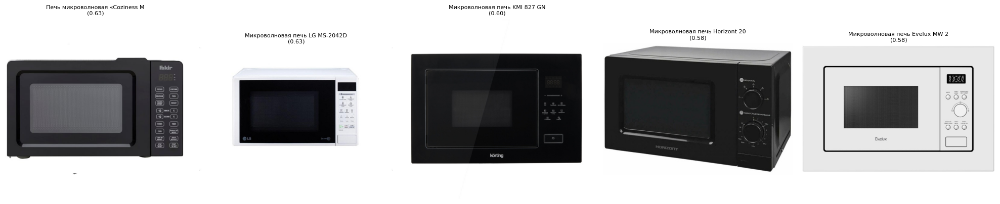

In [77]:
show_results(top_results)

#### RUSSIAN

In [ ]:
query = "бутылка для воды" #bottle for water
query_emb = encode_text_query(query, flup_dual_encoderv2)

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [79]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

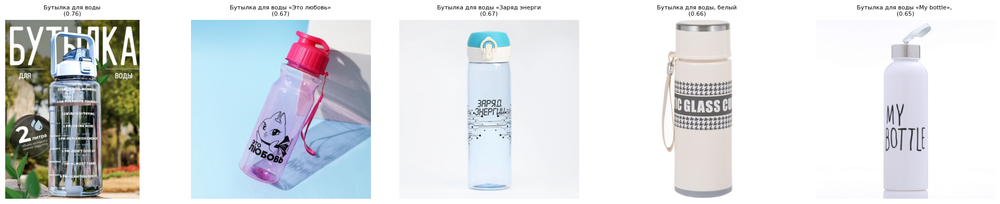

In [80]:
show_results(top_results)

#### KOREAN

In [ ]:
query = "베개" #pillow
query_emb = encode_text_query(query, flup_dual_encoderv2)

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [103]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

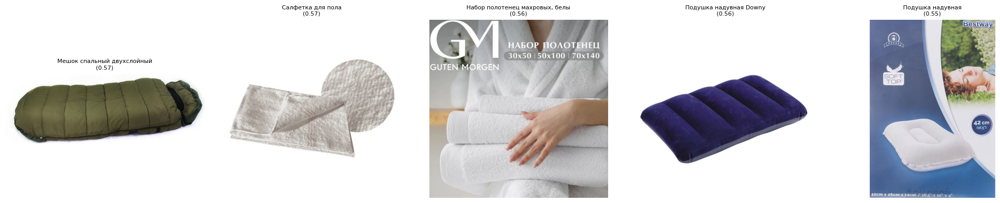

In [104]:
show_results(top_results)

#### GERMAN

In [ ]:
query = "Gasbrenner" #gas burner
query_emb = encode_text_query(query, flup_dual_encoderv2)

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [106]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

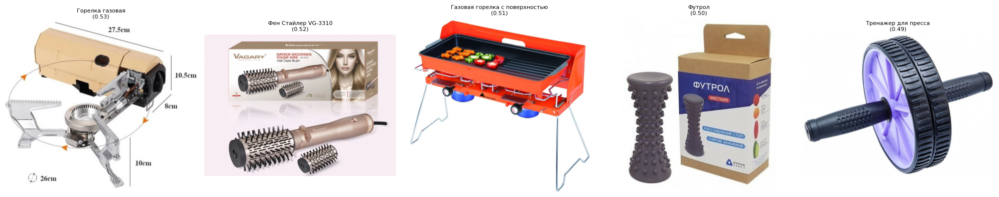

In [107]:
show_results(top_results)

### COMPARING EMBEDDING FEATURE SPACE WITH CLIP

In [151]:
test_images_paths = [r"C:\Users\User\Downloads\2229_19533_9089.jpg",
                     r"C:\Users\User\Downloads\images (1).jfif",
                     r"C:\Users\User\Downloads\images.jfif",
                     r"C:\Users\User\Downloads\sneakers.jpg",
                     r"C:\Users\User\Downloads\sport bag.jfif",
                     r"C:\Users\User\Downloads\bucket.jfif"]

test_images_labels = ['штаны',
                      'вентилятор',
                      'футболка',
                      'sneakers',
                      'sport bag',
                      'bucket']


📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


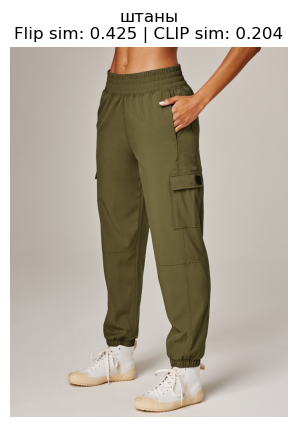

📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


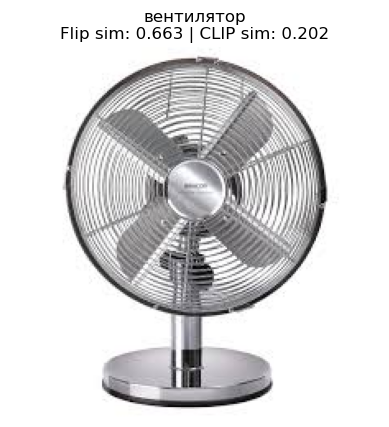

📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


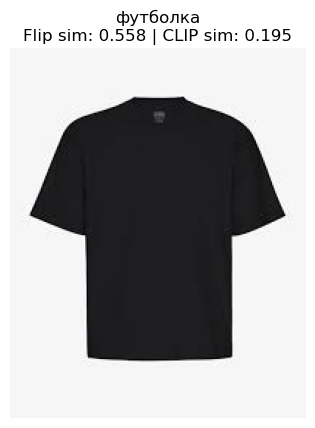

📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


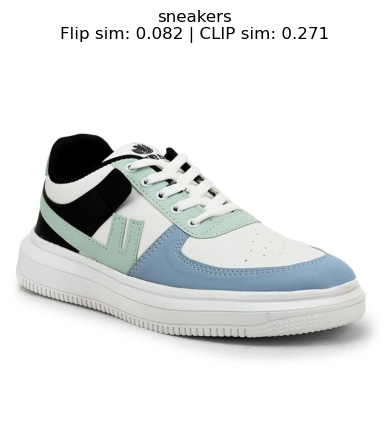

📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


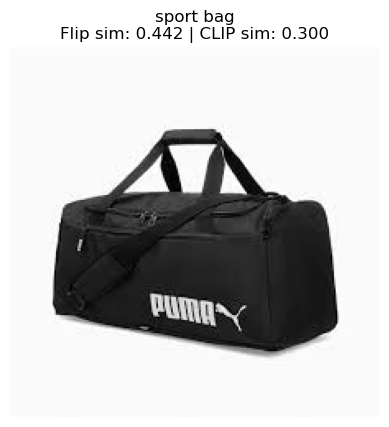

📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


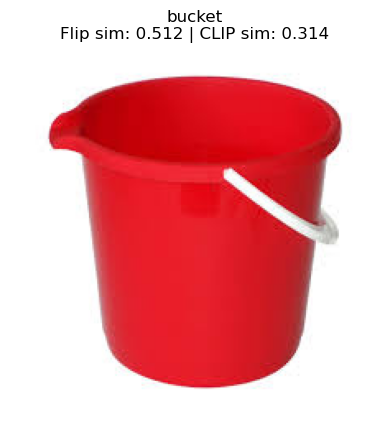

In [152]:
import torchvision.transforms as T
import torch.nn.functional as F


device = 'cpu'

flip_transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Loop through each image–text pair
for img_path, label in zip(test_images_paths, test_images_labels):
    # Load and show image
    image = Image.open(img_path).convert("RGB")

    # ----- CLIP -----
    clip_inputs = clip_processor(images=image, text=[label], return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        clip_outputs = clip_model(**clip_inputs)
        clip_image_embed = F.normalize(clip_outputs.image_embeds[0], dim=-1)
        clip_text_embed = F.normalize(clip_outputs.text_embeds[0], dim=-1)
        clip_sim = F.cosine_similarity(clip_image_embed, clip_text_embed, dim=0).item()

    # ----- Flip -----
    flip_img_tensor = flip_transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        flip_img_embed, flip_txt_embed = flup_dual_encoderv2(images=flip_img_tensor, texts=[label])
        flip_sim = F.cosine_similarity(flip_img_embed[0], flip_txt_embed[0], dim=0).item()

    # ----- Display -----
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"{label}\nFlip sim: {flip_sim:.3f} | CLIP sim: {clip_sim:.3f}")
    plt.show()
